# Data Loading, Cleaning and Feature Selection
The following tasks are executed:
- Data is loaded from raw files
- Columnnames are fixed
- Columns get correct object type
- Class columns are put as the last columns
- Missing data is replaced by NaN
- Data characteristics are visualized
- Missing data is visualized
- Data is saved to a new, cleaned file as a df

## Parameters
Here, all parameters of the notebook are set

In [12]:
#Define a config file here to have a static start. If nothing is 
#config_file_path = "config_5dTrend_Training.json"
config_file_path = None

In [13]:
#Default notebook parameters as dict
default_config = dict()
default_config['use_training_settings'] = True
default_config['dataset_name'] = "omxs30_train"
default_config['source_path'] = '01_Source/^OMX_1986-2018.csv'
default_config['class_name'] = "LongTrend"
#Binarize labels
default_config['binarize_labels'] = True
default_config['class_number'] = 1   #Class number in outcomes, which shall be the "1" class
default_config['binary_1_label'] = "Pos. Trend"
default_config['binary_0_label'] = "Neg. Trend"

In [14]:
#Default test notebook parameters as dict
default_test_config = dict()
default_test_config['use_training_settings'] = False
default_test_config['dataset_name'] = "omxs30_test"
default_test_config['source_path'] = '01_Source/^OMX_2018-2020.csv'
default_test_config['class_name'] = "LongTrend"
#Binarize labels
default_test_config['binarize_labels'] = True
default_config['class_number'] = 1   #Class number in outcomes, which shall be the "1" class
default_test_config['binary_1_label'] = "Pos. Trend"
default_test_config['binary_0_label'] = "Neg. Trend"

In [15]:
import joblib
import json

if config_file_path is None:
    #Use file default or set config
    #Use default
    conf = default_config
    #config = default_test_config
    
else:
    #A config path was given
    #Load config from path
    with open(config_file_path, 'r') as fp:
        conf = json.load(fp)
        
    print("Loaded notebook parameters from config file: ", config_file_path)
print("Loaded config: ",json.dumps(conf, indent=2)) 

Loaded config:  {
  "use_training_settings": true,
  "dataset_name": "omxs30_train",
  "source_path": "01_Source/^OMX_1986-2018.csv",
  "class_name": "LongTrend",
  "binarize_labels": true,
  "class_number": 1,
  "binary_1_label": "Pos. Trend",
  "binary_0_label": "Neg. Trend"
}


In [16]:
# Constants for all notebooks in the Machine Learning Toolbox

print("Directories")
training_data_directory = "02_Training_Data"
print("Training data directory: ", training_data_directory)

training_image_save_directory = training_data_directory + '/images'
print("Training data image save directory: ", training_image_save_directory)

test_data_directory = "03_Test_Prepared_Data"
print("Test data directory: ", test_data_directory)

test_image_save_directory = test_data_directory + '/images'
print("Training data image save directory: ", test_image_save_directory)

Directories
Training data directory:  02_Training_Data
Training data image save directory:  02_Training_Data/images
Test data directory:  03_Test_Prepared_Data
Training data image save directory:  03_Test_Prepared_Data/images


In [17]:
#Secondary parameters for training and test settings
#Allow cropping of data, which are longer than moving averages in the future. For training data, this value shall be 
#true to not make false values. For the test values, which do not use any y values, the value shall be false.
#cut_data = conf['use_training_settings']   #If training settings are used, then cut the data. If test settings, do not cut the data
#print("cut_data =", cut_data)

if conf['use_training_settings']==True:
    target_directory = training_data_directory
    image_save_directory = training_image_save_directory
    
    #To save time in the generation of test data and to skip the feature analysis, set this option to false. For training
    #data, set it to true.
    skip_feature_analysis = False
    skip_feature_selection = False
else:
    target_directory = test_data_directory
    image_save_directory = test_image_save_directory
    
    #To save time in the generation of test data and to skip the feature analysis, set this option to false. For training
    #data, set it to true.
    skip_feature_analysis = True
    skip_feature_selection = True

print("Use training settings=", conf['use_training_settings'])
print("target directory=", target_directory)
print("Image save directory=", image_save_directory)
print("Skip feature analysis=", skip_feature_analysis)
print("Skip feature selection", skip_feature_selection)

Use training settings= True
target directory= 02_Training_Data
Image save directory= 02_Training_Data/images
Skip feature analysis= False
Skip feature selection False


In [18]:
# Generating filenames for saving the files
features_filename = target_directory + "/" + conf['dataset_name'] + "_features" + ".csv"
model_features_filename = target_directory + "/" + conf['dataset_name'] + "_" + conf['class_name'] + "_features_for_model" + ".csv"
outcomes_filename = target_directory + "/" + conf['dataset_name'] + "_outcomes" + ".csv"
model_outcomes_filename = target_directory + "/" + conf['dataset_name'] + "_" + conf['class_name'] + "_outcomes_for_model" + ".csv"
labels_filename = target_directory + "/" + conf['dataset_name'] + "_labels" + ".csv"
source_filename = target_directory + "/" + conf['dataset_name'] + "_source" + ".csv"
#Modified labels
model_labels_filename = target_directory + "/" + conf['dataset_name'] + "_" + conf['class_name'] + "_labels_for_model" + ".csv"
#Columns for feature selection
selected_feature_columns_filename = target_directory + "/" + conf['dataset_name'] + "_" + conf['class_name'] + "_selected_feature_columns.csv"

print("=== Paths ===")
print("Input Features: ", features_filename)
print("Output Features: ", model_features_filename)
print("Input Outcomes: ", outcomes_filename)
print("Output Outcomes: ", model_outcomes_filename)
print("Labels: ", labels_filename)
print("Original source: ", source_filename)
print("Labels for the model: ", model_labels_filename)
print("Selected feature columns: ", selected_feature_columns_filename)

=== Paths ===
Input Features:  02_Training_Data/omxs30_train_features.csv
Output Features:  02_Training_Data/omxs30_train_LongTrend_features_for_model.csv
Input Outcomes:  02_Training_Data/omxs30_train_outcomes.csv
Output Outcomes:  02_Training_Data/omxs30_train_LongTrend_outcomes_for_model.csv
Labels:  02_Training_Data/omxs30_train_labels.csv
Original source:  02_Training_Data/omxs30_train_source.csv
Labels for the model:  02_Training_Data/omxs30_train_LongTrend_labels_for_model.csv
Selected feature columns:  02_Training_Data/omxs30_train_LongTrend_selected_feature_columns.csv


## Load dataset

In [19]:
# Import libraries
#%matplotlib notebook
%matplotlib inline
import numpy as np
import pandas as pd
import scipy.stats
from math import sqrt
import matplotlib.pyplot as plt
import matplotlib as m
from matplotlib.ticker import FuncFormatter, MaxNLocator
import DatavisualizationFunctions as vis
import DataSupportFunctions as sup

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

#Global settings
np.set_printoptions(precision=3)

#Suppress print out in scientific notiation
np.set_printoptions(suppress=True)

#Load skip cell kernel extension
#Source: https://stackoverflow.com/questions/26494747/simple-way-to-choose-which-cells-to-run-in-ipython-notebook-during-run-all
#%%skip True  #skips cell
#%%skip False #won't skip
#should_skip = True
#%%skip $should_skip
%load_ext skip_kernel_extension

The skip_kernel_extension extension is already loaded. To reload it, use:
  %reload_ext skip_kernel_extension


### Load Features and Outcomes

In [21]:
#=== Load Features ===#
features_raw = pd.read_csv(features_filename, sep=';').set_index('id') #Set ID to be the data id
display(features_raw.head(1))

#=== Load Outcomes ===#
outcomes_raw = pd.read_csv(outcomes_filename, sep=';').set_index('id') #Set ID to be the data id
display(outcomes_raw.head(1))

#=== Load Source ===#
source = pd.read_csv(source_filename, sep=';').set_index('id') #Set ID to be the data id
display(source.head(1))

#=== Load Class Labels ===#
#Get classes into a dict from outcomes
#class_labels = dict(zip(outcomes[class_name].unique(), list(range(1,len(outcomes[class_name].unique())+1, 1))))
#print(class_labels)

#Load class labels file
df_y_classes = pd.read_csv(labels_filename, delimiter=';', header=None)
class_labels = sup.inverse_dict(df_y_classes.set_index(df_y_classes.columns[0]).to_dict()[1])
print("Loaded  classes from file", class_labels)

#=== Define classes manually ===#
#class_labels = {
#    0 : 'class1',
#    1 : 'class2'
#}

print(class_labels)

#=== Define index name ===#
#Define name if there is no index name

#df.index.name = 'id'

#=== rename colums ===#
#df.rename(columns={'model.year':'year'}, inplace=True)

#Rename columns with " "
features_raw.columns = [x.replace(" ", "_") for x in features_raw.columns]
features_raw.columns = [x.replace("/", "-") for x in features_raw.columns]

print("Features size : ", features_raw.shape)
display(features_raw.head(5))
print("Outcomes size : ", outcomes_raw.shape)
display(outcomes_raw.head(5))

,NormKurs5,NormKurs20,NormKurs50,NormKurs100,NormKurs200,NumberRise5,NumberRise20,NumberRise50,NumberRise100,NumberRise200,...,month_year__9,month_year__10,month_year__11,month_year__12,week_month__1,week_month__2,week_month__3,week_month__4,week_month__5,week_month__6
id,,,,,,,,,,,,,,,,,,,,,
400,0.165017,0.387097,0.627146,0.86165,0.481655,0.6,0.6,0.64,0.63,0.57,...,0,0,0,0,0,0,1,0,0,0


,1dTrend,5dTrend,20dTrend,LongTrend
id,,,,
400,0,0,1,1


,Date,Open,High,Low,Close
id,,,,,
400,1988-05-09,129.48,129.71,129.71,129.71


Loaded  classes from file {0: 'neutral', 1: 'positive', 2: 'negative'}
{0: 'neutral', 1: 'positive', 2: 'negative'}
Features size :  (7653, 127)


,NormKurs5,NormKurs20,NormKurs50,NormKurs100,NormKurs200,NumberRise5,NumberRise20,NumberRise50,NumberRise100,NumberRise200,...,month_year__9,month_year__10,month_year__11,month_year__12,week_month__1,week_month__2,week_month__3,week_month__4,week_month__5,week_month__6
id,,,,,,,,,,,,,,,,,,,,,
400,0.165017,0.387097,0.627146,0.861650,0.481655,0.6,0.60,0.64,0.63,0.570,...,0,0,0,0,0,0,1,0,0,0
401,0.280000,0.404570,0.622979,0.865595,0.483685,0.6,0.60,0.64,0.64,0.570,...,0,0,0,0,0,0,1,0,0,0
402,0.000000,0.265668,0.447686,0.825659,0.467135,0.6,0.55,0.62,0.64,0.565,...,0,0,0,0,0,0,1,0,0,0
403,0.000000,0.338262,0.435614,0.818681,0.465262,0.6,0.55,0.60,0.63,0.560,...,0,0,0,0,0,0,1,0,0,0
404,1.000000,0.576710,0.565392,0.857379,0.485402,0.6,0.60,0.60,0.63,0.560,...,0,0,0,0,0,0,0,1,0,0


Outcomes size :  (7653, 4)


,1dTrend,5dTrend,20dTrend,LongTrend
id,,,,
400,0,0,1,1
401,0,0,1,1
402,0,0,1,1
403,1,0,1,1
404,0,0,1,1


### Load Time Series

In [22]:
#Load original data for visualization
import matplotlib.dates as mdates
import datetime

source = pd.read_csv(source_filename, delimiter=';').set_index('id')
source['Date'] = pd.to_datetime(source['Date'])
source['Date'].apply(mdates.date2num)
print("Loaded source time graph={}".format(source.columns))
print("X. Shape={}".format(source.shape))
display(source.head())

Loaded source time graph=Index(['Date', 'Open', 'High', 'Low', 'Close'], dtype='object')
X. Shape=(7653, 5)


,Date,Open,High,Low,Close
id,,,,,
400,1988-05-09,129.48,129.71,129.71,129.71
401,1988-05-10,129.71,129.84,129.84,129.84
402,1988-05-11,129.84,128.78,128.78,128.78
403,1988-05-13,128.78,128.66,128.66,128.66
404,1988-05-16,128.66,129.95,129.95,129.95


## Data Cleanup of Features and Outcomes before Features are Modified

In [23]:
#Strip all string values to find the missing data
from pandas.api.types import is_string_dtype

for col in features_raw.columns:
    if is_string_dtype(features_raw[col]):
        print("Strip column {}".format(col))
        features_raw[col]=features_raw[col].str.strip()

In [24]:
#Replace values for missing data

#=== Replace all missing values with np.nan
for col in features_raw.columns[0:-1]:
    features_raw[col] = features_raw[col].replace('?', np.nan)
    #df[col] = df[col].replace('unknown', np.nan)
    
print("Missing data in the data frame")
print(sum(features_raw.isna().sum()))

Missing data in the data frame
0


In [25]:
#Get column types
print("Column types:")
print(features_raw.dtypes)
print("\n")

Column types:
NormKurs5        float64
NormKurs20       float64
NormKurs50       float64
NormKurs100      float64
NormKurs200      float64
                  ...   
week_month__2      int64
week_month__3      int64
week_month__4      int64
week_month__5      int64
week_month__6      int64
Length: 127, dtype: object




In [26]:
print("feature columns: {}\n".format(features_raw.columns))
print("Outcome column: {}".format(outcomes_raw[conf['class_name']].name))

feature columns: Index(['NormKurs5', 'NormKurs20', 'NormKurs50', 'NormKurs100', 'NormKurs200',
       'NumberRise5', 'NumberRise20', 'NumberRise50', 'NumberRise100',
       'NumberRise200',
       ...
       'month_year__9', 'month_year__10', 'month_year__11', 'month_year__12',
       'week_month__1', 'week_month__2', 'week_month__3', 'week_month__4',
       'week_month__5', 'week_month__6'],
      dtype='object', length=127)

Outcome column: LongTrend


## Get Feature and Outcome Characteristics

In [27]:
#Show possible classes
print(class_labels)

{0: 'neutral', 1: 'positive', 2: 'negative'}


In [28]:
# Get number of samples
numSamples=features_raw.shape[0]
print("Number of samples={}".format(numSamples))

# Get number of features
numFeatures=features_raw.shape[1]
print("Number of features={}".format(numFeatures))

#Get the number of classes for the supervised learning
numClasses = outcomes_raw[conf['class_name']].value_counts().shape[0]
print("Number of classes={}".format(numClasses))

Number of samples=7653
Number of features=127
Number of classes=2


## Analyse and Transform time series

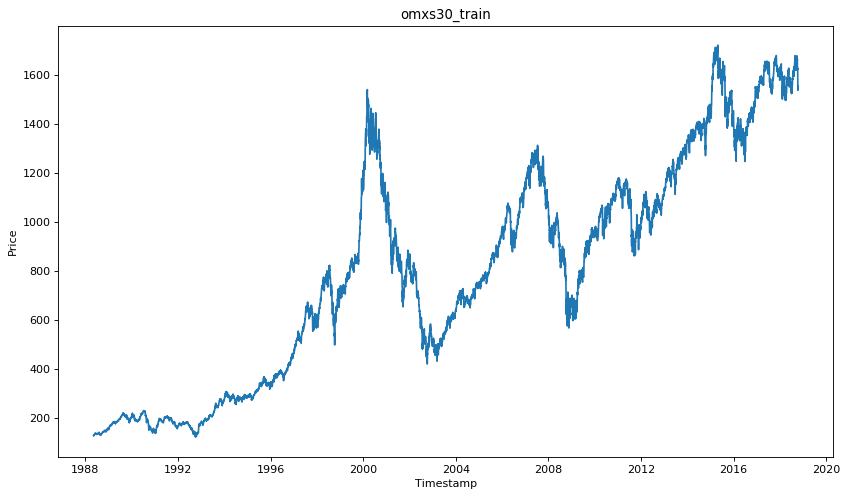

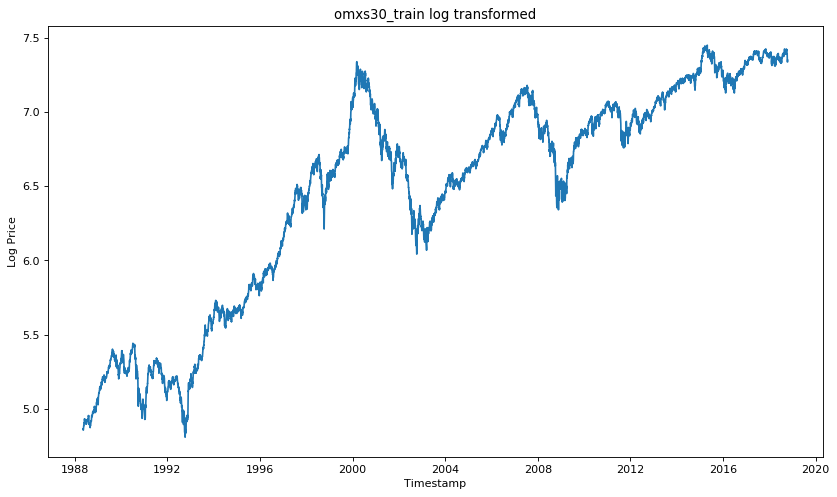

In [29]:
m.rc_file_defaults() #Reset sns

datatitle = conf['dataset_name']

plt.figure(num=None, figsize=(12.5, 7), dpi=80, facecolor='w', edgecolor='k')
plt.plot(source['Date'],source['Close']) #To get scatter plot, add 'o' as the last parameter
plt.title(datatitle)
plt.xlabel("Timestamp")
plt.ylabel("Price")
plt.show()

plt.figure(num=None, figsize=(12.5, 7), dpi=80, facecolor='w', edgecolor='k')
plt.plot(source['Date'],np.log(source['Close']))
plt.title(datatitle + ' log transformed')
plt.xlabel("Timestamp")
plt.ylabel("Log Price")
plt.show()

## Analyse the Features Individually

In [30]:
# Print graphs for all features

def print_characteristics(features_raw, save_graphs=False):
    for i, d in enumerate(features_raw.dtypes):
        if is_string_dtype(d):
            print("Column {} is a categorical string".format(features_raw.columns[i]))
            s = features_raw[features_raw.columns[i]].value_counts()/numSamples
            fig = vis.paintBarChartForCategorical(s.index, s)
        else:
            print("Column {} is a numerical value".format(features_raw.columns[i]))
            fig = vis.paintHistogram(features_raw, features_raw.columns[i])

        plt.figure(fig.number)
        if save_graphs == True:
            plt.savefig(image_save_directory + '/{}-{}'.format(i, features_raw.columns[i]), dpi=300)
        plt.show()

Column NormKurs5 is a numerical value
Number of unique features 3395 
Number of bins with Freedman und Diaconis:  10
n=7653, q25=0.03, q75=1.00, min=0.00, max=1.00, interval length=0.10. Number of intervals=10
Feature characteristics for NormKurs5:
Min value =  0.0
Max value =  1.0
Mean =  0.55
Median = 0.6311475409836039
Standard deviation = 0.4177
Skew = -0.2104
kurtosis = -1.656


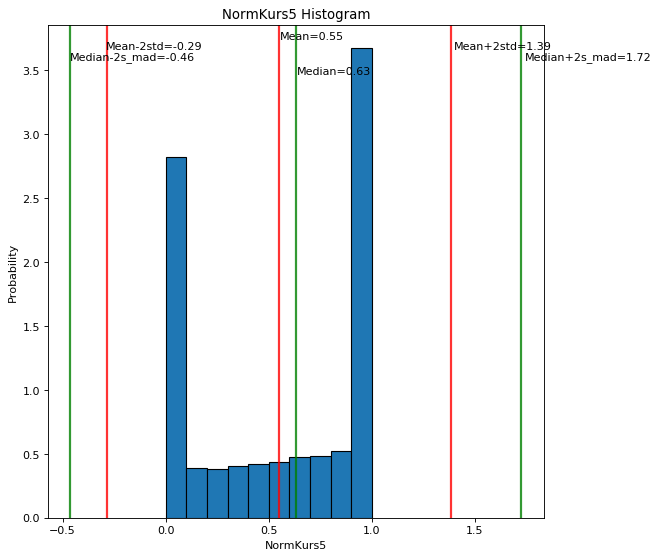

Column NormKurs20 is a numerical value
Number of unique features 5548 
Number of bins with Freedman und Diaconis:  14
n=7653, q25=0.26, q75=0.94, min=0.00, max=1.00, interval length=0.07. Number of intervals=14
Feature characteristics for NormKurs20:
Min value =  0.0
Max value =  1.0
Mean =  0.59
Median = 0.6659829059829067
Standard deviation = 0.3574
Skew = -0.3684
kurtosis = -1.3254


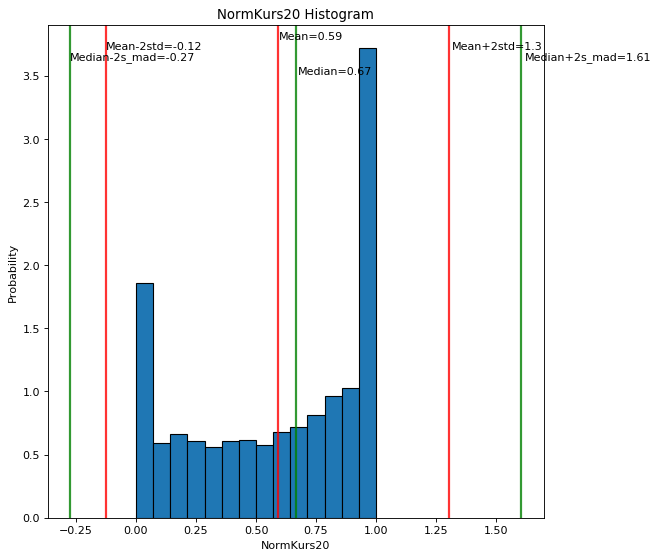

Column NormKurs50 is a numerical value
Number of unique features 6230 
Number of bins with Freedman und Diaconis:  16
n=7653, q25=0.33, q75=0.93, min=0.00, max=1.00, interval length=0.06. Number of intervals=16
Feature characteristics for NormKurs50:
Min value =  0.0
Max value =  1.0
Mean =  0.62
Median = 0.7158040027605242
Standard deviation = 0.3346
Skew = -0.5214
kurtosis = -1.1212


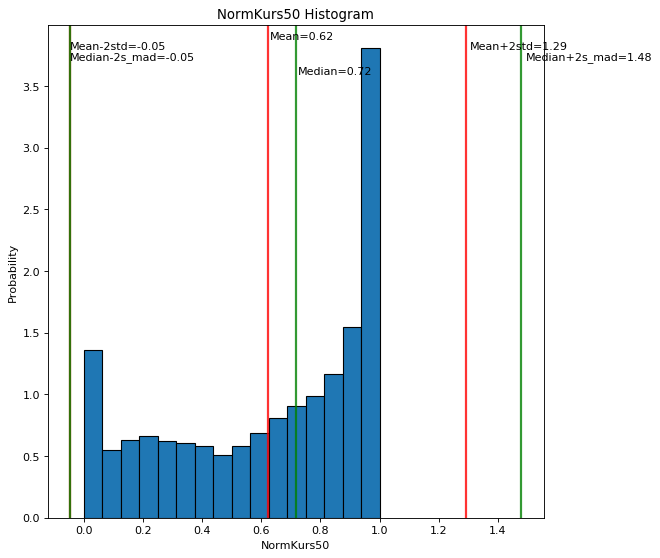

Column NormKurs100 is a numerical value
Number of unique features 6533 
Number of bins with Freedman und Diaconis:  17
n=7653, q25=0.37, q75=0.94, min=0.00, max=1.00, interval length=0.06. Number of intervals=17
Feature characteristics for NormKurs100:
Min value =  0.0
Max value =  1.0
Mean =  0.65
Median = 0.7537030346820801
Standard deviation = 0.3261
Skew = -0.5984
kurtosis = -1.04


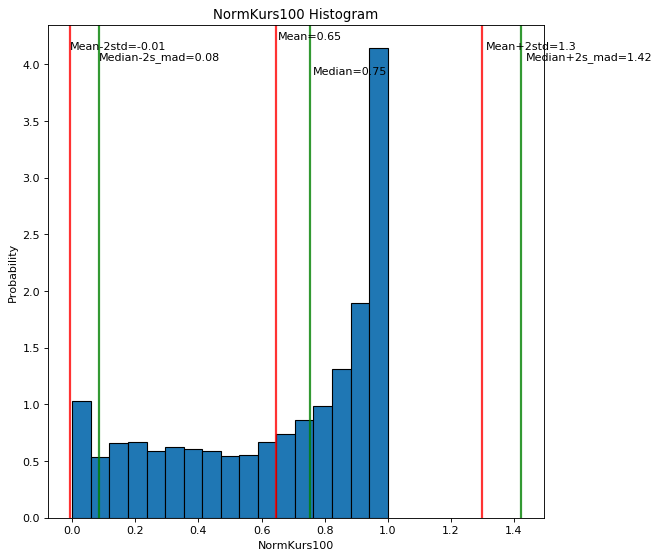

Column NormKurs200 is a numerical value
Number of unique features 6738 
Number of bins with Freedman und Diaconis:  19
n=7653, q25=0.41, q75=0.94, min=0.00, max=1.00, interval length=0.05. Number of intervals=19
Feature characteristics for NormKurs200:
Min value =  0.0
Max value =  1.0
Mean =  0.66
Median = 0.7711794968232435
Standard deviation = 0.3172
Skew = -0.6827
kurtosis = -0.8961


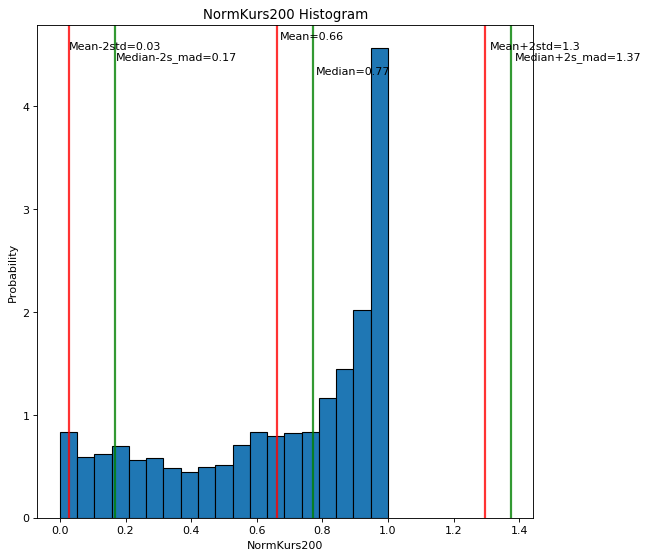

Column NumberRise5 is a numerical value
Number of unique features 6 
Number of bins = number of features {}:  6
n=7653, q25=0.40, q75=0.60, min=0.00, max=1.00, interval length=0.02. Number of intervals=6
Feature characteristics for NumberRise5:
Min value =  0.0
Max value =  1.0
Mean =  0.53
Median = 0.6
Standard deviation = 0.2257
Skew = -0.0347
kurtosis = -0.4062


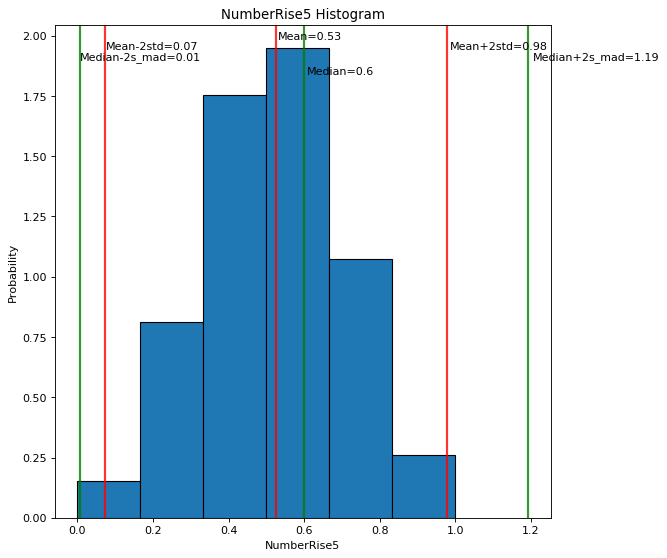

Column NumberRise20 is a numerical value
Number of unique features 16 
Number of bins = number of features {}:  16
n=7653, q25=0.45, q75=0.60, min=0.15, max=0.90, interval length=0.02. Number of intervals=16
Feature characteristics for NumberRise20:
Min value =  0.15
Max value =  0.9
Mean =  0.53
Median = 0.55
Standard deviation = 0.1182
Skew = 0.0334
kurtosis = -0.347


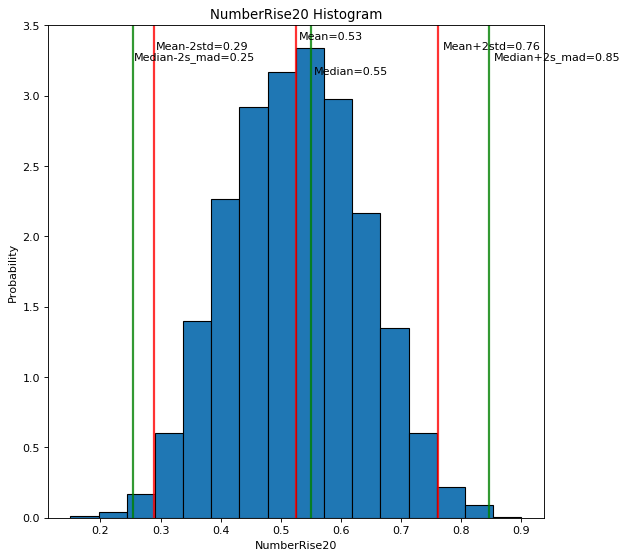

Column NumberRise50 is a numerical value
Number of unique features 27 
Number of bins = number of features {}:  27
n=7653, q25=0.48, q75=0.58, min=0.26, max=0.78, interval length=0.01. Number of intervals=27
Feature characteristics for NumberRise50:
Min value =  0.26
Max value =  0.78
Mean =  0.53
Median = 0.52
Standard deviation = 0.0783
Skew = 0.014
kurtosis = -0.0416


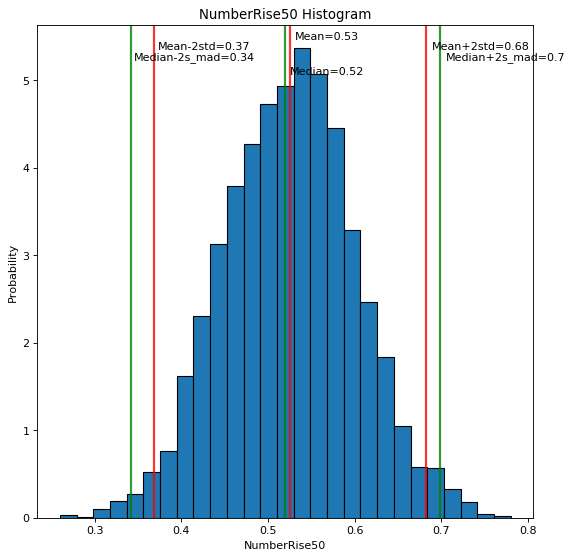

Column NumberRise100 is a numerical value
Number of unique features 41 
Number of bins = number of features {}:  41
n=7653, q25=0.49, q75=0.56, min=0.34, max=0.74, interval length=0.01. Number of intervals=41
Feature characteristics for NumberRise100:
Min value =  0.34
Max value =  0.74
Mean =  0.53
Median = 0.53
Standard deviation = 0.0591
Skew = -0.0687
kurtosis = 0.0394


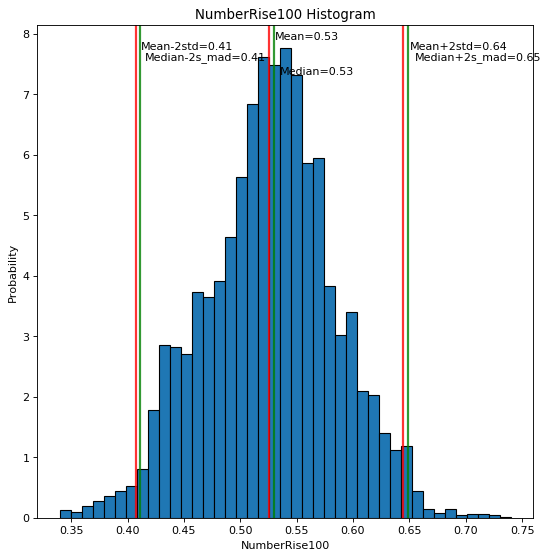

Column NumberRise200 is a numerical value
Number of unique features 47 
Number of bins with Freedman und Diaconis:  41
n=7653, q25=0.50, q75=0.56, min=0.41, max=0.64, interval length=0.01. Number of intervals=41
Feature characteristics for NumberRise200:
Min value =  0.41
Max value =  0.64
Mean =  0.53
Median = 0.53
Standard deviation = 0.046
Skew = -0.2089
kurtosis = -0.3643


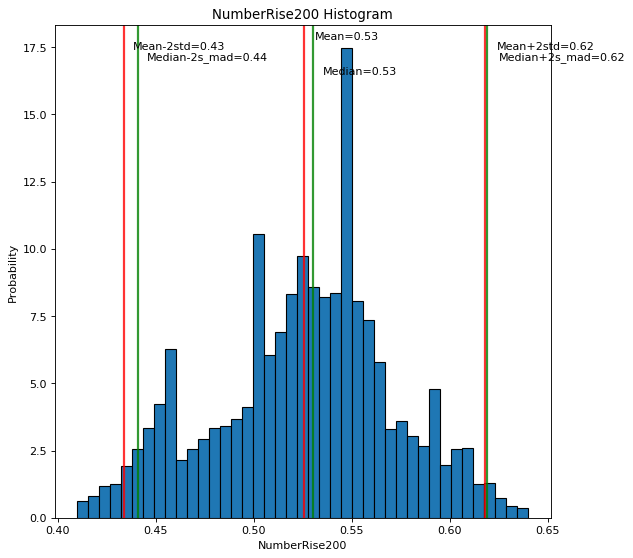

Column MA2Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  134
n=7653, q25=-0.00, q75=0.00, min=-0.05, max=0.05, interval length=0.00. Number of intervals=134
Feature characteristics for MA2Norm:
Min value =  -0.05218524078195865
Max value =  0.04599550597865965
Mean =  -0.0
Median = -0.00032289312237080136
Standard deviation = 0.0071
Skew = 0.0675
kurtosis = 4.3199


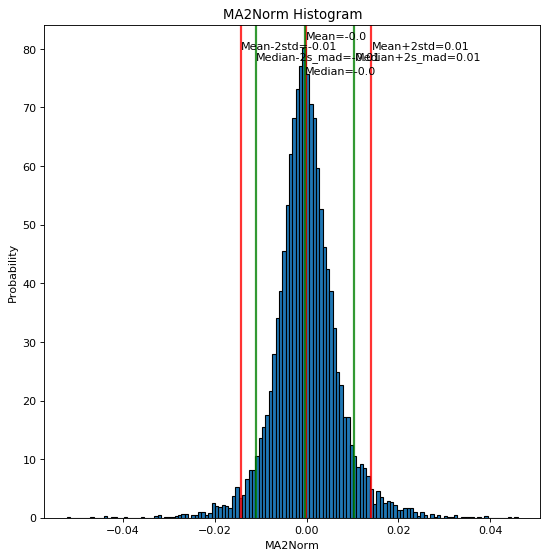

Column MA5Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  116
n=7653, q25=-0.01, q75=0.01, min=-0.10, max=0.10, interval length=0.00. Number of intervals=116
Feature characteristics for MA5Norm:
Min value =  -0.09645756457564714
Max value =  0.09596046346939492
Mean =  -0.0
Median = -0.0016671949286830392
Standard deviation = 0.0154
Skew = 0.4699
kurtosis = 3.2483


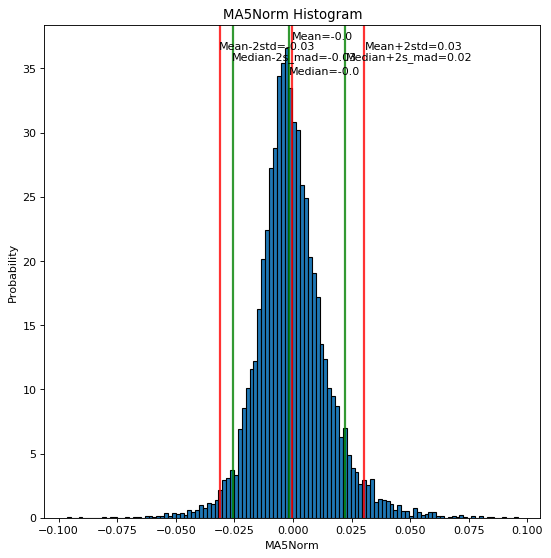

Column MA8Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  117
n=7653, q25=-0.01, q75=0.01, min=-0.12, max=0.14, interval length=0.00. Number of intervals=117
Feature characteristics for MA8Norm:
Min value =  -0.11993908993192527
Max value =  0.14134281999421555
Mean =  -0.0
Median = -0.0026796172680994147
Standard deviation = 0.0204
Skew = 0.6
kurtosis = 3.2111


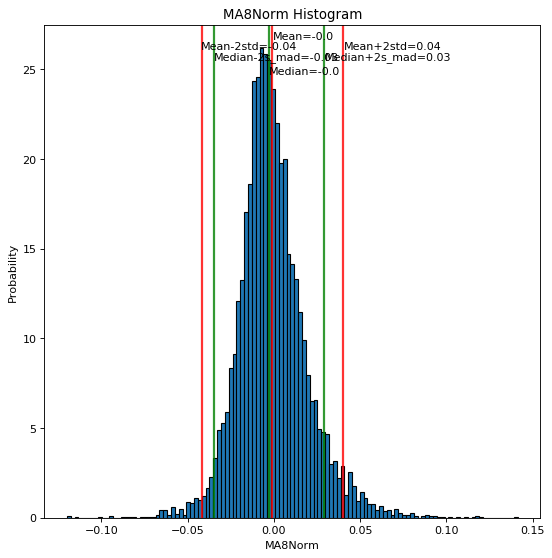

Column MA10Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  112
n=7653, q25=-0.01, q75=0.01, min=-0.13, max=0.16, interval length=0.00. Number of intervals=112
Feature characteristics for MA10Norm:
Min value =  -0.12773796727576628
Max value =  0.1607258659989083
Mean =  -0.0
Median = -0.003270153120111325
Standard deviation = 0.023
Skew = 0.6806
kurtosis = 3.2147


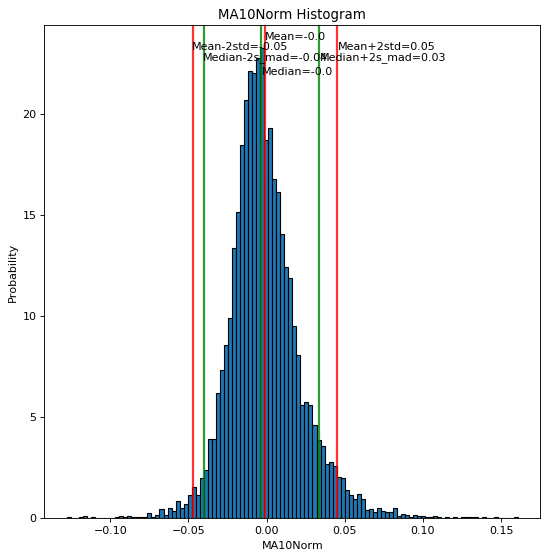

Column MA13Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  112
n=7653, q25=-0.02, q75=0.01, min=-0.14, max=0.20, interval length=0.00. Number of intervals=112
Feature characteristics for MA13Norm:
Min value =  -0.13559150750121884
Max value =  0.19846173602313533
Mean =  -0.0
Median = -0.004325554021919045
Standard deviation = 0.0265
Skew = 0.7722
kurtosis = 3.2796


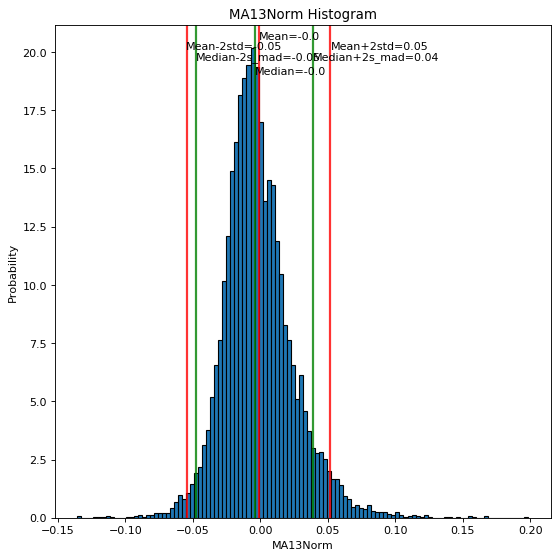

Column MA15Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  110
n=7653, q25=-0.02, q75=0.01, min=-0.14, max=0.22, interval length=0.00. Number of intervals=110
Feature characteristics for MA15Norm:
Min value =  -0.1412781257248916
Max value =  0.2160443887979324
Mean =  -0.0
Median = -0.004878048780489314
Standard deviation = 0.0286
Skew = 0.8019
kurtosis = 3.1539


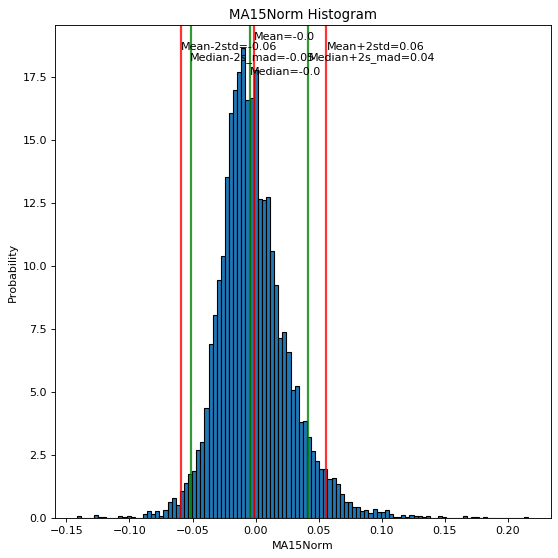

Column MA18Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  104
n=7653, q25=-0.02, q75=0.01, min=-0.15, max=0.23, interval length=0.00. Number of intervals=104
Feature characteristics for MA18Norm:
Min value =  -0.14944006288822045
Max value =  0.2285208014525141
Mean =  -0.0
Median = -0.006069065423213144
Standard deviation = 0.0316
Skew = 0.8352
kurtosis = 2.9049


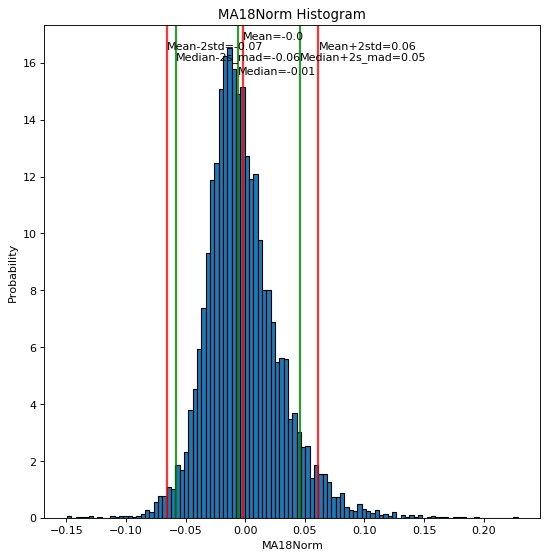

Column MA20Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  102
n=7653, q25=-0.02, q75=0.01, min=-0.16, max=0.24, interval length=0.00. Number of intervals=102
Feature characteristics for MA20Norm:
Min value =  -0.15528879610299212
Max value =  0.2366127323509575
Mean =  -0.0
Median = -0.006591566254844138
Standard deviation = 0.0336
Skew = 0.8573
kurtosis = 2.8489


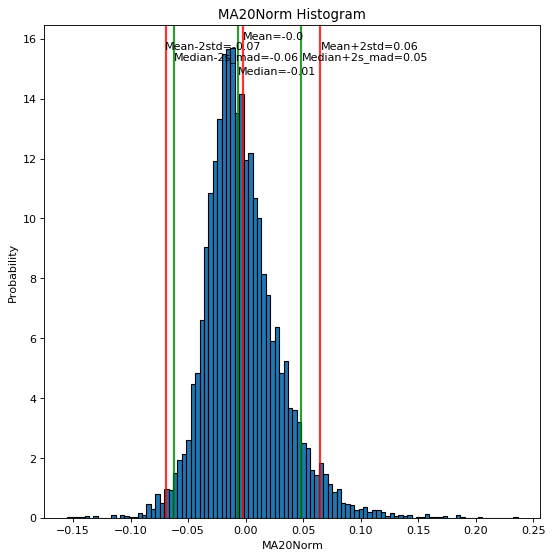

Column MA22Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  100
n=7653, q25=-0.02, q75=0.02, min=-0.16, max=0.25, interval length=0.00. Number of intervals=100
Feature characteristics for MA22Norm:
Min value =  -0.15842664642247056
Max value =  0.24643940123570499
Mean =  -0.0
Median = -0.007312264165526395
Standard deviation = 0.0354
Skew = 0.8769
kurtosis = 2.8068


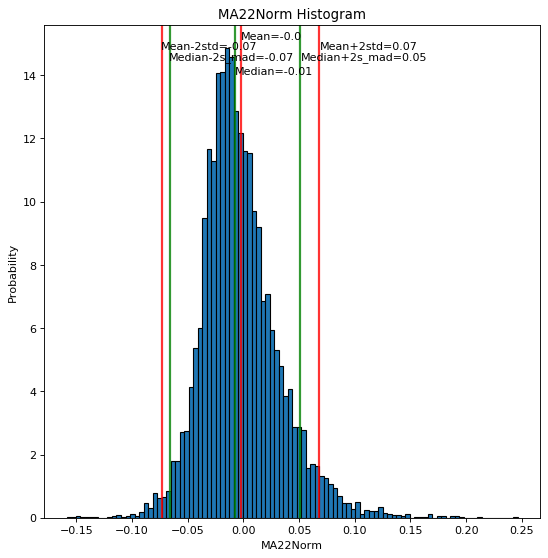

Column MA34Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  95
n=7653, q25=-0.03, q75=0.02, min=-0.19, max=0.29, interval length=0.01. Number of intervals=95
Feature characteristics for MA34Norm:
Min value =  -0.18716484506119865
Max value =  0.2943636185091406
Mean =  -0.0
Median = -0.010631557706978751
Standard deviation = 0.0454
Skew = 0.922
kurtosis = 2.7511


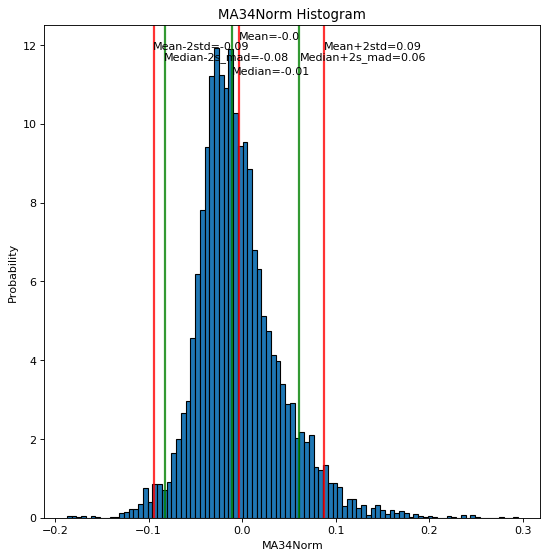

Column MA40Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  93
n=7653, q25=-0.04, q75=0.02, min=-0.20, max=0.31, interval length=0.01. Number of intervals=93
Feature characteristics for MA40Norm:
Min value =  -0.2004517476989117
Max value =  0.3076092998210879
Mean =  -0.0
Median = -0.011884424760097866
Standard deviation = 0.05
Skew = 0.9362
kurtosis = 2.7665


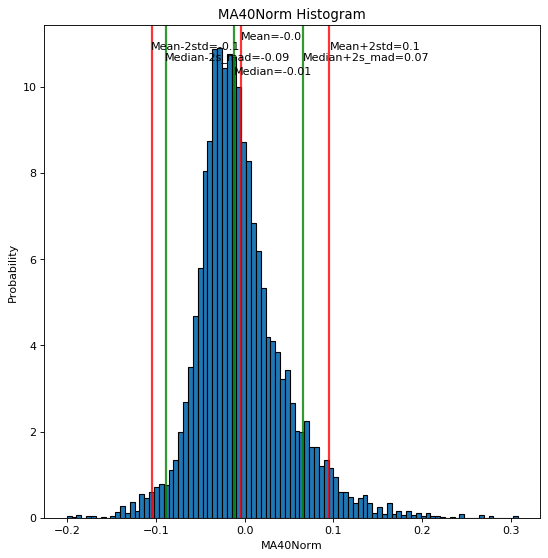

Column MA50Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  90
n=7653, q25=-0.04, q75=0.02, min=-0.21, max=0.34, interval length=0.01. Number of intervals=90
Feature characteristics for MA50Norm:
Min value =  -0.2107030323564291
Max value =  0.3441326362230984
Mean =  -0.01
Median = -0.015055342088661425
Standard deviation = 0.057
Skew = 0.9833
kurtosis = 2.7515


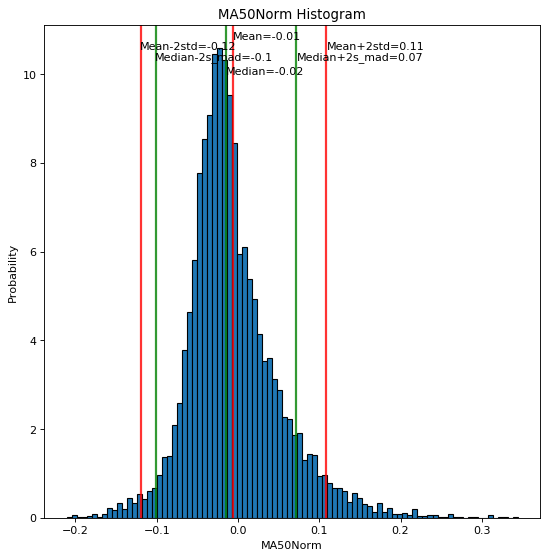

Column MA75Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  83
n=7653, q25=-0.05, q75=0.02, min=-0.22, max=0.41, interval length=0.01. Number of intervals=83
Feature characteristics for MA75Norm:
Min value =  -0.22466133278917533
Max value =  0.4071201668538447
Mean =  -0.01
Median = -0.021497817488456226
Standard deviation = 0.0724
Skew = 1.0834
kurtosis = 2.5328


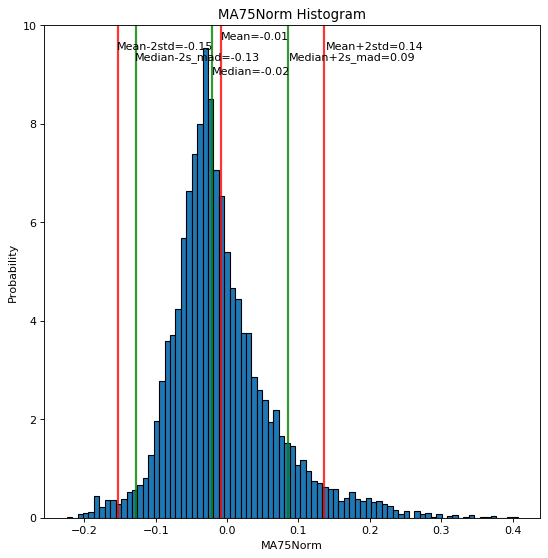

Column MA100Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  76
n=7653, q25=-0.06, q75=0.03, min=-0.26, max=0.44, interval length=0.01. Number of intervals=76
Feature characteristics for MA100Norm:
Min value =  -0.2555756787492979
Max value =  0.4421622463602546
Mean =  -0.01
Median = -0.027699538231475845
Standard deviation = 0.086
Skew = 1.1351
kurtosis = 2.3521


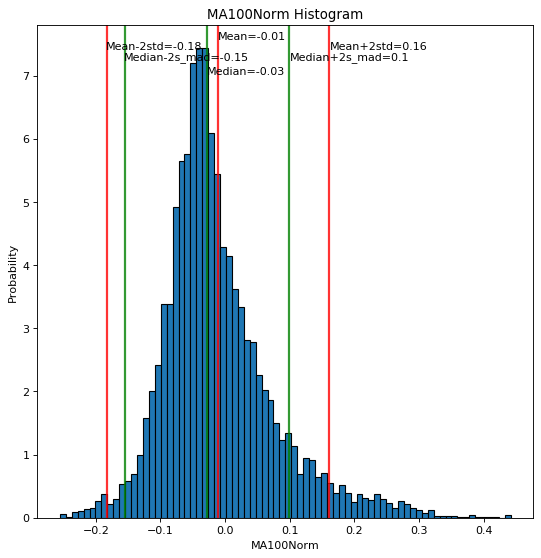

Column MA125Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  75
n=7653, q25=-0.08, q75=0.03, min=-0.29, max=0.50, interval length=0.01. Number of intervals=75
Feature characteristics for MA125Norm:
Min value =  -0.2939653599299363
Max value =  0.4972511854926981
Mean =  -0.01
Median = -0.03213367498314248
Standard deviation = 0.098
Skew = 1.165
kurtosis = 2.2123


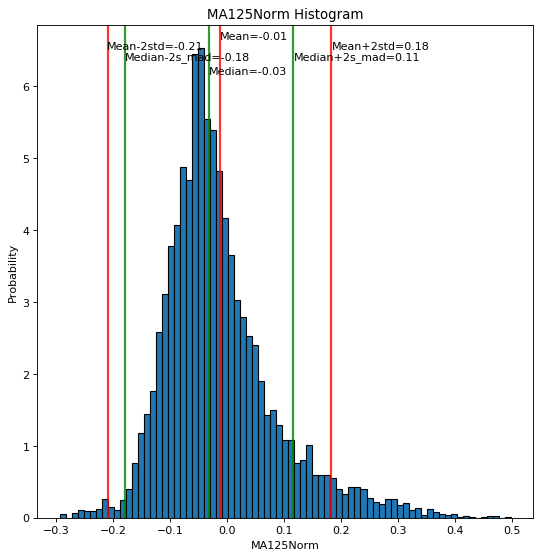

Column MA150Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  73
n=7653, q25=-0.09, q75=0.03, min=-0.32, max=0.53, interval length=0.01. Number of intervals=73
Feature characteristics for MA150Norm:
Min value =  -0.3205693854496657
Max value =  0.5304258509782107
Mean =  -0.02
Median = -0.037339197439058606
Standard deviation = 0.1086
Skew = 1.1814
kurtosis = 2.134


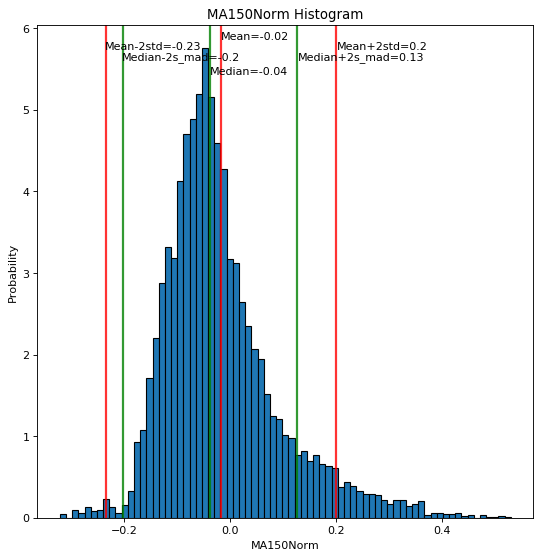

Column MA175Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  70
n=7653, q25=-0.09, q75=0.03, min=-0.34, max=0.55, interval length=0.01. Number of intervals=70
Feature characteristics for MA175Norm:
Min value =  -0.3409960311523413
Max value =  0.5457910604793557
Mean =  -0.02
Median = -0.043295080583918025
Standard deviation = 0.1179
Skew = 1.1739
kurtosis = 1.9709


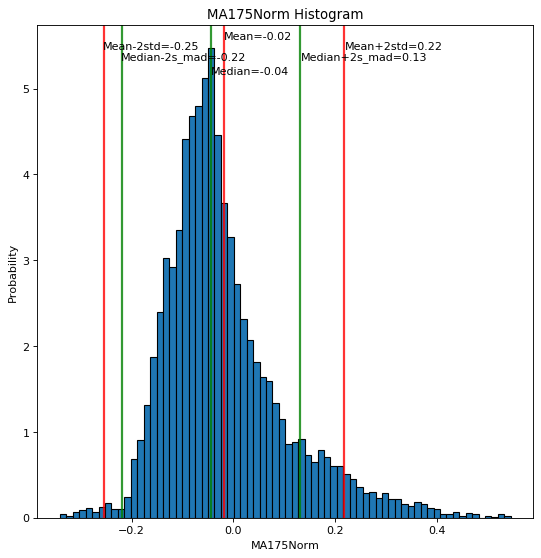

Column MA200Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  71
n=7653, q25=-0.10, q75=0.03, min=-0.36, max=0.58, interval length=0.01. Number of intervals=71
Feature characteristics for MA200Norm:
Min value =  -0.3575649014850423
Max value =  0.5783557699144379
Mean =  -0.02
Median = -0.048882827831877584
Standard deviation = 0.1265
Skew = 1.1604
kurtosis = 1.8154


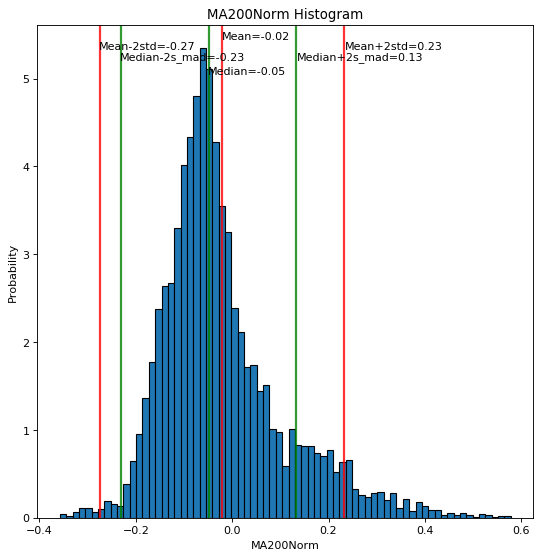

Column MA225Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  71
n=7653, q25=-0.11, q75=0.03, min=-0.37, max=0.62, interval length=0.01. Number of intervals=71
Feature characteristics for MA225Norm:
Min value =  -0.3726084112642615
Max value =  0.624454504038318
Mean =  -0.02
Median = -0.053030410926986384
Standard deviation = 0.135
Skew = 1.1535
kurtosis = 1.705


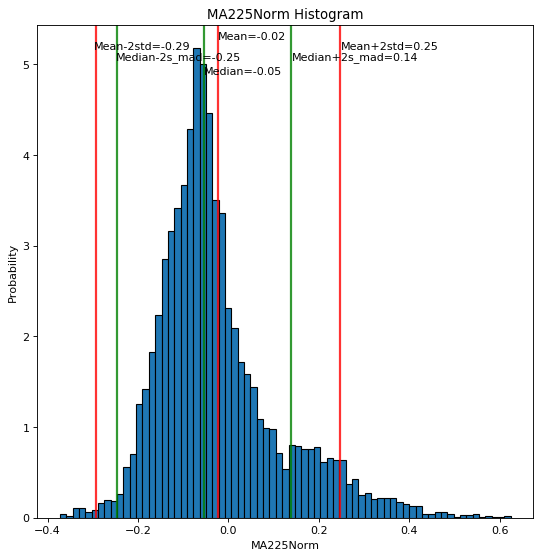

Column MA250Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  72
n=7653, q25=-0.12, q75=0.03, min=-0.39, max=0.64, interval length=0.01. Number of intervals=72
Feature characteristics for MA250Norm:
Min value =  -0.3872006400707715
Max value =  0.6433312272867596
Mean =  -0.03
Median = -0.05823883174227092
Standard deviation = 0.1433
Skew = 1.1566
kurtosis = 1.6191


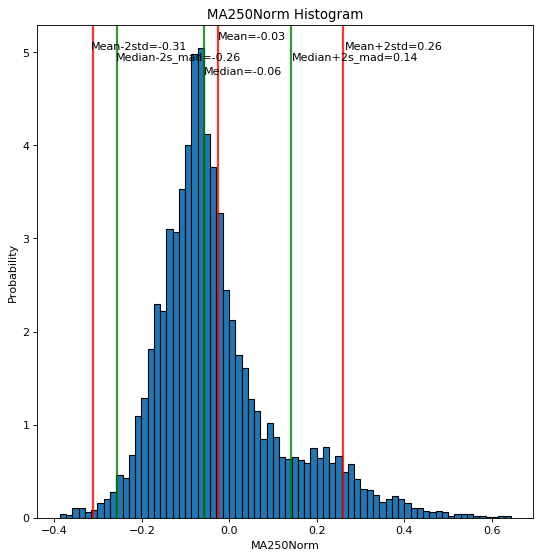

Column MA275Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  72
n=7653, q25=-0.12, q75=0.03, min=-0.40, max=0.67, interval length=0.01. Number of intervals=72
Feature characteristics for MA275Norm:
Min value =  -0.4000031932577313
Max value =  0.6692200144959343
Mean =  -0.03
Median = -0.06423327006179162
Standard deviation = 0.1516
Skew = 1.1785
kurtosis = 1.6166


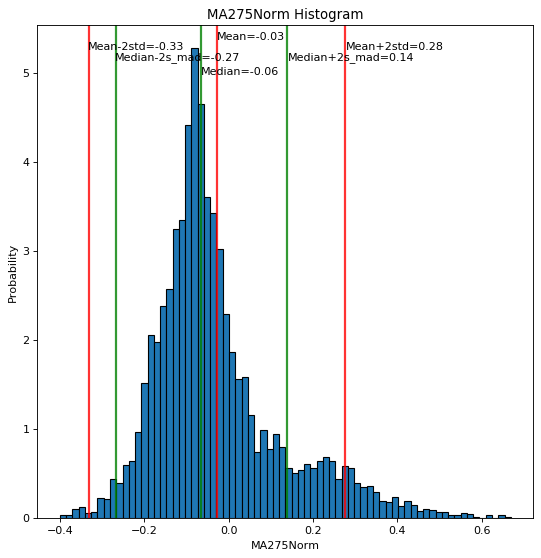

Column MA300Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  73
n=7653, q25=-0.13, q75=0.02, min=-0.41, max=0.70, interval length=0.02. Number of intervals=73
Feature characteristics for MA300Norm:
Min value =  -0.411281572596644
Max value =  0.7026428815433695
Mean =  -0.03
Median = -0.0695813806145192
Standard deviation = 0.1597
Skew = 1.2129
kurtosis = 1.6815


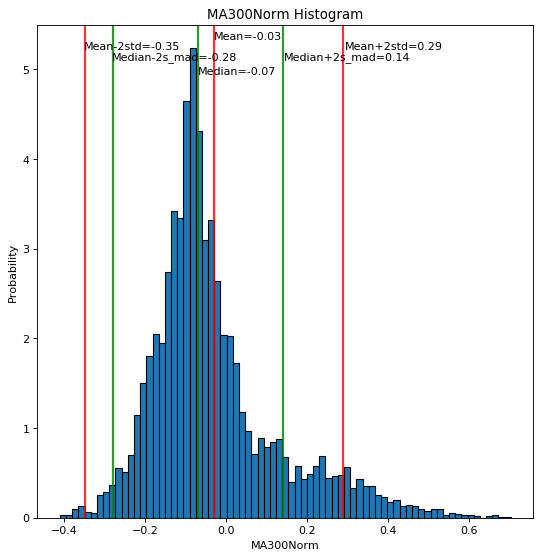

Column MA325Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  74
n=7653, q25=-0.13, q75=0.02, min=-0.42, max=0.74, interval length=0.02. Number of intervals=74
Feature characteristics for MA325Norm:
Min value =  -0.42232568053803576
Max value =  0.7356988761702966
Mean =  -0.03
Median = -0.07540805409743118
Standard deviation = 0.1675
Skew = 1.2463
kurtosis = 1.7453


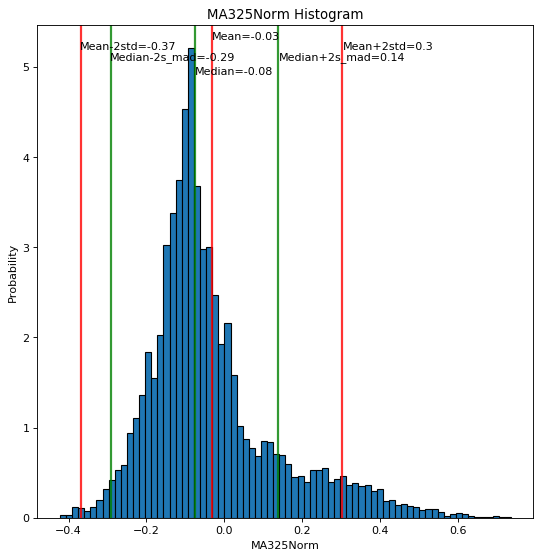

Column MA350Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  75
n=7653, q25=-0.14, q75=0.02, min=-0.43, max=0.77, interval length=0.02. Number of intervals=75
Feature characteristics for MA350Norm:
Min value =  -0.4344271840510137
Max value =  0.7693974893113349
Mean =  -0.03
Median = -0.08023463244696158
Standard deviation = 0.1747
Skew = 1.2797
kurtosis = 1.8218


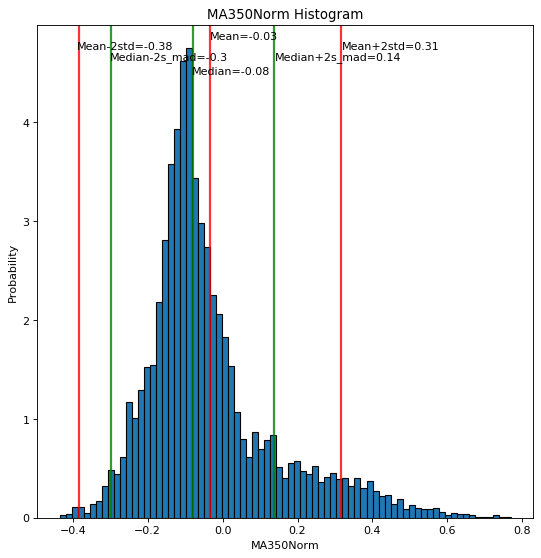

Column MA375Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  74
n=7653, q25=-0.14, q75=0.02, min=-0.45, max=0.80, interval length=0.02. Number of intervals=74
Feature characteristics for MA375Norm:
Min value =  -0.44683954648644203
Max value =  0.7974837794491461
Mean =  -0.04
Median = -0.08511862391358575
Standard deviation = 0.1815
Skew = 1.3115
kurtosis = 1.8976


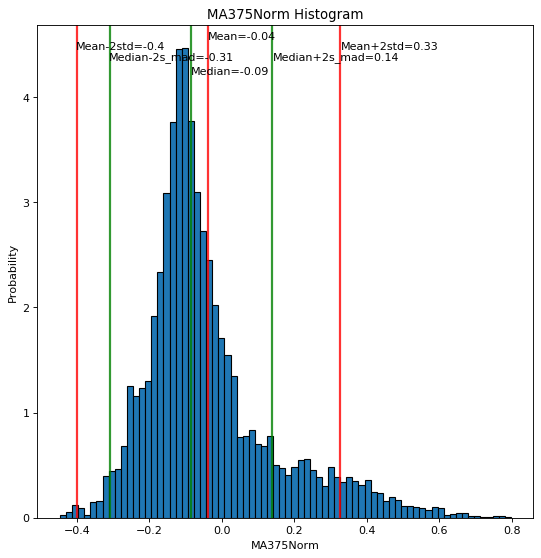

Column MA400Norm is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  73
n=7653, q25=-0.15, q75=0.02, min=-0.45, max=0.82, interval length=0.02. Number of intervals=73
Feature characteristics for MA400Norm:
Min value =  -0.4532537256151911
Max value =  0.8210164839936754
Mean =  -0.04
Median = -0.08970780535786753
Standard deviation = 0.1878
Skew = 1.3467
kurtosis = 1.9985


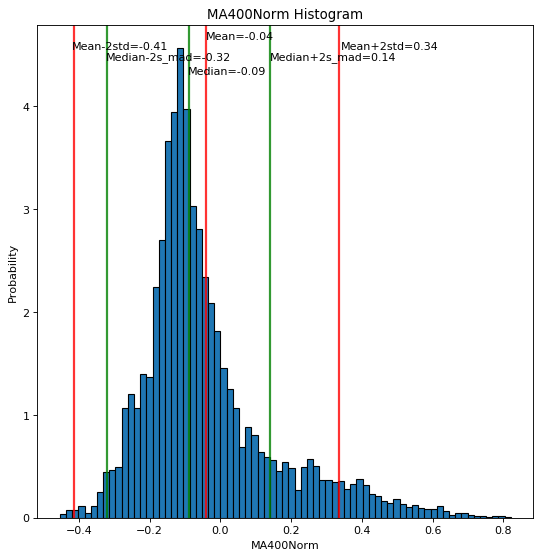

Column MA2NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  120
n=7653, q25=-0.01, q75=0.01, min=-0.07, max=0.05, interval length=0.00. Number of intervals=120
Feature characteristics for MA2NormDiff:
Min value =  -0.07049484763103052
Max value =  0.05493745307104738
Mean =  -0.0
Median = 0.00012427763250000496
Standard deviation = 0.0099
Skew = -0.3269
kurtosis = 4.5521


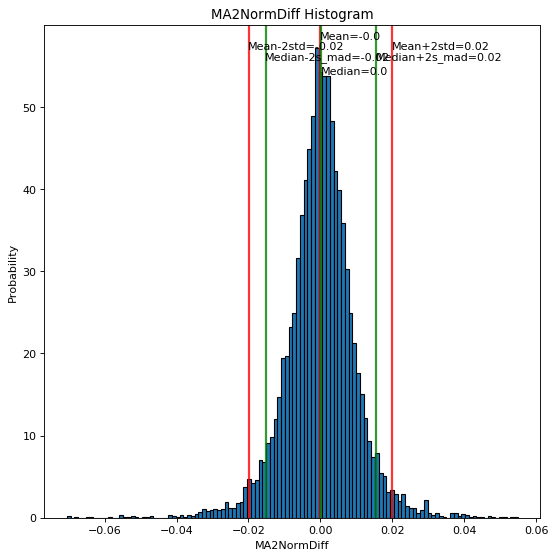

Column MA5NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  137
n=7653, q25=-0.01, q75=0.01, min=-0.10, max=0.08, interval length=0.00. Number of intervals=137
Feature characteristics for MA5NormDiff:
Min value =  -0.10133325706239146
Max value =  0.08217953343895837
Mean =  -0.0
Median = 0.00046898046648697315
Standard deviation = 0.0128
Skew = -0.51
kurtosis = 5.1852


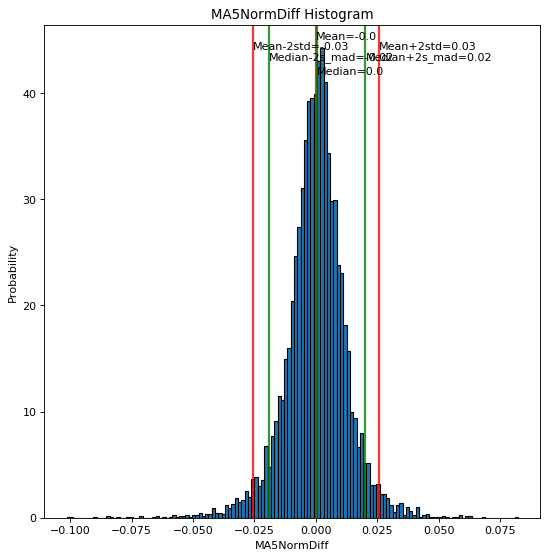

Column MA8NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  144
n=7653, q25=-0.01, q75=0.01, min=-0.11, max=0.09, interval length=0.00. Number of intervals=144
Feature characteristics for MA8NormDiff:
Min value =  -0.11071688100197777
Max value =  0.08640256135221752
Mean =  0.0
Median = 0.0004170801128687892
Standard deviation = 0.0134
Skew = -0.5264
kurtosis = 5.7166


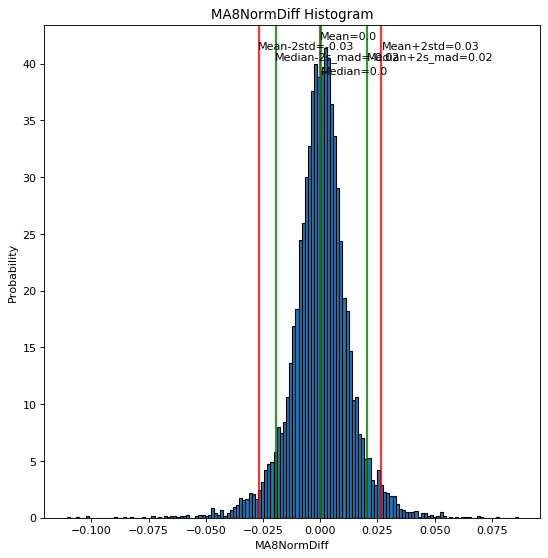

Column MA10NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  145
n=7653, q25=-0.01, q75=0.01, min=-0.12, max=0.08, interval length=0.00. Number of intervals=145
Feature characteristics for MA10NormDiff:
Min value =  -0.11702390639012362
Max value =  0.08346634033662326
Mean =  0.0
Median = 0.00038731514889133253
Standard deviation = 0.0136
Skew = -0.5513
kurtosis = 5.7993


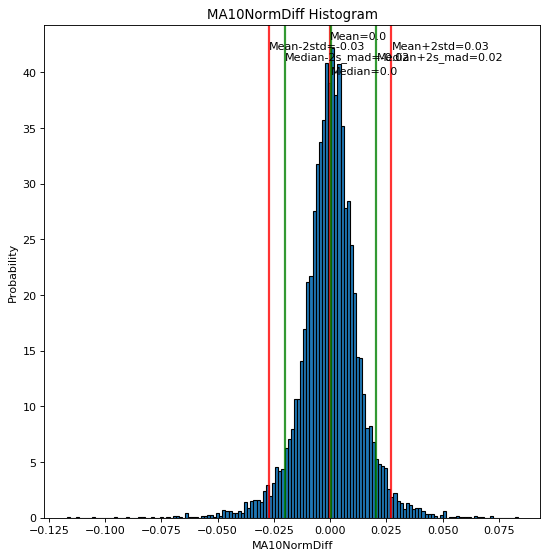

Column MA13NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  142
n=7653, q25=-0.01, q75=0.01, min=-0.12, max=0.08, interval length=0.00. Number of intervals=142
Feature characteristics for MA13NormDiff:
Min value =  -0.11740393920398146
Max value =  0.08216833814810272
Mean =  0.0
Median = 0.00037598029454551785
Standard deviation = 0.0137
Skew = -0.5545
kurtosis = 5.9496


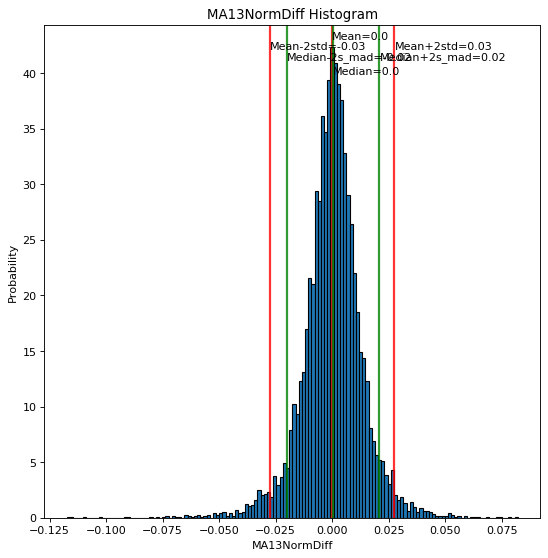

Column MA15NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  143
n=7653, q25=-0.01, q75=0.01, min=-0.11, max=0.08, interval length=0.00. Number of intervals=143
Feature characteristics for MA15NormDiff:
Min value =  -0.11382571776316225
Max value =  0.08383048780741517
Mean =  0.0
Median = 0.00031314152181459096
Standard deviation = 0.0138
Skew = -0.5151
kurtosis = 5.8037


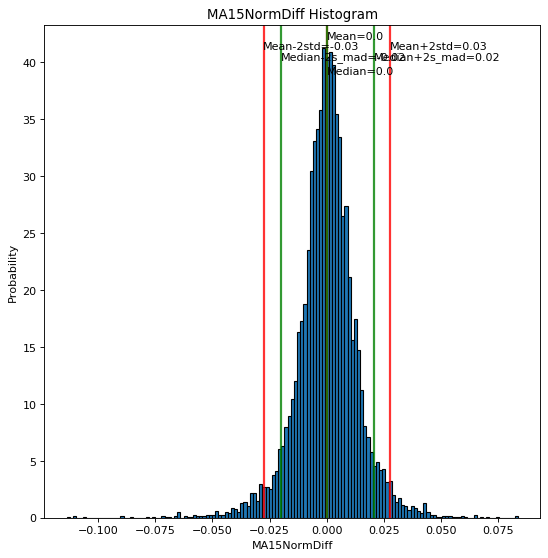

Column MA18NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  146
n=7653, q25=-0.01, q75=0.01, min=-0.12, max=0.08, interval length=0.00. Number of intervals=146
Feature characteristics for MA18NormDiff:
Min value =  -0.11876883777671315
Max value =  0.08498926210245701
Mean =  0.0
Median = 0.00022834995852932802
Standard deviation = 0.0139
Skew = -0.4876
kurtosis = 5.7526


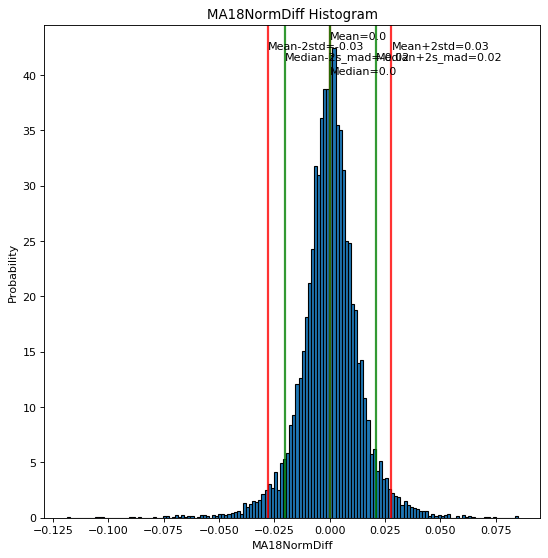

Column MA20NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  146
n=7653, q25=-0.01, q75=0.01, min=-0.12, max=0.09, interval length=0.00. Number of intervals=146
Feature characteristics for MA20NormDiff:
Min value =  -0.12092608889639092
Max value =  0.08537410220582717
Mean =  0.0
Median = 0.0002418442046924416
Standard deviation = 0.014
Skew = -0.4861
kurtosis = 5.7997


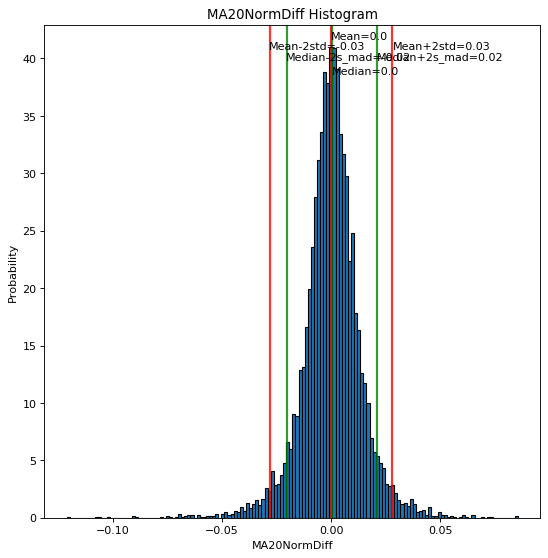

Column MA22NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  148
n=7653, q25=-0.01, q75=0.01, min=-0.12, max=0.09, interval length=0.00. Number of intervals=148
Feature characteristics for MA22NormDiff:
Min value =  -0.1214854426068573
Max value =  0.08757232581837876
Mean =  0.0
Median = 0.00019261920356574043
Standard deviation = 0.0141
Skew = -0.475
kurtosis = 5.8338


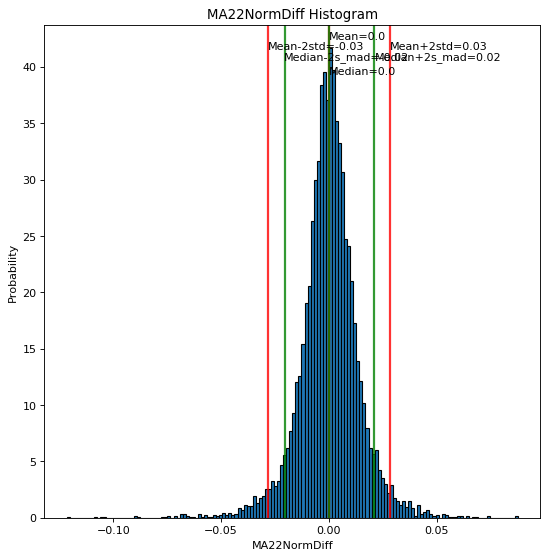

Column MA34NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  158
n=7653, q25=-0.01, q75=0.01, min=-0.13, max=0.09, interval length=0.00. Number of intervals=158
Feature characteristics for MA34NormDiff:
Min value =  -0.12985525905642262
Max value =  0.09363733035696303
Mean =  0.0
Median = 9.649028879546613e-05
Standard deviation = 0.0143
Skew = -0.4424
kurtosis = 6.2542


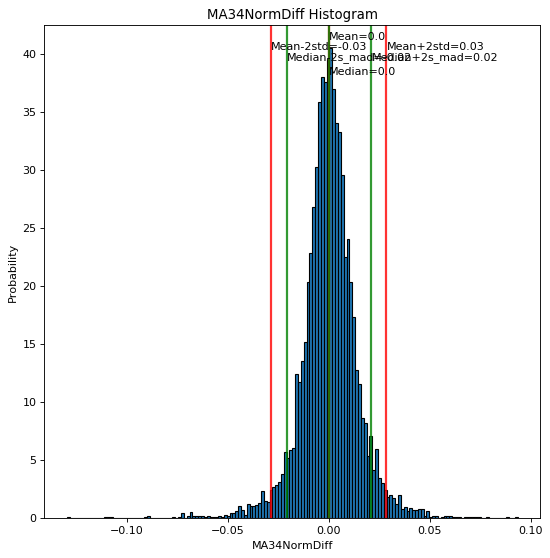

Column MA40NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  157
n=7653, q25=-0.01, q75=0.01, min=-0.13, max=0.09, interval length=0.00. Number of intervals=157
Feature characteristics for MA40NormDiff:
Min value =  -0.1319956565273233
Max value =  0.09355447059206047
Mean =  0.0
Median = 9.259892160900716e-05
Standard deviation = 0.0144
Skew = -0.4424
kurtosis = 6.4606


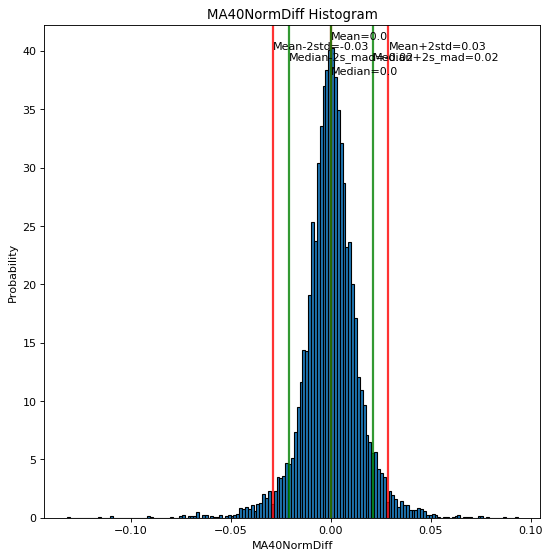

Column MA50NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  162
n=7653, q25=-0.01, q75=0.01, min=-0.14, max=0.09, interval length=0.00. Number of intervals=162
Feature characteristics for MA50NormDiff:
Min value =  -0.13691148265412198
Max value =  0.09337296535370262
Mean =  0.0
Median = 1.0018197139152753e-05
Standard deviation = 0.0145
Skew = -0.4486
kurtosis = 6.8346


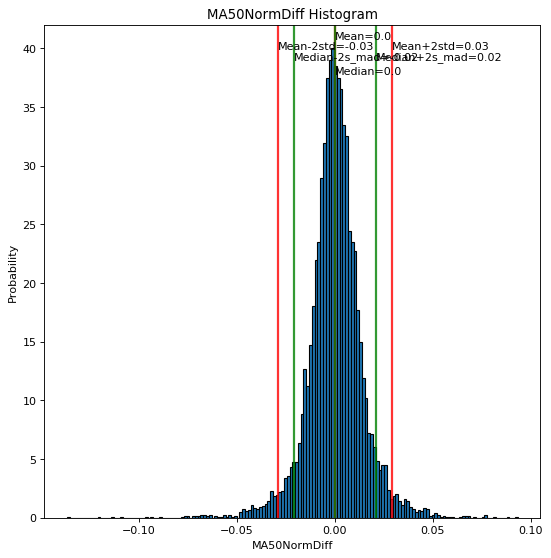

Column MA75NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  170
n=7653, q25=-0.01, q75=0.01, min=-0.14, max=0.10, interval length=0.00. Number of intervals=170
Feature characteristics for MA75NormDiff:
Min value =  -0.14494035166626434
Max value =  0.0970073928773045
Mean =  0.0
Median = -6.432864335645383e-05
Standard deviation = 0.0147
Skew = -0.456
kurtosis = 7.643


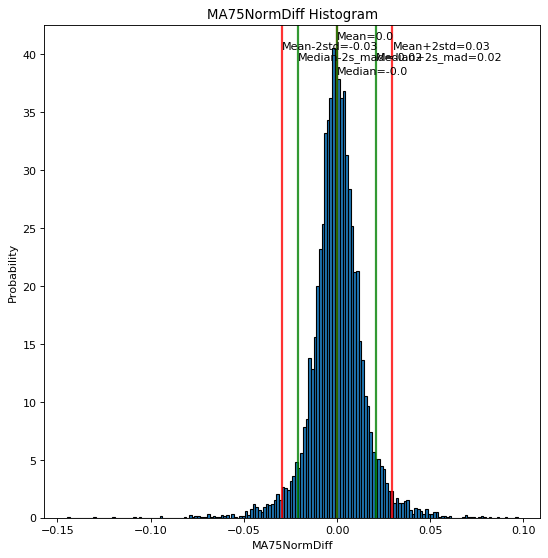

Column MA100NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  175
n=7653, q25=-0.01, q75=0.01, min=-0.15, max=0.10, interval length=0.00. Number of intervals=175
Feature characteristics for MA100NormDiff:
Min value =  -0.14712553970424555
Max value =  0.10143541012438342
Mean =  0.0
Median = -0.0001060373022764398
Standard deviation = 0.0149
Skew = -0.4569
kurtosis = 8.1505


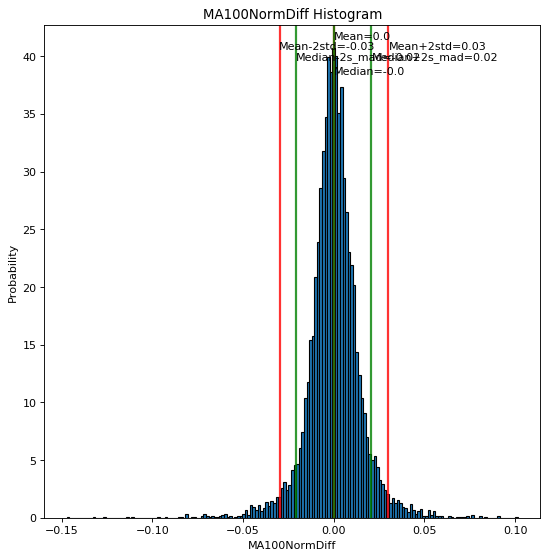

Column MA125NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  177
n=7653, q25=-0.01, q75=0.01, min=-0.15, max=0.10, interval length=0.00. Number of intervals=177
Feature characteristics for MA125NormDiff:
Min value =  -0.1479957782738029
Max value =  0.1019217665986858
Mean =  0.0
Median = -0.00012138960019213509
Standard deviation = 0.0151
Skew = -0.4596
kurtosis = 8.5961


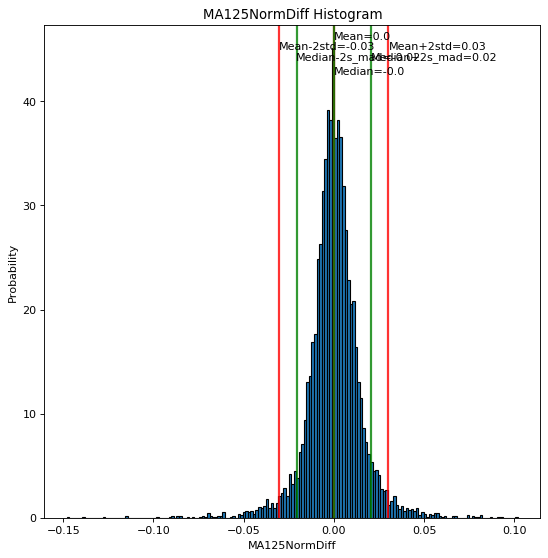

Column MA150NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  178
n=7653, q25=-0.01, q75=0.01, min=-0.15, max=0.10, interval length=0.00. Number of intervals=178
Feature characteristics for MA150NormDiff:
Min value =  -0.14683325117558332
Max value =  0.10354533668884094
Mean =  0.0
Median = -0.0001557182411740625
Standard deviation = 0.0152
Skew = -0.4558
kurtosis = 8.9652


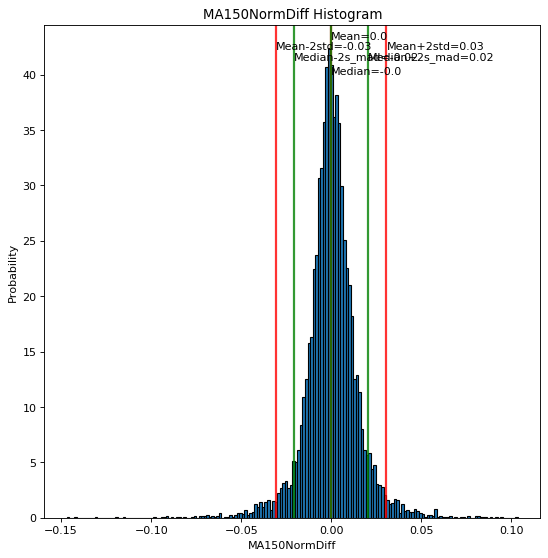

Column MA175NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  180
n=7653, q25=-0.01, q75=0.01, min=-0.14, max=0.11, interval length=0.00. Number of intervals=180
Feature characteristics for MA175NormDiff:
Min value =  -0.14433727245614153
Max value =  0.10751223591827803
Mean =  0.0
Median = -0.00016409917631618476
Standard deviation = 0.0153
Skew = -0.4412
kurtosis = 9.1703


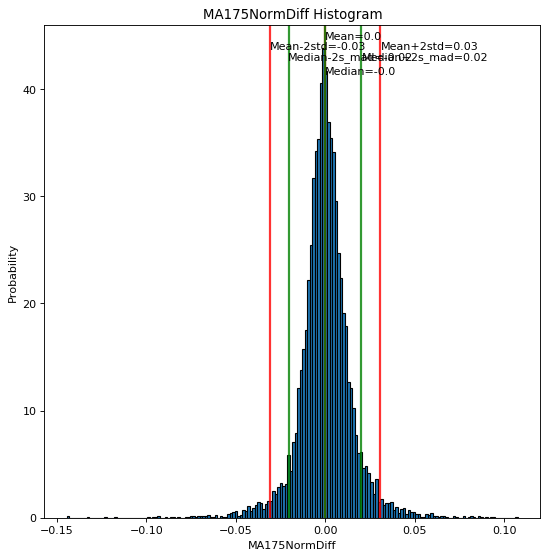

Column MA200NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  186
n=7653, q25=-0.01, q75=0.01, min=-0.15, max=0.11, interval length=0.00. Number of intervals=186
Feature characteristics for MA200NormDiff:
Min value =  -0.14588250084162865
Max value =  0.11060976849753146
Mean =  0.0
Median = -0.00018947857086246134
Standard deviation = 0.0154
Skew = -0.4338
kurtosis = 9.2999


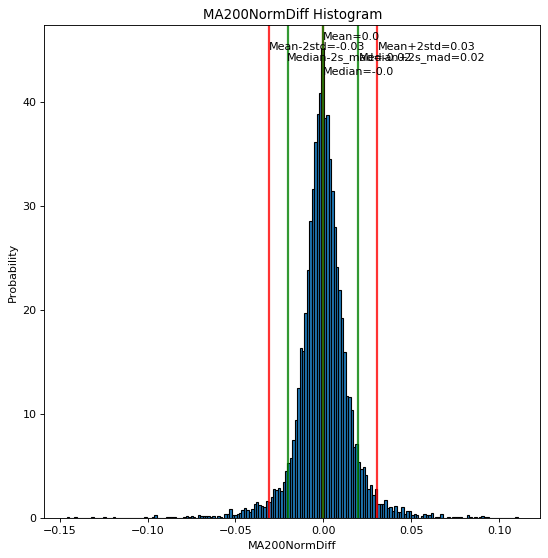

Column MA225NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  190
n=7653, q25=-0.01, q75=0.01, min=-0.15, max=0.11, interval length=0.00. Number of intervals=190
Feature characteristics for MA225NormDiff:
Min value =  -0.1481145364253938
Max value =  0.11366179601395825
Mean =  0.0
Median = -0.00018388565293181447
Standard deviation = 0.0155
Skew = -0.4361
kurtosis = 9.4894


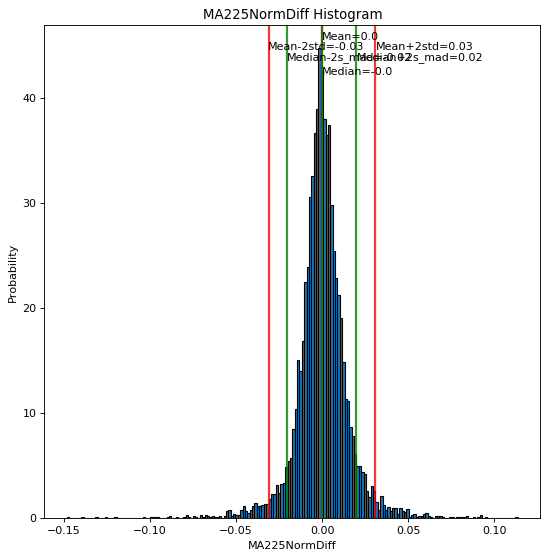

Column MA250NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  195
n=7653, q25=-0.01, q75=0.01, min=-0.15, max=0.12, interval length=0.00. Number of intervals=195
Feature characteristics for MA250NormDiff:
Min value =  -0.15159571387001994
Max value =  0.11620591886590065
Mean =  0.0
Median = -0.00019245850527273292
Standard deviation = 0.0155
Skew = -0.4456
kurtosis = 9.8374


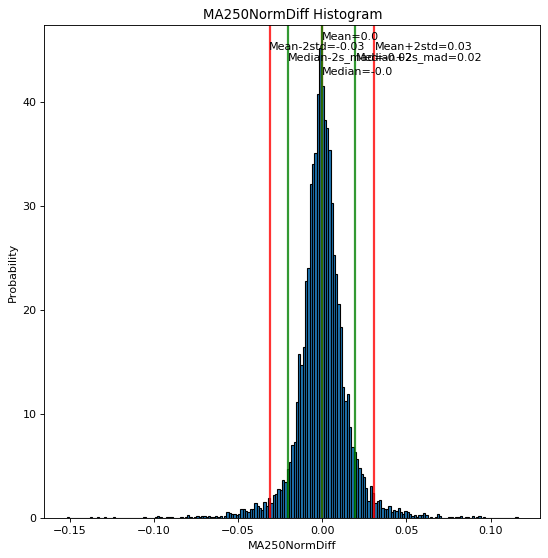

Column MA275NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  202
n=7653, q25=-0.01, q75=0.01, min=-0.16, max=0.12, interval length=0.00. Number of intervals=202
Feature characteristics for MA275NormDiff:
Min value =  -0.15532175397531822
Max value =  0.12021147393462868
Mean =  0.0
Median = -0.0002015521063453152
Standard deviation = 0.0156
Skew = -0.448
kurtosis = 10.19


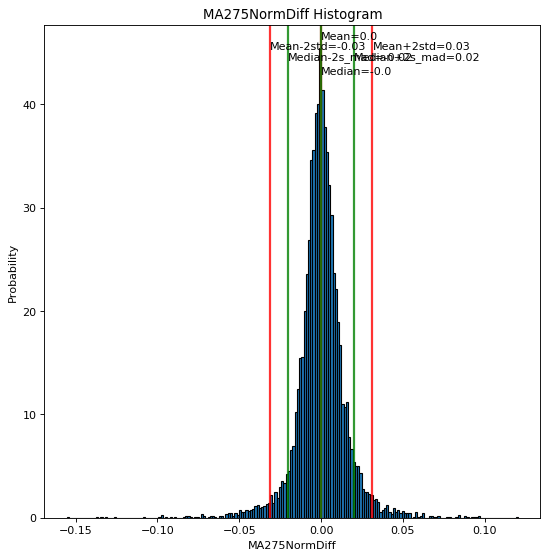

Column MA300NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  207
n=7653, q25=-0.01, q75=0.01, min=-0.16, max=0.12, interval length=0.00. Number of intervals=207
Feature characteristics for MA300NormDiff:
Min value =  -0.15929746477209872
Max value =  0.1236838971084992
Mean =  0.0
Median = -0.00017357891445597684
Standard deviation = 0.0157
Skew = -0.4575
kurtosis = 10.6419


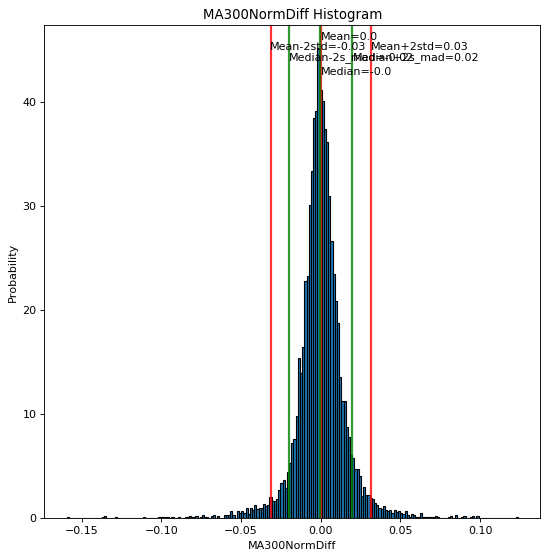

Column MA325NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  214
n=7653, q25=-0.01, q75=0.01, min=-0.16, max=0.13, interval length=0.00. Number of intervals=214
Feature characteristics for MA325NormDiff:
Min value =  -0.16237949961261675
Max value =  0.12697536709257906
Mean =  0.0
Median = -0.0002189826049130289
Standard deviation = 0.0158
Skew = -0.4589
kurtosis = 11.0128


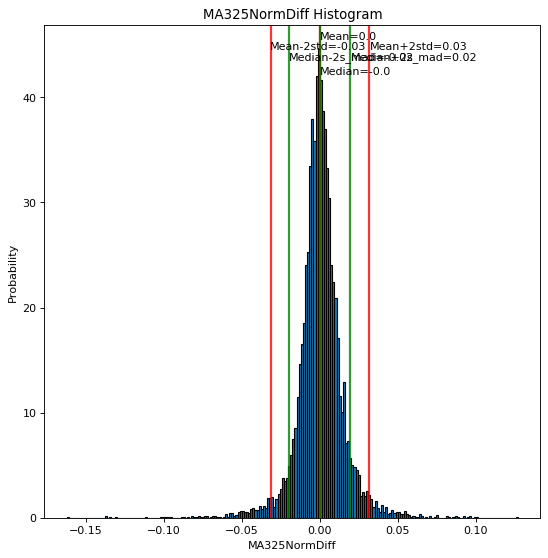

Column MA350NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  220
n=7653, q25=-0.01, q75=0.01, min=-0.17, max=0.13, interval length=0.00. Number of intervals=220
Feature characteristics for MA350NormDiff:
Min value =  -0.16603585612469166
Max value =  0.12986409616907096
Mean =  0.0
Median = -0.00017569483670817204
Standard deviation = 0.0159
Skew = -0.468
kurtosis = 11.4247


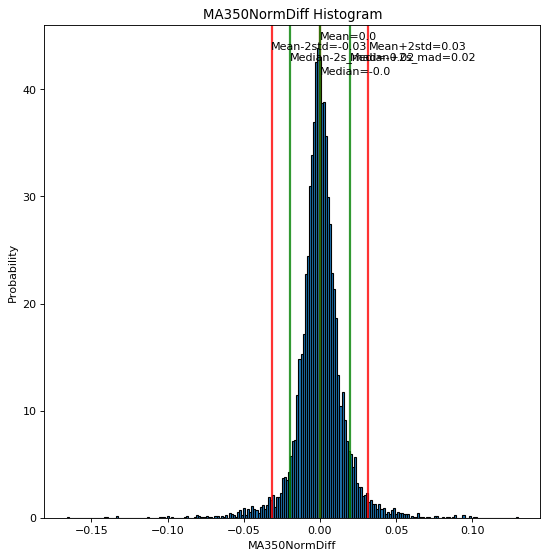

Column MA375NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  225
n=7653, q25=-0.01, q75=0.01, min=-0.17, max=0.13, interval length=0.00. Number of intervals=225
Feature characteristics for MA375NormDiff:
Min value =  -0.1688352345731915
Max value =  0.13201261336758952
Mean =  0.0
Median = -0.00017867391362563767
Standard deviation = 0.0159
Skew = -0.4728
kurtosis = 11.7953


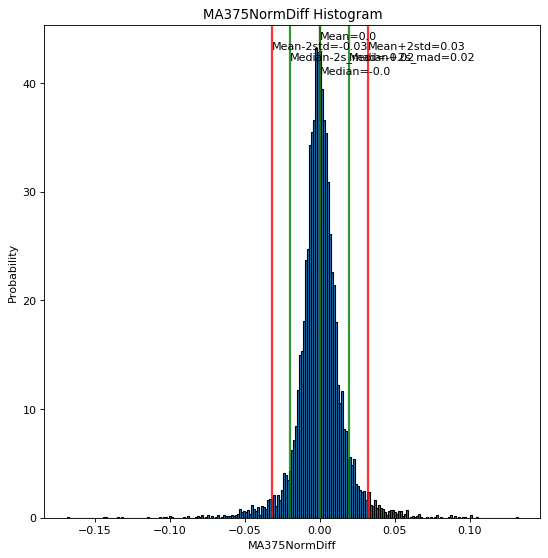

Column MA400NormDiff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  229
n=7653, q25=-0.01, q75=0.01, min=-0.17, max=0.13, interval length=0.00. Number of intervals=229
Feature characteristics for MA400NormDiff:
Min value =  -0.17126792621653386
Max value =  0.13494158740196793
Mean =  0.0
Median = -0.00021896959098198496
Standard deviation = 0.016
Skew = -0.4748
kurtosis = 12.1469


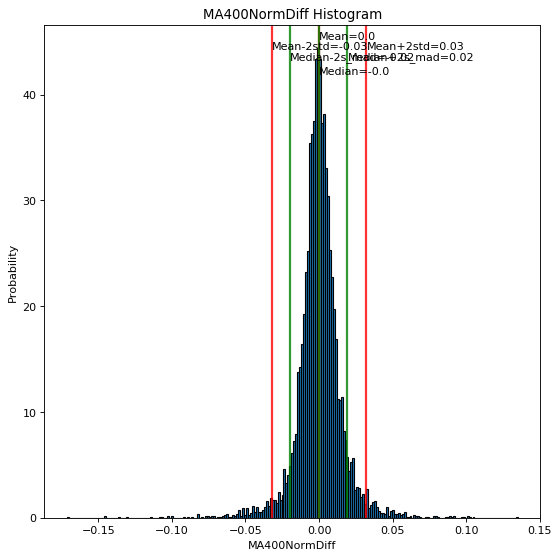

Column RSI_2 is a numerical value
Number of unique features 7645 
Number of bins with Freedman und Diaconis:  23
n=7653, q25=33.16, q75=75.73, min=0.21, max=99.74, interval length=4.32. Number of intervals=23
Feature characteristics for RSI_2:
Min value =  0.2088307511659989
Max value =  99.74195982371431
Mean =  53.97
Median = 55.85198037166173
Standard deviation = 25.9971
Skew = -0.1721
kurtosis = -1.0517


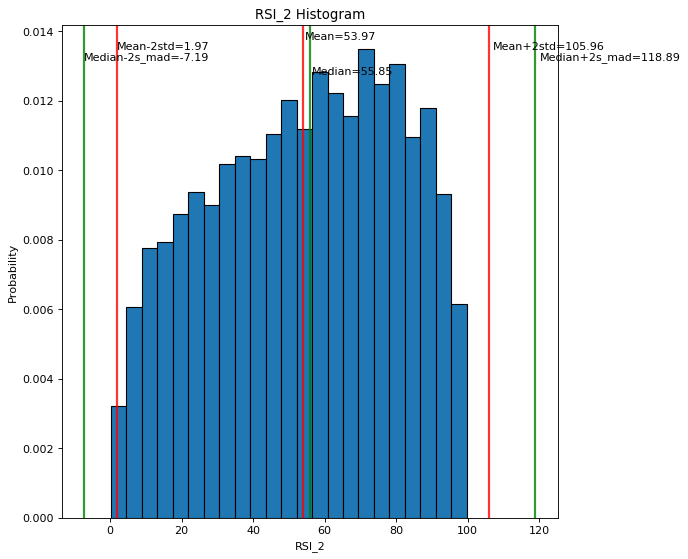

Column RSI_3 is a numerical value
Number of unique features 7641 
Number of bins with Freedman und Diaconis:  27
n=7653, q25=36.71, q75=71.95, min=0.63, max=98.95, interval length=3.58. Number of intervals=27
Feature characteristics for RSI_3:
Min value =  0.6328691820292925
Max value =  98.94558739160242
Mean =  53.94
Median = 55.253679883040625
Standard deviation = 22.607
Skew = -0.1675
kurtosis = -0.8679


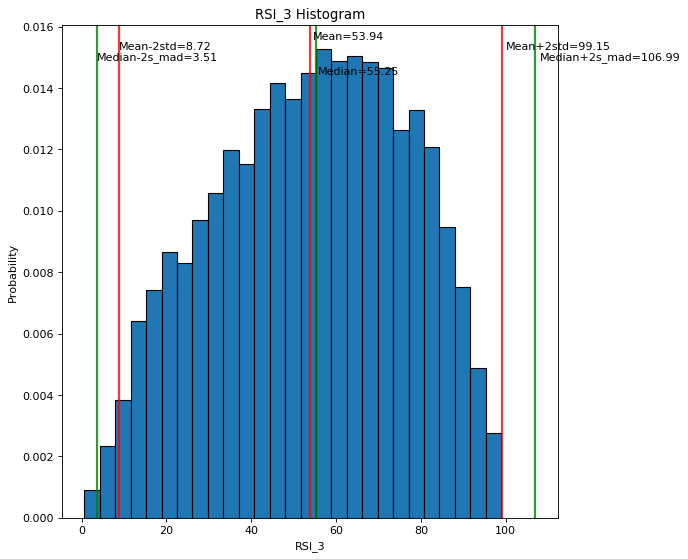

Column RSI_5 is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  33
n=7653, q25=40.21, q75=68.11, min=2.31, max=96.39, interval length=2.83. Number of intervals=33
Feature characteristics for RSI_5:
Min value =  2.3090757631495733
Max value =  96.38509534257635
Mean =  53.82
Median = 54.69755484660161
Standard deviation = 18.5662
Skew = -0.1555
kurtosis = -0.6562


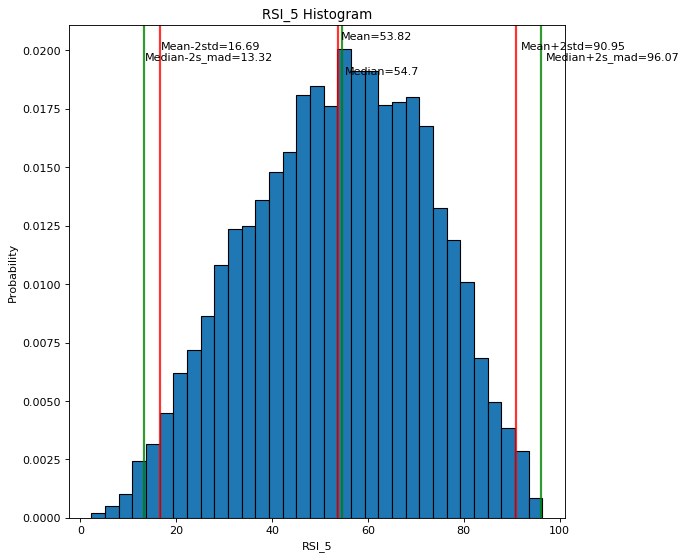

Column RSI_9 is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  39
n=7653, q25=43.18, q75=64.41, min=7.15, max=91.46, interval length=2.16. Number of intervals=39
Feature characteristics for RSI_9:
Min value =  7.1501703640973435
Max value =  91.45959915511428
Mean =  53.59
Median = 54.265663995096766
Standard deviation = 14.5239
Skew = -0.1313
kurtosis = -0.4595


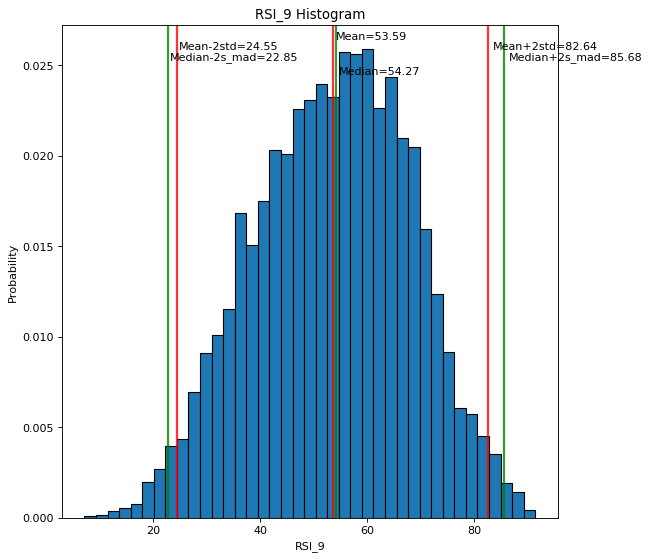

Column RSI_10 is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  40
n=7653, q25=43.65, q75=63.80, min=8.31, max=90.42, interval length=2.04. Number of intervals=40
Feature characteristics for RSI_10:
Min value =  8.312538659447899
Max value =  90.42304970847208
Mean =  53.55
Median = 54.24270537906885
Standard deviation = 13.8827
Skew = -0.1262
kurtosis = -0.4279


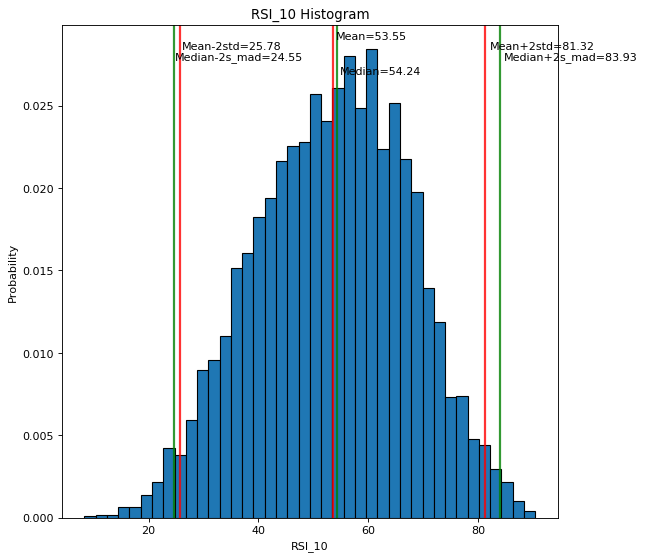

Column RSI_14 is a numerical value
Number of unique features 7643 
Number of bins with Freedman und Diaconis:  43
n=7653, q25=44.84, q75=62.01, min=12.29, max=86.97, interval length=1.74. Number of intervals=43
Feature characteristics for RSI_14:
Min value =  12.28706590582451
Max value =  86.96660650101394
Mean =  53.41
Median = 53.85816167065948
Standard deviation = 12.0105
Skew = -0.1111
kurtosis = -0.3328


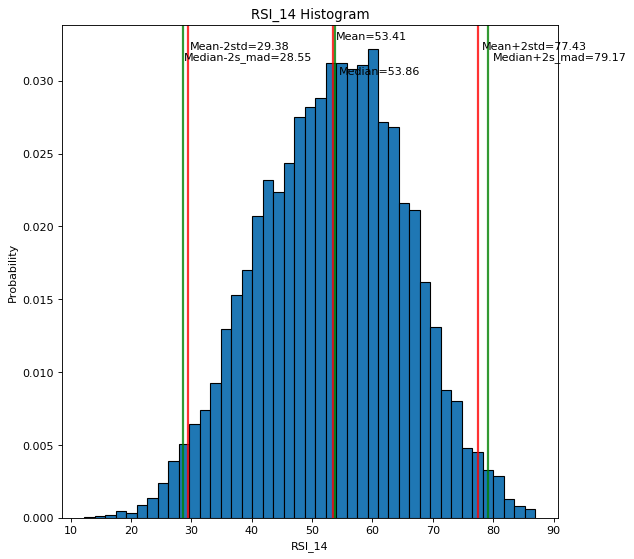

Column RSI_20 is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  47
n=7653, q25=46.10, q75=60.36, min=16.68, max=84.28, interval length=1.45. Number of intervals=47
Feature characteristics for RSI_20:
Min value =  16.679338744692615
Max value =  84.28414303659004
Mean =  53.25
Median = 53.68431389875372
Standard deviation = 10.3066
Skew = -0.1028
kurtosis = -0.2521


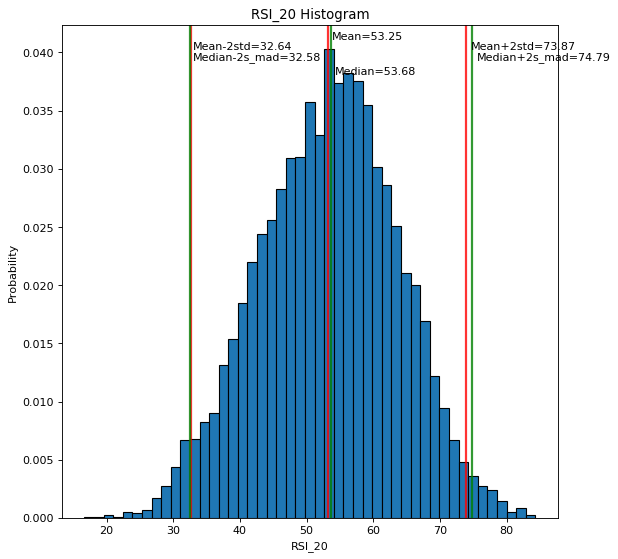

Column RSI_25 is a numerical value
Number of unique features 7640 
Number of bins with Freedman und Diaconis:  48
n=7653, q25=46.74, q75=59.63, min=19.51, max=82.54, interval length=1.31. Number of intervals=48
Feature characteristics for RSI_25:
Min value =  19.506834334763127
Max value =  82.53846808275797
Mean =  53.16
Median = 53.511259625183726
Standard deviation = 9.3758
Skew = -0.1014
kurtosis = -0.2185


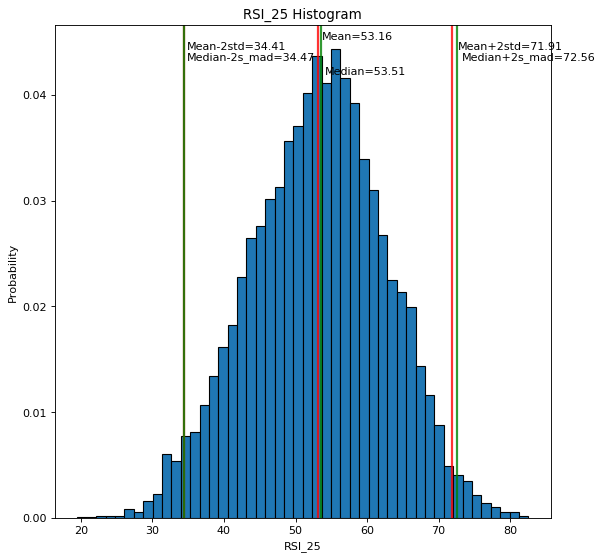

Column RSI2_diff is a numerical value
Number of unique features 7643 
Number of bins with Freedman und Diaconis:  56
n=7653, q25=-12.67, q75=11.57, min=-71.51, max=66.01, interval length=2.46. Number of intervals=56
Feature characteristics for RSI2_diff:
Min value =  -71.51025648025454
Max value =  66.00797499233532
Mean =  0.0
Median = 0.7211503489967299
Standard deviation = 19.5258
Skew = -0.0057
kurtosis = 0.2289


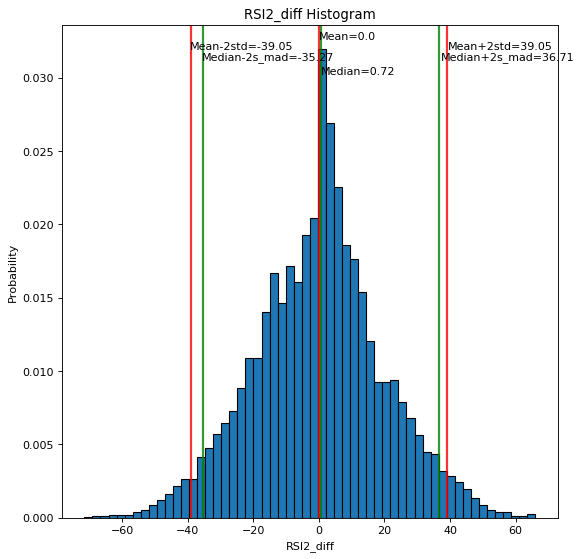

Column RSI3_diff is a numerical value
Number of unique features 7641 
Number of bins with Freedman und Diaconis:  62
n=7653, q25=-9.56, q75=8.89, min=-62.58, max=52.64, interval length=1.87. Number of intervals=62
Feature characteristics for RSI3_diff:
Min value =  -62.583584198150156
Max value =  52.642594800456145
Mean =  -0.0
Median = 0.7096218847874098
Standard deviation = 14.8466
Skew = -0.0239
kurtosis = 0.3961


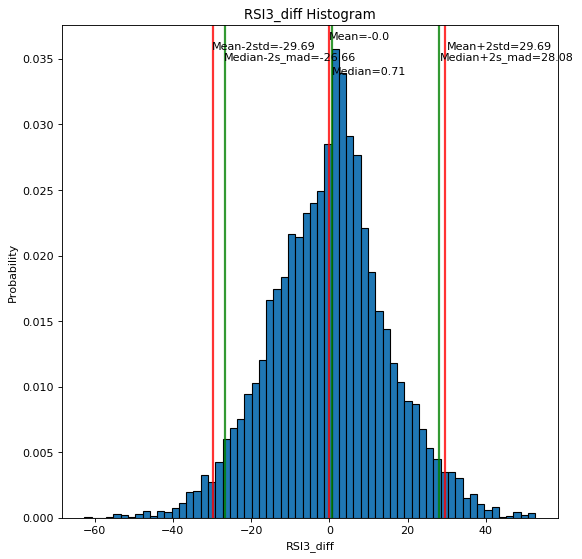

Column RSI5_diff is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  71
n=7653, q25=-6.44, q75=6.06, min=-51.88, max=38.38, interval length=1.27. Number of intervals=71
Feature characteristics for RSI5_diff:
Min value =  -51.87840963113032
Max value =  38.37884627852299
Mean =  -0.0
Median = 0.5286322757008293
Standard deviation = 10.0856
Skew = -0.0662
kurtosis = 0.6461


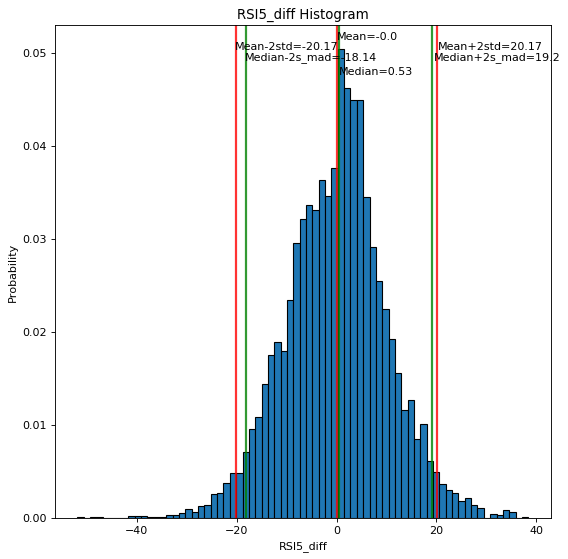

Column RSI9_diff is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  81
n=7653, q25=-3.95, q75=3.82, min=-38.48, max=25.37, interval length=0.79. Number of intervals=81
Feature characteristics for RSI9_diff:
Min value =  -38.47897371800303
Max value =  25.367034260001734
Mean =  -0.0
Median = 0.3350477387034232
Standard deviation = 6.1807
Skew = -0.1245
kurtosis = 1.0243


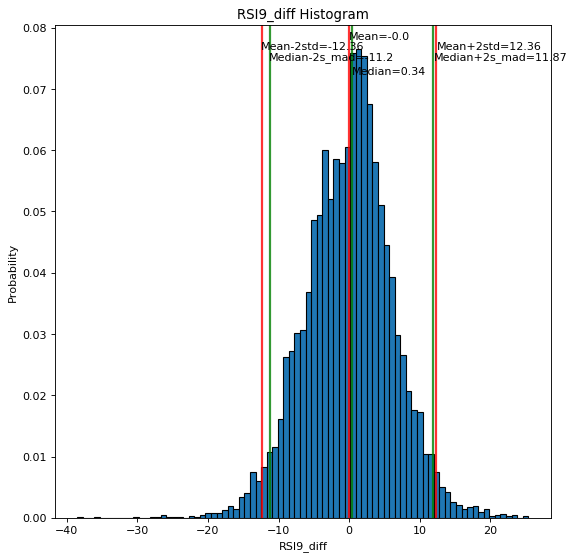

Column RSI10_diff is a numerical value
Number of unique features 7640 
Number of bins with Freedman und Diaconis:  83
n=7653, q25=-3.62, q75=3.51, min=-35.87, max=23.89, interval length=0.72. Number of intervals=83
Feature characteristics for RSI10_diff:
Min value =  -35.87135789648063
Max value =  23.892740960821538
Mean =  -0.0
Median = 0.30191934261625164
Standard deviation = 5.6397
Skew = -0.1349
kurtosis = 1.1025


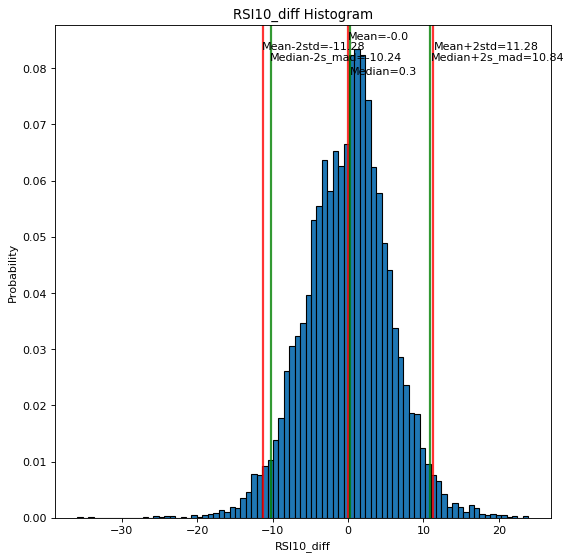

Column RSI14_diff is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  89
n=7653, q25=-2.66, q75=2.63, min=-28.31, max=19.38, interval length=0.54. Number of intervals=89
Feature characteristics for RSI14_diff:
Min value =  -28.305701236833787
Max value =  19.380508903563406
Mean =  -0.0
Median = 0.22458719131846291
Standard deviation = 4.1851
Skew = -0.1714
kurtosis = 1.3893


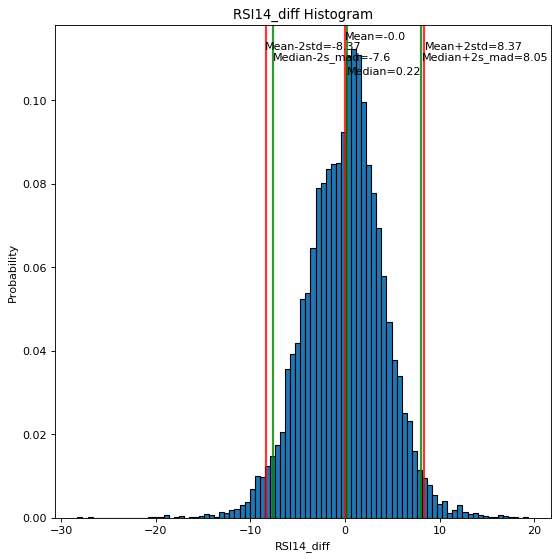

Column RSI20_diff is a numerical value
Number of unique features 7642 
Number of bins with Freedman und Diaconis:  96
n=7653, q25=-1.91, q75=1.91, min=-22.02, max=15.03, interval length=0.39. Number of intervals=96
Feature characteristics for RSI20_diff:
Min value =  -22.01982075277124
Max value =  15.028163367921724
Mean =  -0.0
Median = 0.16278686878271031
Standard deviation = 3.0275
Skew = -0.2206
kurtosis = 1.7915


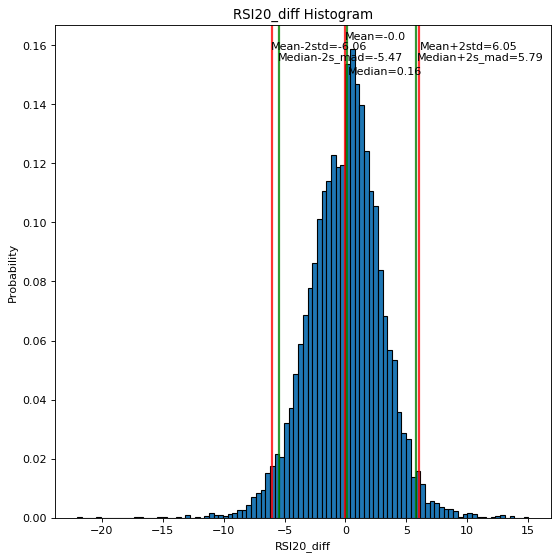

Column RSI25_diff is a numerical value
Number of unique features 7641 
Number of bins with Freedman und Diaconis:  101
n=7653, q25=-1.53, q75=1.55, min=-18.93, max=12.62, interval length=0.31. Number of intervals=101
Feature characteristics for RSI25_diff:
Min value =  -18.932532455622443
Max value =  12.618055583092016
Mean =  -0.0
Median = 0.1326338020655271
Standard deviation = 2.4649
Skew = -0.257
kurtosis = 2.1048


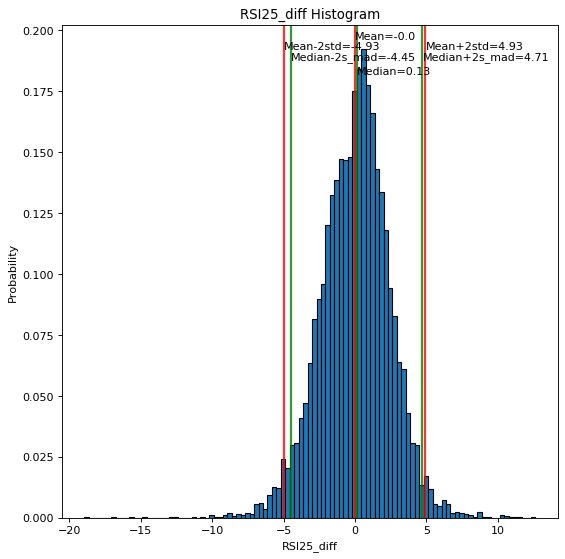

Column RSI3sign is a numerical value
Number of unique features 6 
Number of bins <= 100:  6
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=6
Feature characteristics for RSI3sign:
Min value =  0.0
Max value =  1.0
Mean =  0.01
Median = 0.0
Standard deviation = 0.0767
Skew = 11.3358
kurtosis = 135.1016


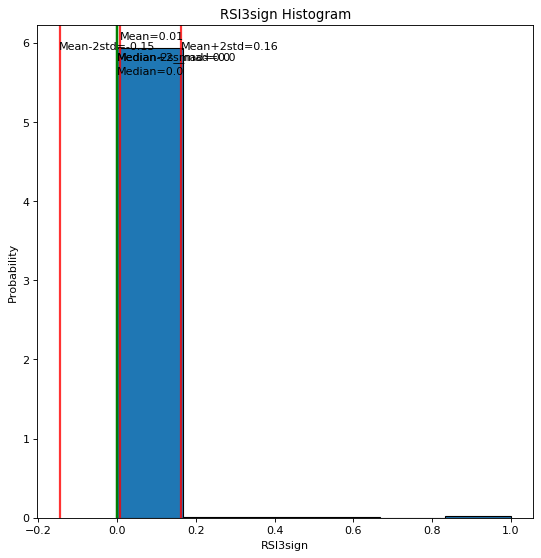

Column Stoch_Sk1383 is a numerical value
Number of unique features 7306 
Number of bins with Freedman und Diaconis:  24
n=7653, q25=37.51, q75=77.72, min=0.00, max=100.00, interval length=4.08. Number of intervals=24
Feature characteristics for Stoch_Sk1383:
Min value =  0.0
Max value =  99.99999999999996
Mean =  57.16
Median = 58.91279326662949
Standard deviation = 24.8109
Skew = -0.221
kurtosis = -0.9524


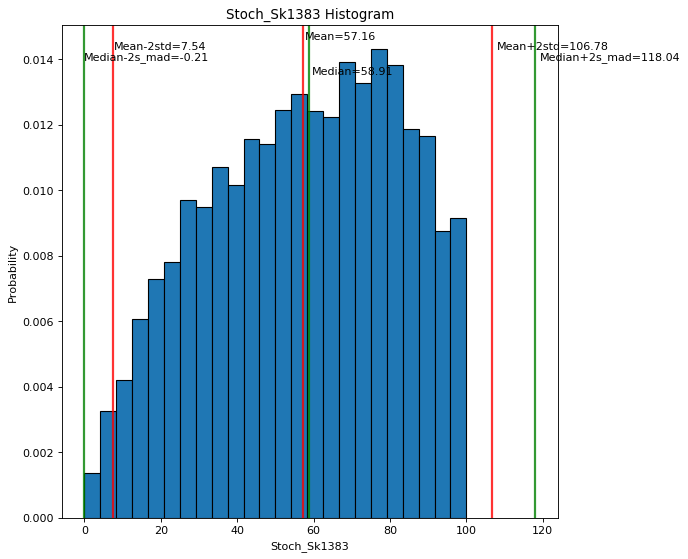

Column Stoch_Sd1383 is a numerical value
Number of unique features 7611 
Number of bins with Freedman und Diaconis:  25
n=7653, q25=38.04, q75=77.47, min=0.41, max=100.00, interval length=4.00. Number of intervals=25
Feature characteristics for Stoch_Sd1383:
Min value =  0.4077471967377588
Max value =  99.99999999999977
Mean =  57.17
Median = 58.911527965130674
Standard deviation = 24.3421
Skew = -0.2207
kurtosis = -0.9523


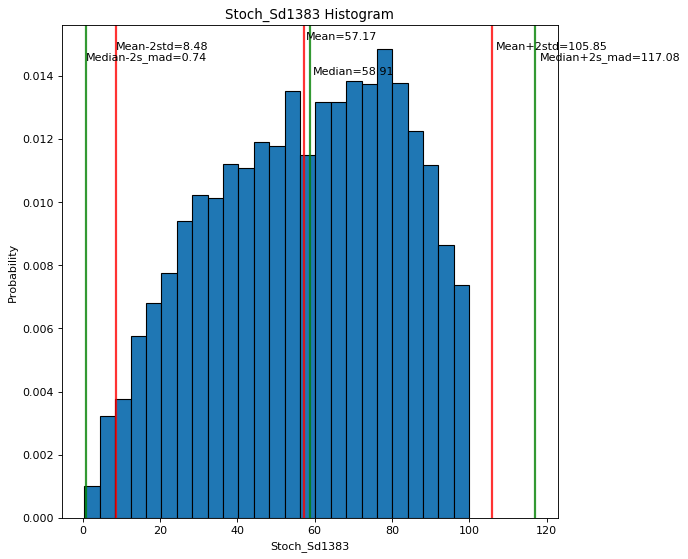

Column Stoch_Sk533 is a numerical value
Number of unique features 7069 
Number of bins with Freedman und Diaconis:  25
n=7653, q25=35.18, q75=74.11, min=0.00, max=100.00, interval length=3.95. Number of intervals=25
Feature characteristics for Stoch_Sk533:
Min value =  0.0
Max value =  99.99999999999993
Mean =  54.68
Median = 55.755398349396756
Standard deviation = 24.585
Skew = -0.1112
kurtosis = -0.8603


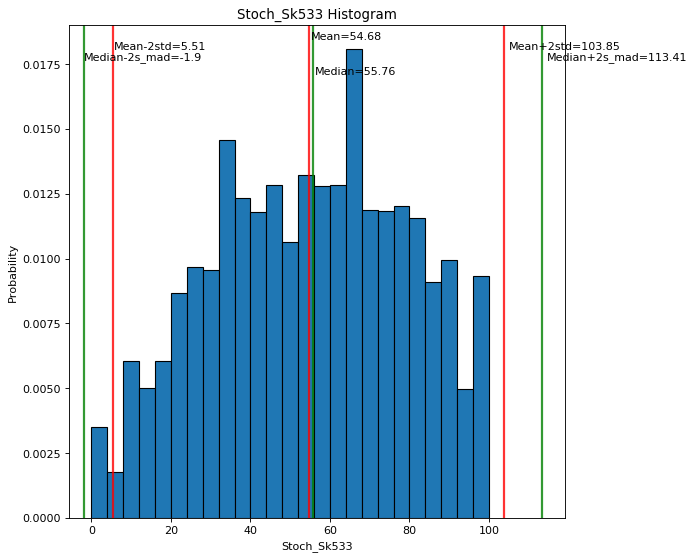

Column Stoch_Sd533 is a numerical value
Number of unique features 7069 
Number of bins with Freedman und Diaconis:  25
n=7653, q25=35.18, q75=74.11, min=0.00, max=100.00, interval length=3.95. Number of intervals=25
Feature characteristics for Stoch_Sd533:
Min value =  0.0
Max value =  99.99999999999993
Mean =  54.68
Median = 55.755398349396756
Standard deviation = 24.585
Skew = -0.1112
kurtosis = -0.8603


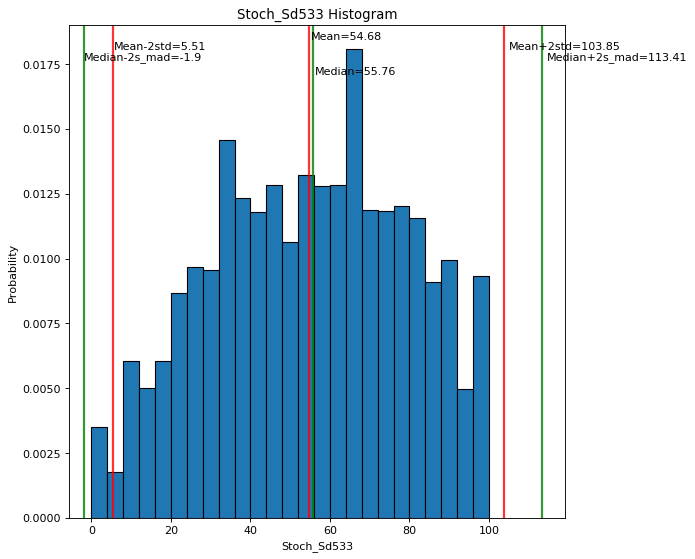

Column Stoch_Sk2177 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  27
n=7653, q25=39.50, q75=74.80, min=2.02, max=99.63, interval length=3.58. Number of intervals=27
Feature characteristics for Stoch_Sk2177:
Min value =  2.0205418325557702
Max value =  99.63310330750905
Mean =  56.84
Median = 58.181372150587386
Standard deviation = 22.3357
Skew = -0.1914
kurtosis = -0.8563


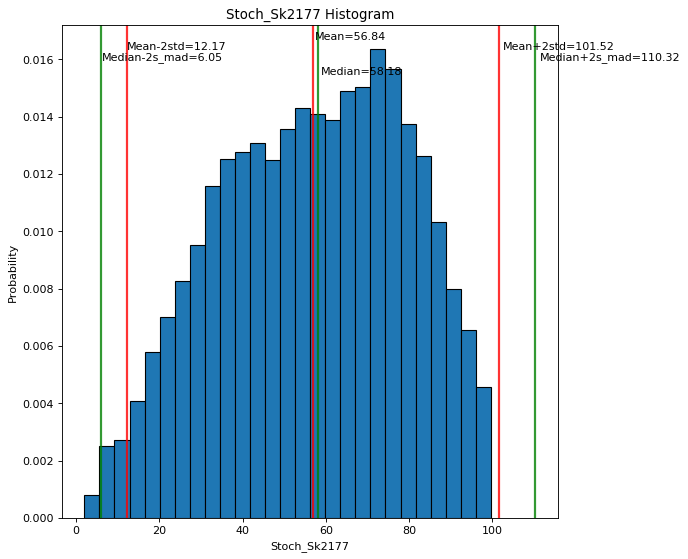

Column Stoch_Sd2177 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  27
n=7653, q25=39.50, q75=74.80, min=2.02, max=99.63, interval length=3.58. Number of intervals=27
Feature characteristics for Stoch_Sd2177:
Min value =  2.0205418325557702
Max value =  99.63310330750905
Mean =  56.84
Median = 58.181372150587386
Standard deviation = 22.3357
Skew = -0.1914
kurtosis = -0.8563


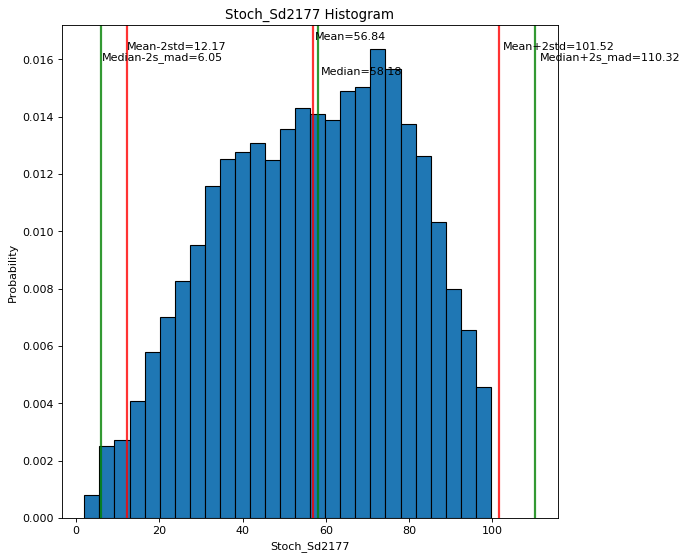

Column Stoch_Sk211414 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  26
n=7653, q25=41.32, q75=76.65, min=5.45, max=97.78, interval length=3.59. Number of intervals=26
Feature characteristics for Stoch_Sk211414:
Min value =  5.454658155381019
Max value =  97.7791382871566
Mean =  58.7
Median = 60.64896374911474
Standard deviation = 21.8081
Skew = -0.2589
kurtosis = -0.9278


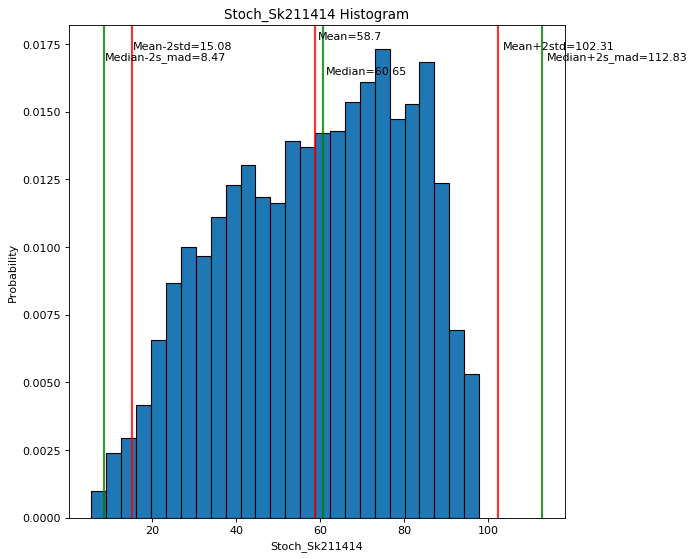

Column Stoch_Sd211414 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  26
n=7653, q25=41.32, q75=76.65, min=5.45, max=97.78, interval length=3.59. Number of intervals=26
Feature characteristics for Stoch_Sd211414:
Min value =  5.454658155381019
Max value =  97.7791382871566
Mean =  58.7
Median = 60.64896374911474
Standard deviation = 21.8081
Skew = -0.2589
kurtosis = -0.9278


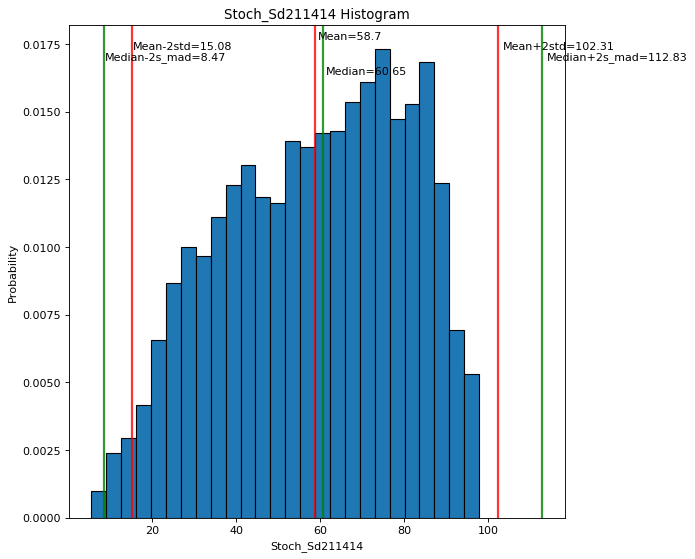

Column Stoch_Sk31414 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  26
n=7653, q25=41.32, q75=76.65, min=5.45, max=97.78, interval length=3.59. Number of intervals=26
Feature characteristics for Stoch_Sk31414:
Min value =  5.454658155381019
Max value =  97.7791382871566
Mean =  58.7
Median = 60.64896374911474
Standard deviation = 21.8081
Skew = -0.2589
kurtosis = -0.9278


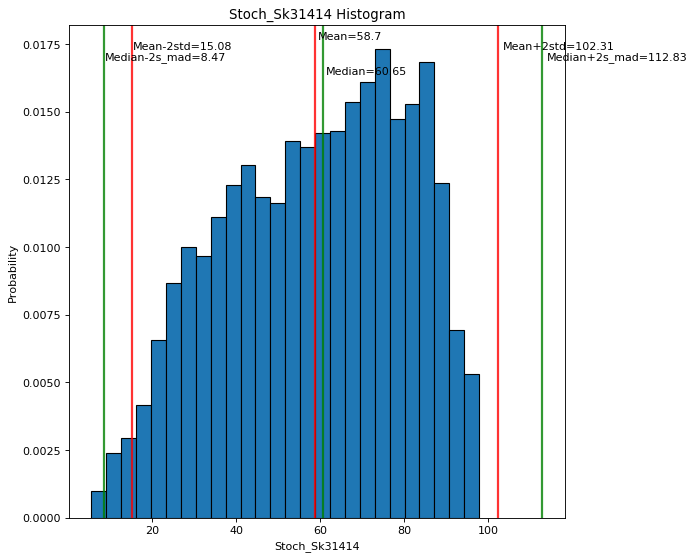

Column Stoch_Sd31414 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  26
n=7653, q25=41.32, q75=76.65, min=5.45, max=97.78, interval length=3.59. Number of intervals=26
Feature characteristics for Stoch_Sd31414:
Min value =  5.454658155381019
Max value =  97.7791382871566
Mean =  58.7
Median = 60.64896374911474
Standard deviation = 21.8081
Skew = -0.2589
kurtosis = -0.9278


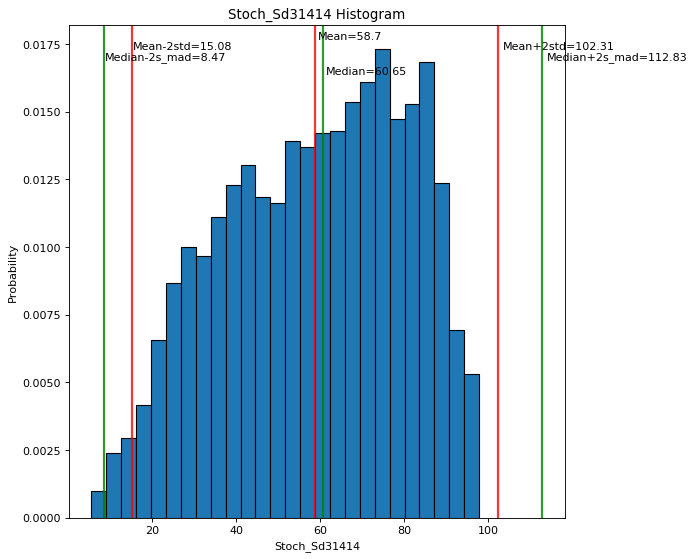

Column MACD_12_26_9 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  102
n=7653, q25=-3.35, q75=8.01, min=-51.32, max=66.59, interval length=1.15. Number of intervals=102
Feature characteristics for MACD_12_26_9:
Min value =  -51.317383679303596
Max value =  66.59180287061372
Mean =  1.37
Median = 2.3120774462197176
Standard deviation = 12.1751
Skew = -0.3922
kurtosis = 2.7972


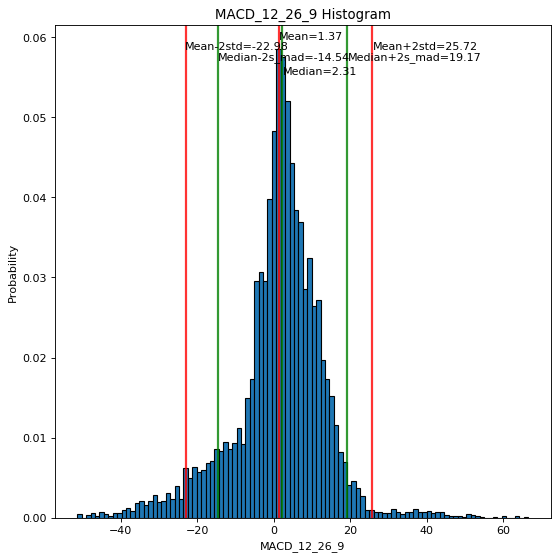

Column MACDS_12_26_9 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  98
n=7653, q25=-3.15, q75=7.43, min=-47.70, max=57.53, interval length=1.07. Number of intervals=98
Feature characteristics for MACDS_12_26_9:
Min value =  -47.69989602491832
Max value =  57.53487662641304
Mean =  1.38
Median = 2.239379084807025
Standard deviation = 11.5192
Skew = -0.3252
kurtosis = 2.7818


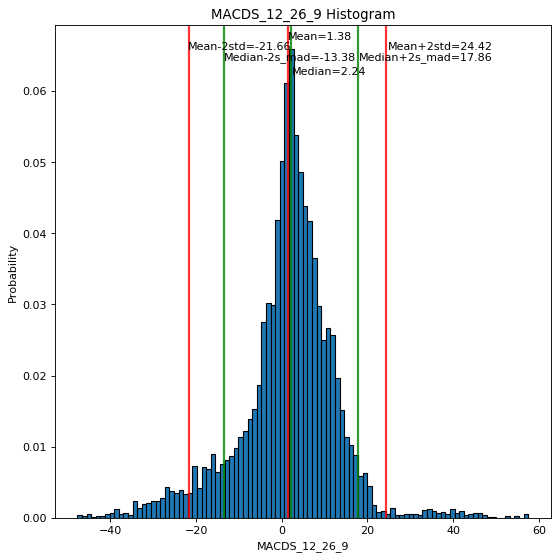

Column MACD_5_35_5 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  109
n=7653, q25=-6.90, q75=17.06, min=-114.79, max=151.33, interval length=2.43. Number of intervals=109
Feature characteristics for MACD_5_35_5:
Min value =  -114.78985567331176
Max value =  151.3327661315789
Mean =  2.93
Median = 4.845444240526946
Standard deviation = 25.6719
Skew = -0.4049
kurtosis = 3.006


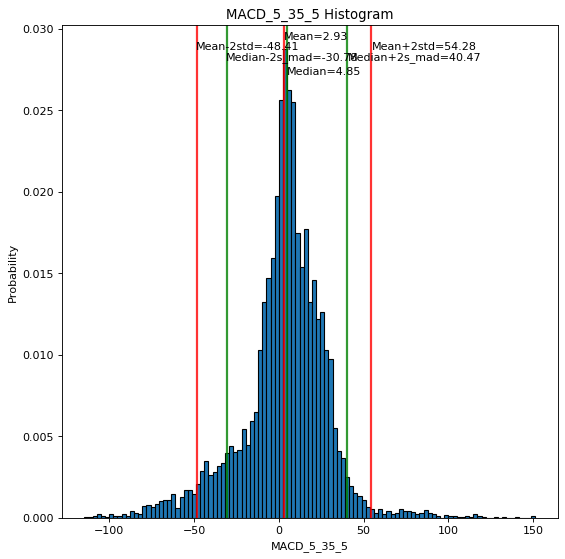

Column MACDS_5_35_5 is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  102
n=7653, q25=-6.61, q75=16.58, min=-102.88, max=136.89, interval length=2.35. Number of intervals=102
Feature characteristics for MACDS_5_35_5:
Min value =  -102.8781311442854
Max value =  136.8868290024202
Mean =  2.95
Median = 4.898173859873598
Standard deviation = 24.8142
Skew = -0.3632
kurtosis = 2.9131


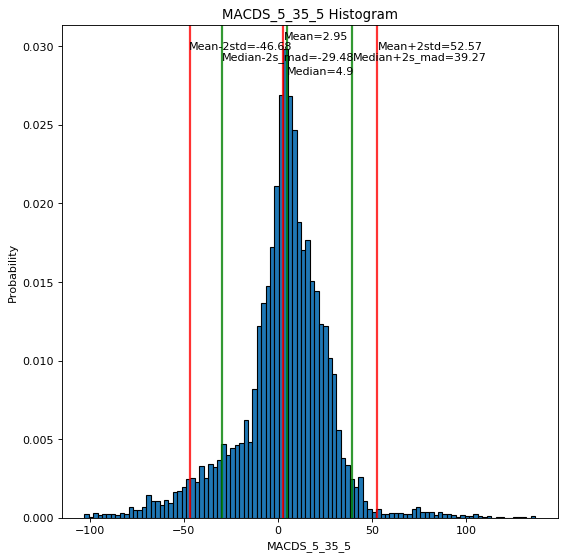

Column MACD_12_26_9Diff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  153
n=7653, q25=-0.57, q75=0.64, min=-10.08, max=8.52, interval length=0.12. Number of intervals=153
Feature characteristics for MACD_12_26_9Diff:
Min value =  -10.083749217184051
Max value =  8.524409460885638
Mean =  -0.0
Median = 0.0164868591521099
Standard deviation = 1.4303
Skew = -0.2761
kurtosis = 3.5436


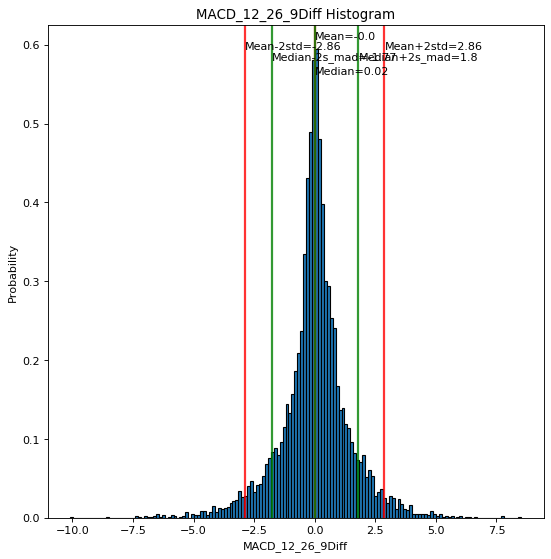

Column MACDS_12_26_9Diff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  116
n=7653, q25=-0.38, q75=0.40, min=-5.09, max=4.00, interval length=0.08. Number of intervals=116
Feature characteristics for MACDS_12_26_9Diff:
Min value =  -5.086101975276866
Max value =  4.001545626645552
Mean =  -0.0
Median = 0.004910429416389306
Standard deviation = 0.8799
Skew = -0.2053
kurtosis = 2.4231


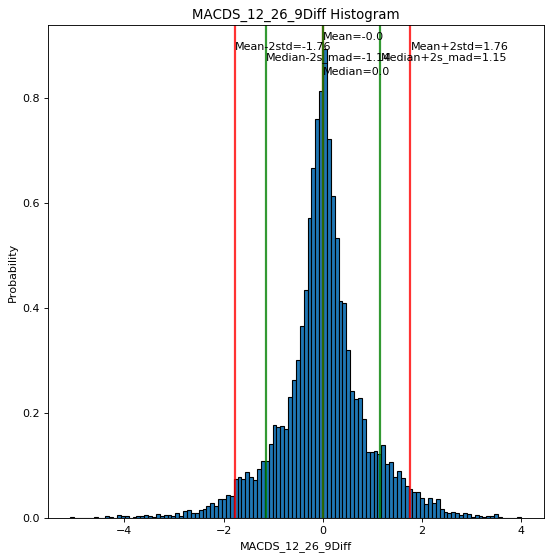

Column MACD_5_35_5Diff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  159
n=7653, q25=-1.62, q75=1.75, min=-28.62, max=25.68, interval length=0.34. Number of intervals=159
Feature characteristics for MACD_5_35_5Diff:
Min value =  -28.624286791759463
Max value =  25.678231032849226
Mean =  -0.01
Median = 0.05599282281798424
Standard deviation = 4.1415
Skew = -0.2512
kurtosis = 3.9477


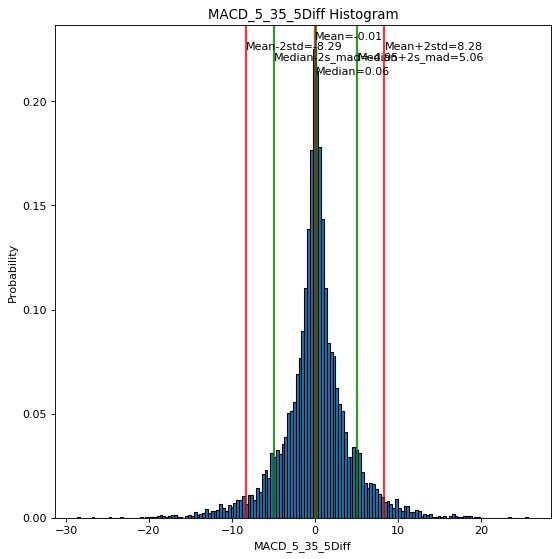

Column MACDS_5_35_5Diff is a numerical value
Number of unique features 7653 
Number of bins with Freedman und Diaconis:  138
n=7653, q25=-1.07, q75=1.16, min=-16.54, max=14.64, interval length=0.23. Number of intervals=138
Feature characteristics for MACDS_5_35_5Diff:
Min value =  -16.54434989682683
Max value =  14.641312505434627
Mean =  -0.01
Median = 0.02879726817476325
Standard deviation = 2.6693
Skew = -0.1981
kurtosis = 3.2021


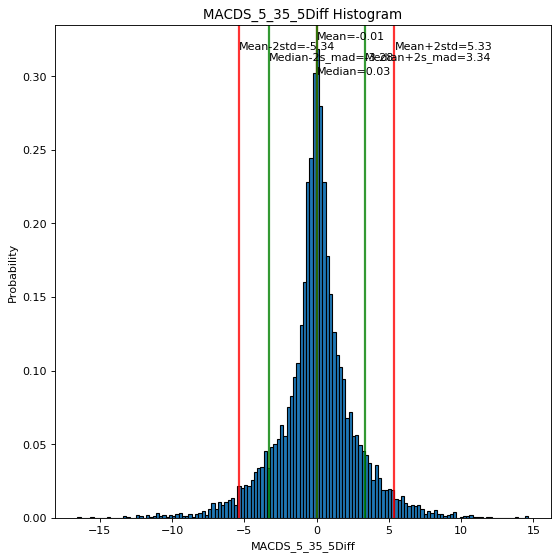

Column MACD_12_26_9DiffDirChange is a numerical value
Number of unique features 11 
Number of bins = number of features {}:  11
n=7653, q25=-0.22, q75=0.22, min=-1.00, max=1.00, interval length=0.04. Number of intervals=11
Feature characteristics for MACD_12_26_9DiffDirChange:
Min value =  -1.0
Max value =  1.0
Mean =  -0.0
Median = 0.0
Standard deviation = 0.5387
Skew = 0.0073
kurtosis = -0.1887


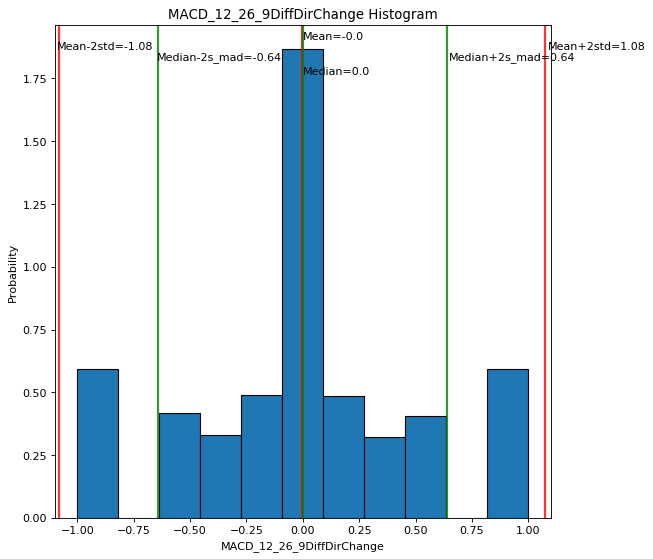

Column MACDS_12_26_9DiffDirChange is a numerical value
Number of unique features 11 
Number of bins <= 100:  11
n=7653, q25=0.00, q75=0.00, min=-1.00, max=1.00, interval length=0.00. Number of intervals=11
Feature characteristics for MACDS_12_26_9DiffDirChange:
Min value =  -1.0
Max value =  1.0
Mean =  -0.0
Median = 0.0
Standard deviation = 0.3507
Skew = 0.0057
kurtosis = 3.182


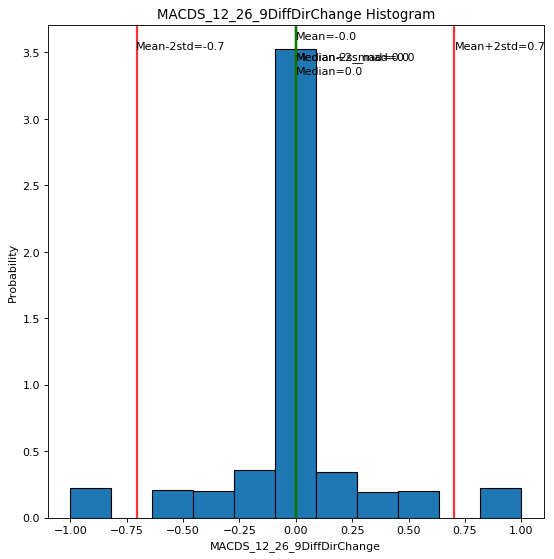

Column MACD_5_35_5DiffDirChange is a numerical value
Number of unique features 11 
Number of bins = number of features {}:  11
n=7653, q25=-0.36, q75=0.36, min=-1.00, max=1.00, interval length=0.07. Number of intervals=11
Feature characteristics for MACD_5_35_5DiffDirChange:
Min value =  -1.0
Max value =  1.0
Mean =  -0.0
Median = 0.0
Standard deviation = 0.6093
Skew = 0.0057
kurtosis = -0.7795


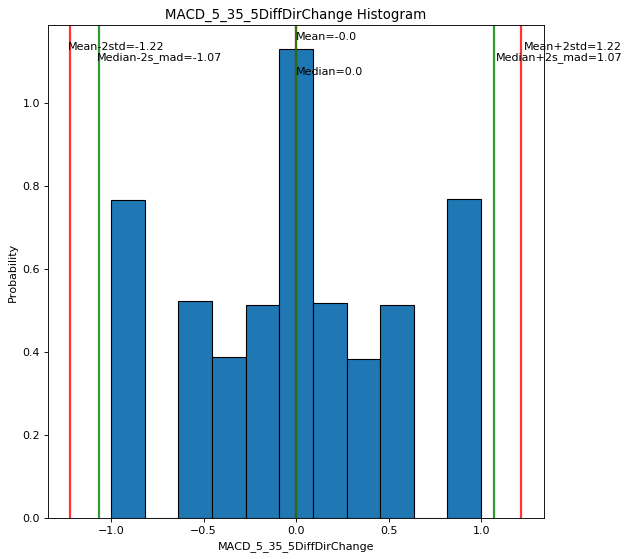

Column MACDS_5_35_5DiffDirChange is a numerical value
Number of unique features 11 
Number of bins = number of features {}:  11
n=7653, q25=-0.13, q75=0.13, min=-1.00, max=1.00, interval length=0.03. Number of intervals=11
Feature characteristics for MACDS_5_35_5DiffDirChange:
Min value =  -1.0
Max value =  1.0
Mean =  -0.0
Median = 0.0
Standard deviation = 0.45
Skew = 0.0055
kurtosis = 0.8455


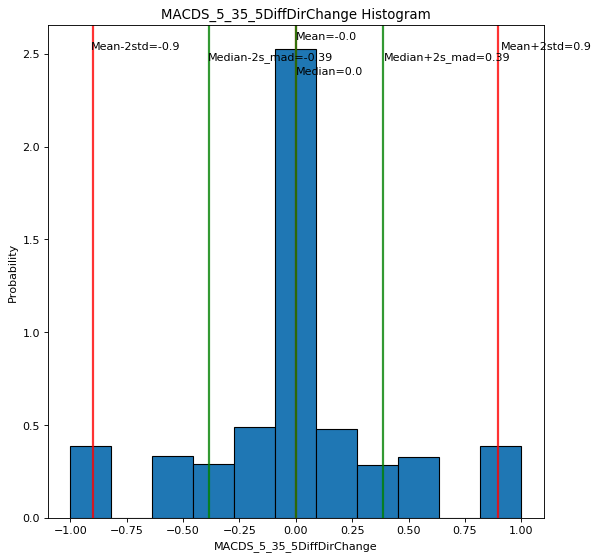

Column week_of_year is a numerical value
Number of unique features 53 
Number of bins with Freedman und Diaconis:  20
n=7653, q25=14.00, q75=39.00, min=1.00, max=53.00, interval length=2.54. Number of intervals=20
Feature characteristics for week_of_year:
Min value =  1
Max value =  53
Mean =  26.72
Median = 27.0
Standard deviation = 14.8568
Skew = -0.036
kurtosis = -1.1972


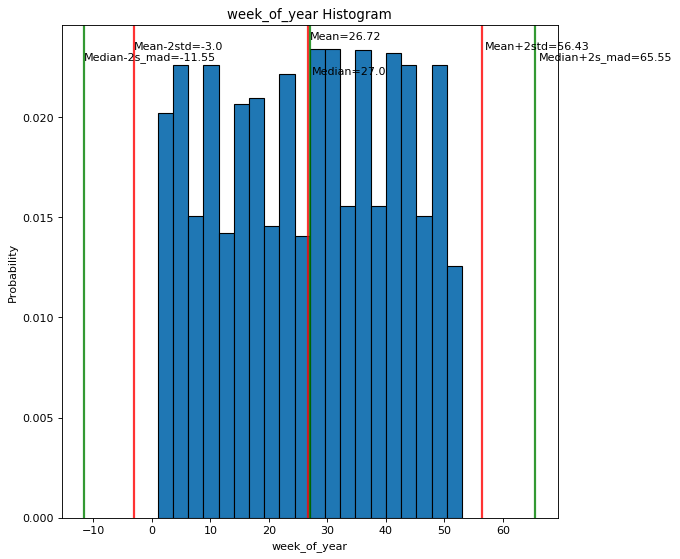

Column day_of_year is a numerical value
Number of unique features 362 
Number of bins with Freedman und Diaconis:  20
n=7653, q25=93.00, q75=273.00, min=2.00, max=365.00, interval length=18.27. Number of intervals=20
Feature characteristics for day_of_year:
Min value =  2
Max value =  365
Mean =  183.68
Median = 187.0
Standard deviation = 104.0294
Skew = -0.0356
kurtosis = -1.197


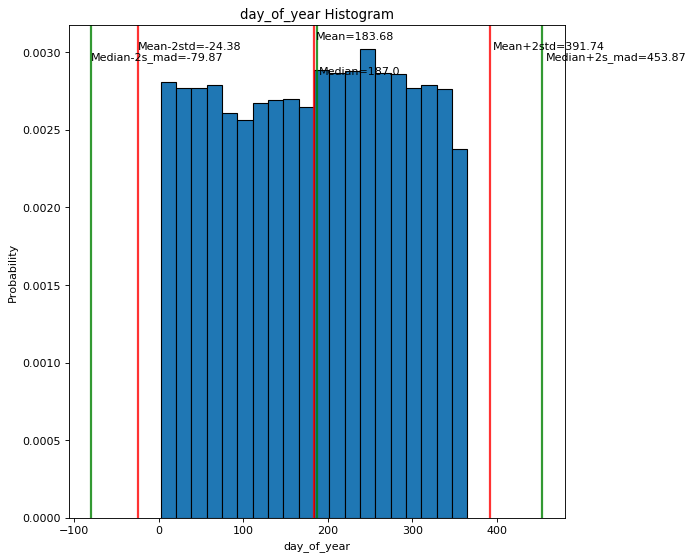

Column day_of_month is a numerical value
Number of unique features 31 
Number of bins with Freedman und Diaconis:  20
n=7653, q25=8.00, q75=23.00, min=1.00, max=31.00, interval length=1.52. Number of intervals=20
Feature characteristics for day_of_month:
Min value =  1
Max value =  31
Mean =  15.71
Median = 16.0
Standard deviation = 8.7306
Skew = 0.0209
kurtosis = -1.1795


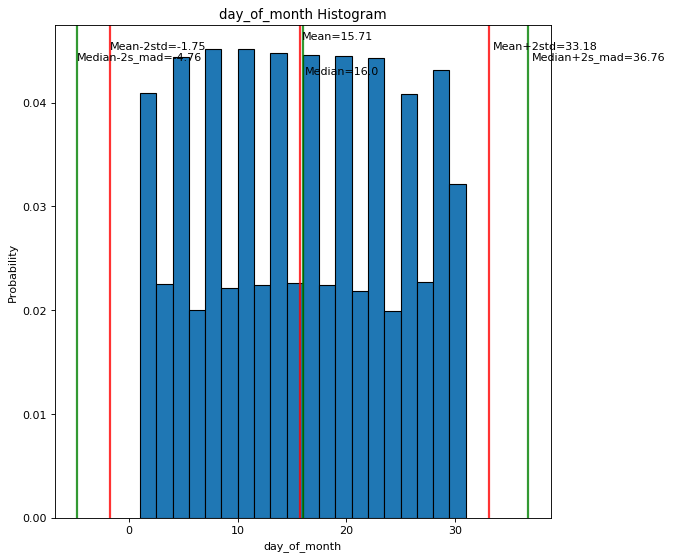

Column day_week__0 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for day_week__0:
Min value =  0
Max value =  1
Mean =  0.2
Median = 0.0
Standard deviation = 0.3977
Skew = 1.5246
kurtosis = 0.3245


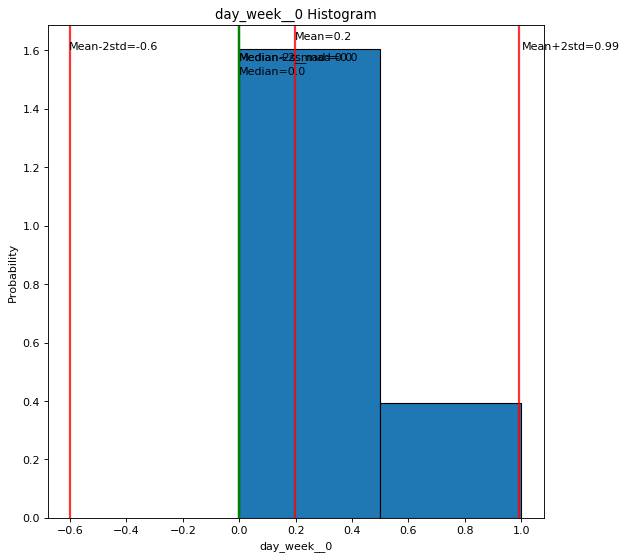

Column day_week__1 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for day_week__1:
Min value =  0
Max value =  1
Mean =  0.2
Median = 0.0
Standard deviation = 0.4027
Skew = 1.4726
kurtosis = 0.1686


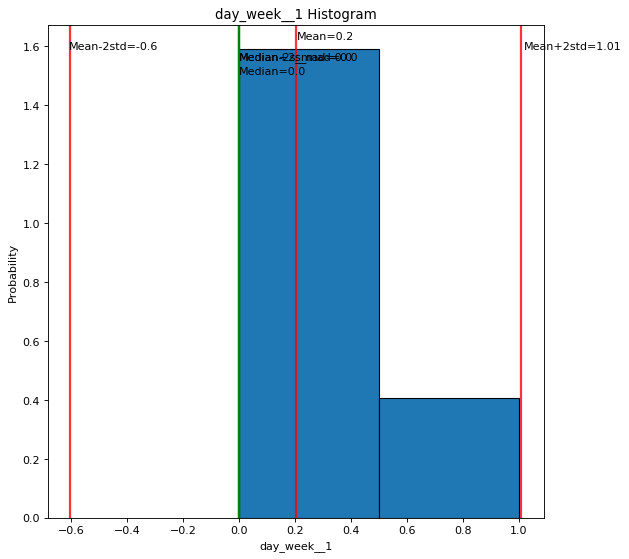

Column day_week__2 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for day_week__2:
Min value =  0
Max value =  1
Mean =  0.2
Median = 0.0
Standard deviation = 0.4027
Skew = 1.4726
kurtosis = 0.1686


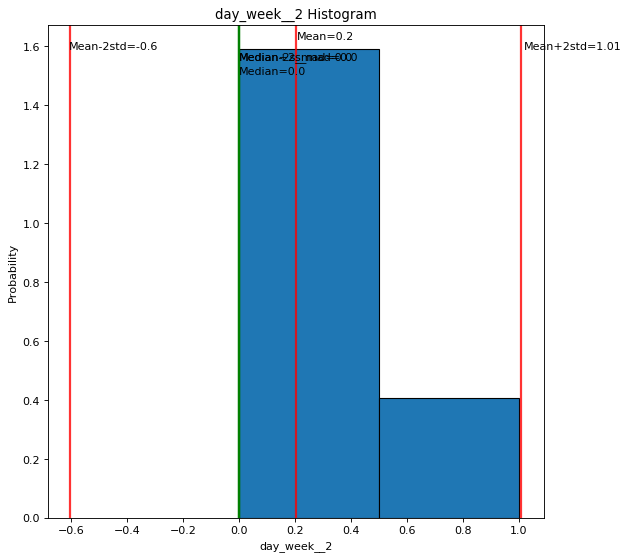

Column day_week__3 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for day_week__3:
Min value =  0
Max value =  1
Mean =  0.2
Median = 0.0
Standard deviation = 0.4
Skew = 1.5009
kurtosis = 0.2528


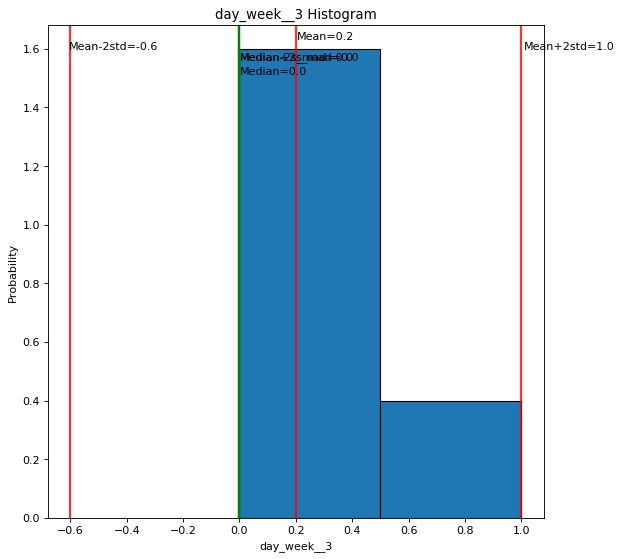

Column day_week__4 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for day_week__4:
Min value =  0
Max value =  1
Mean =  0.2
Median = 0.0
Standard deviation = 0.3968
Skew = 1.534
kurtosis = 0.3532


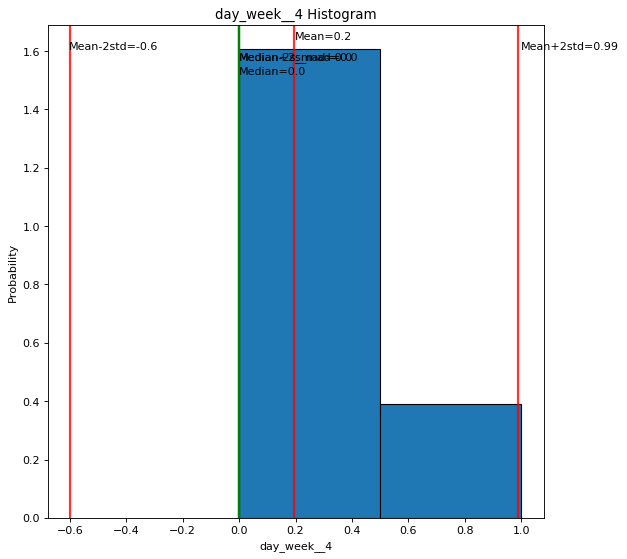

Column month_year__1 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__1:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2739
Skew = 3.0557
kurtosis = 7.3393


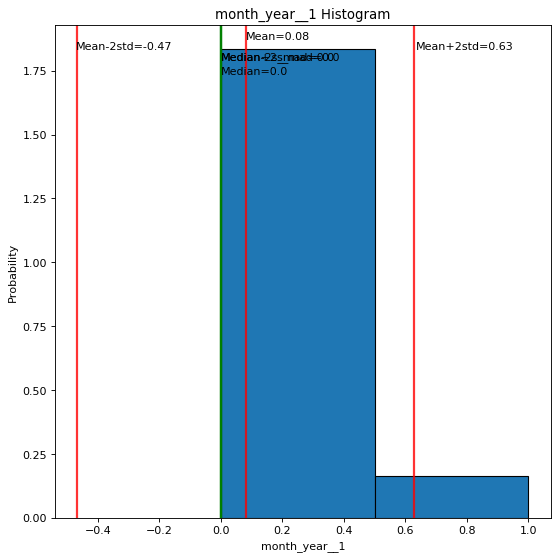

Column month_year__2 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__2:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2698
Skew = 3.1208
kurtosis = 7.7413


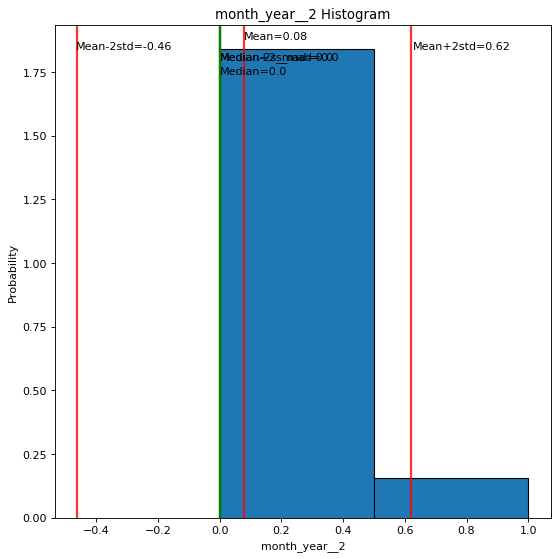

Column month_year__3 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__3:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2788
Skew = 2.9783
kurtosis = 6.8719


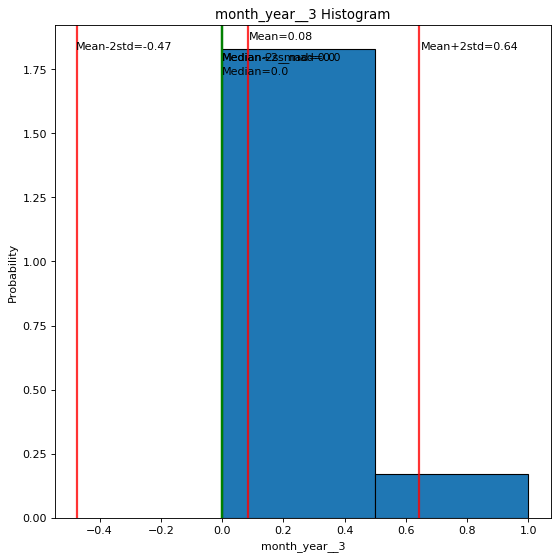

Column month_year__4 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__4:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2678
Skew = 3.1544
kurtosis = 7.9525


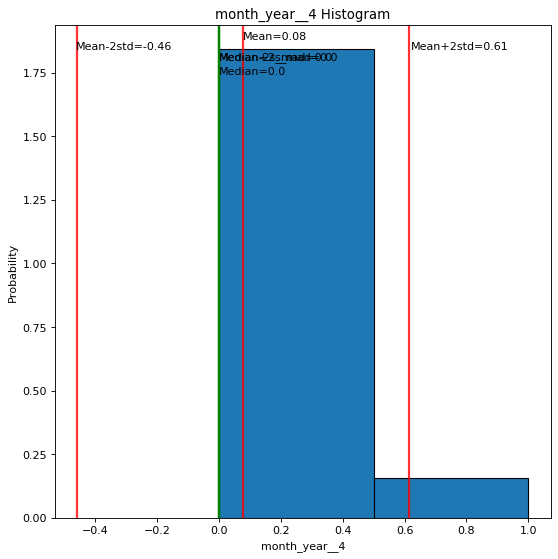

Column month_year__5 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__5:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2739
Skew = 3.0557
kurtosis = 7.3393


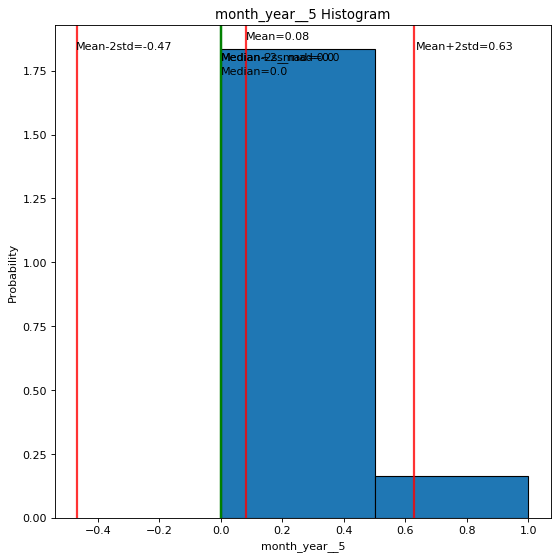

Column month_year__6 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__6:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2721
Skew = 3.0846
kurtosis = 7.5169


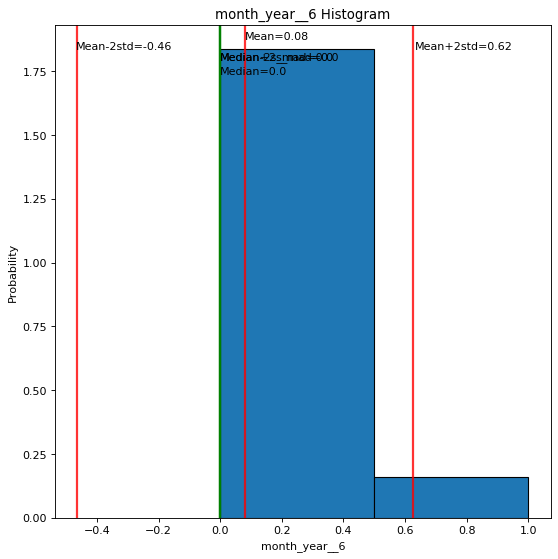

Column month_year__7 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__7:
Min value =  0
Max value =  1
Mean =  0.09
Median = 0.0
Standard deviation = 0.2857
Skew = 2.8736
kurtosis = 6.2593


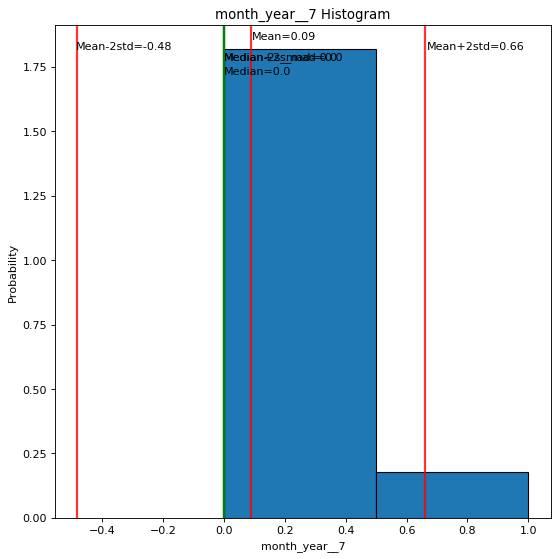

Column month_year__8 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__8:
Min value =  0
Max value =  1
Mean =  0.09
Median = 0.0
Standard deviation = 0.2862
Skew = 2.8652
kurtosis = 6.2112


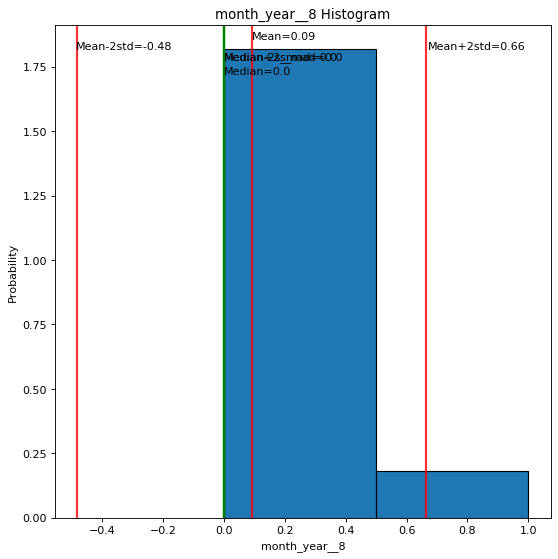

Column month_year__9 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__9:
Min value =  0
Max value =  1
Mean =  0.09
Median = 0.0
Standard deviation = 0.2813
Skew = 2.9396
kurtosis = 6.643


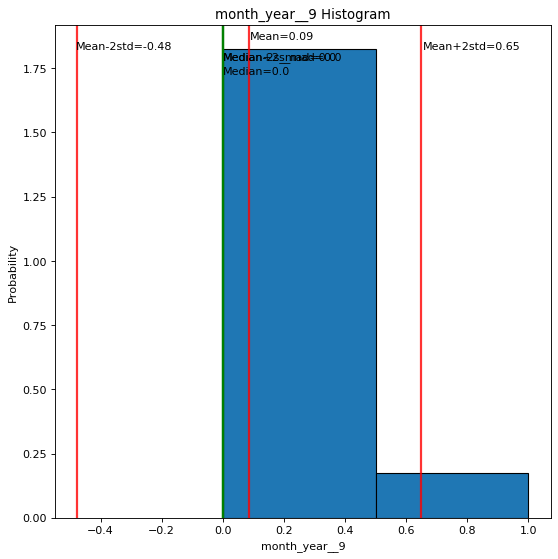

Column month_year__10 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__10:
Min value =  0
Max value =  1
Mean =  0.09
Median = 0.0
Standard deviation = 0.2836
Skew = 2.9048
kurtosis = 6.4395


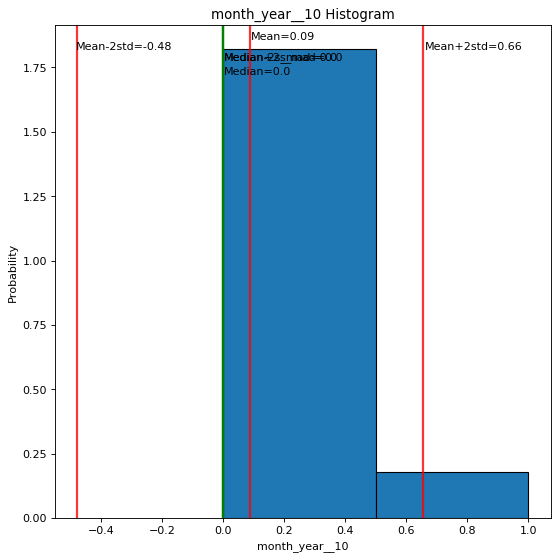

Column month_year__11 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__11:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2776
Skew = 2.9965
kurtosis = 6.9808


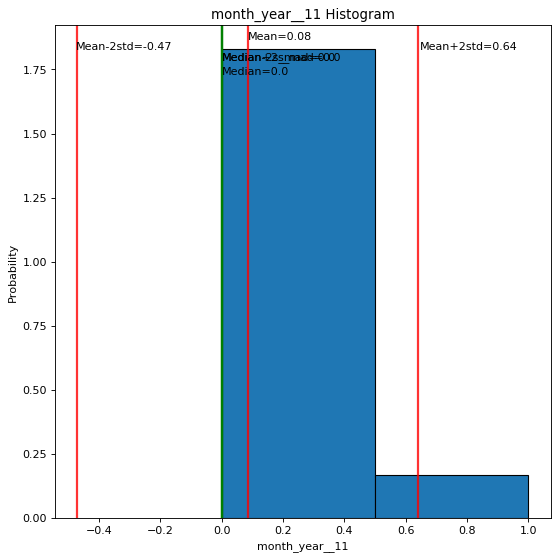

Column month_year__12 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for month_year__12:
Min value =  0
Max value =  1
Mean =  0.08
Median = 0.0
Standard deviation = 0.2647
Skew = 3.2064
kurtosis = 8.283


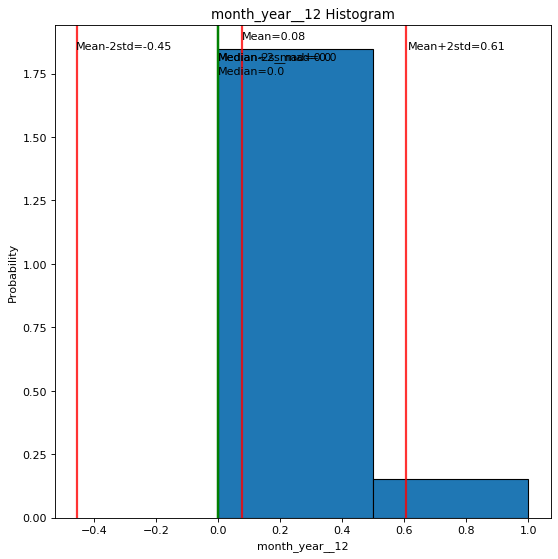

Column week_month__1 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for week_month__1:
Min value =  0
Max value =  1
Mean =  0.09
Median = 0.0
Standard deviation = 0.2932
Skew = 2.7631
kurtosis = 5.6363


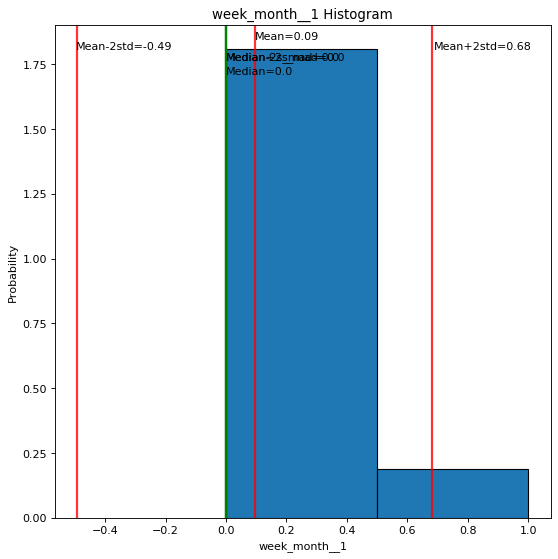

Column week_month__2 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for week_month__2:
Min value =  0
Max value =  1
Mean =  0.23
Median = 0.0
Standard deviation = 0.4219
Skew = 1.2722
kurtosis = -0.3815


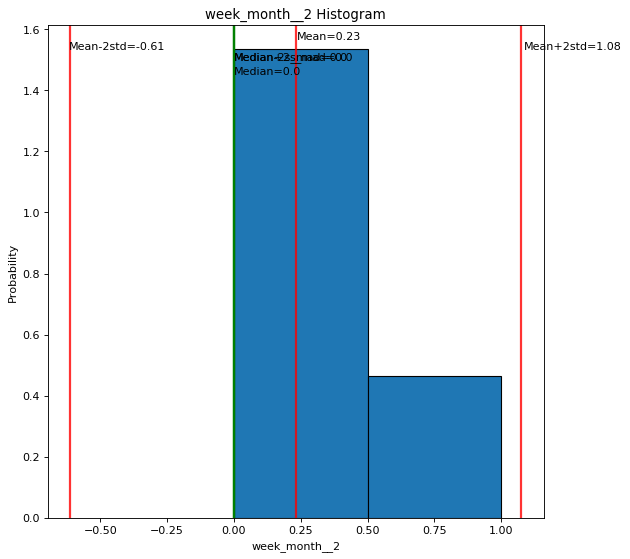

Column week_month__3 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for week_month__3:
Min value =  0
Max value =  1
Mean =  0.24
Median = 0.0
Standard deviation = 0.4241
Skew = 1.2498
kurtosis = -0.4382


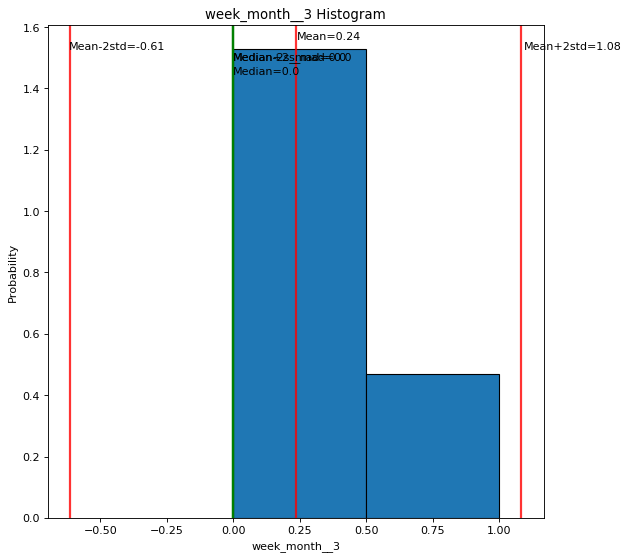

Column week_month__4 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for week_month__4:
Min value =  0
Max value =  1
Mean =  0.23
Median = 0.0
Standard deviation = 0.4199
Skew = 1.2933
kurtosis = -0.3275


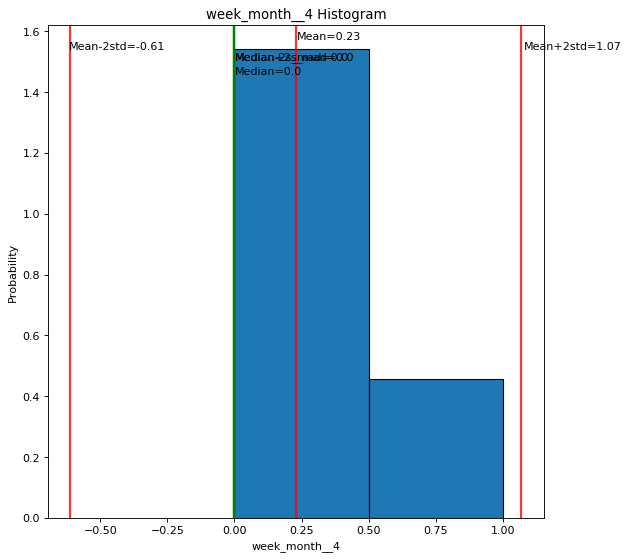

Column week_month__5 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for week_month__5:
Min value =  0
Max value =  1
Mean =  0.2
Median = 0.0
Standard deviation = 0.3974
Skew = 1.5277
kurtosis = 0.334


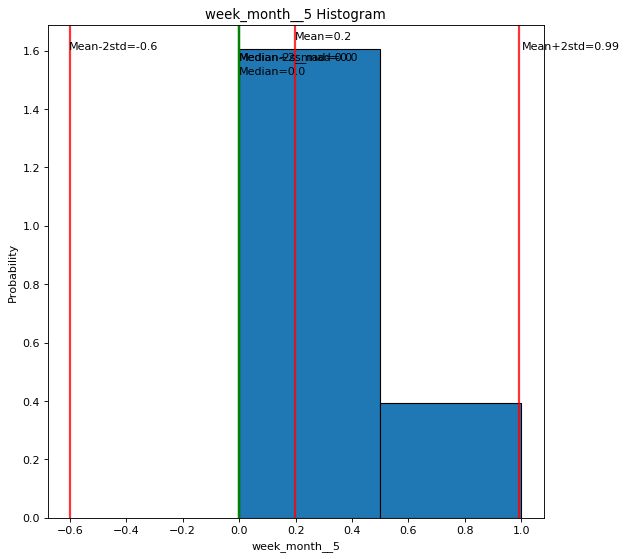

Column week_month__6 is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for week_month__6:
Min value =  0
Max value =  1
Mean =  0.01
Median = 0.0
Standard deviation = 0.1141
Skew = 8.5331
kurtosis = 70.8327


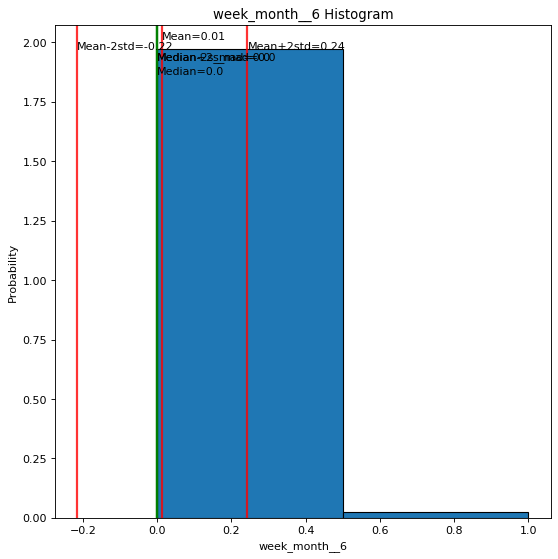

In [31]:
%%skip $skip_feature_analysis
save_graphs = False   #If set true, then all images are saved into the image save directory.

# Print graphs for all features
print_characteristics(features_raw, save_graphs=save_graphs)

Column 1dTrend is a numerical value
Number of unique features 2 
Number of bins <= 100:  2
n=7653, q25=0.00, q75=0.00, min=0.00, max=1.00, interval length=0.00. Number of intervals=2
Feature characteristics for 1dTrend:
Min value =  0
Max value =  1
Mean =  0.15
Median = 0.0
Standard deviation = 0.3554
Skew = 1.9795
kurtosis = 1.9189


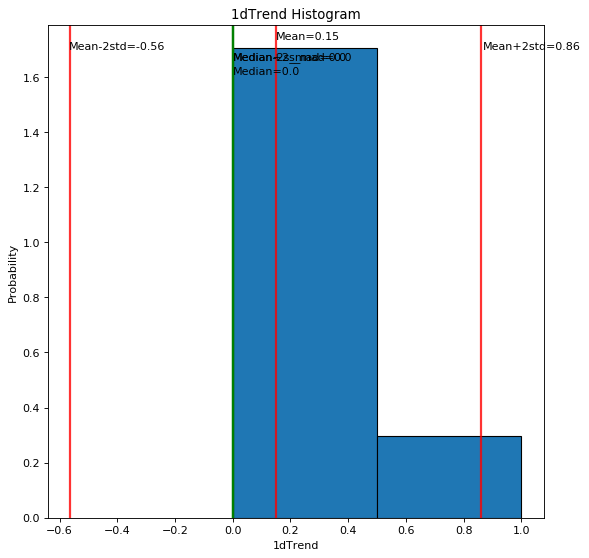

Column 5dTrend is a numerical value
Number of unique features 3 
Number of bins <= 100:  3
n=7653, q25=0.00, q75=0.00, min=0.00, max=2.00, interval length=0.00. Number of intervals=3
Feature characteristics for 5dTrend:
Min value =  0
Max value =  2
Mean =  0.21
Median = 0.0
Standard deviation = 0.5485
Skew = 2.4869
kurtosis = 4.8553


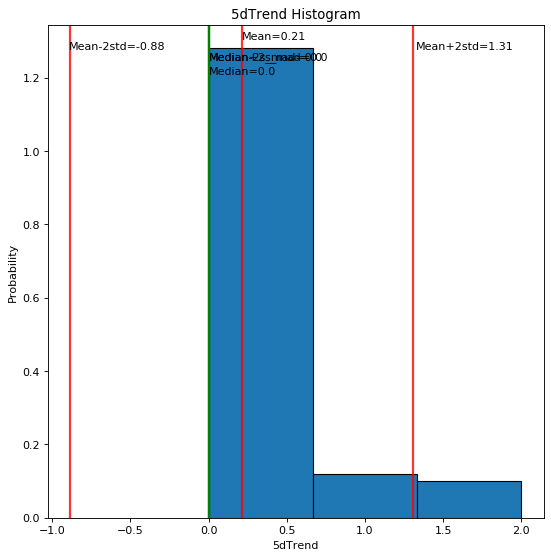

Column 20dTrend is a numerical value
Number of unique features 2 
Number of bins = number of features {}:  2
n=7653, q25=0.00, q75=1.00, min=0.00, max=1.00, interval length=0.10. Number of intervals=2
Feature characteristics for 20dTrend:
Min value =  0
Max value =  1
Mean =  0.59
Median = 1.0
Standard deviation = 0.4922
Skew = -0.3582
kurtosis = -1.8722


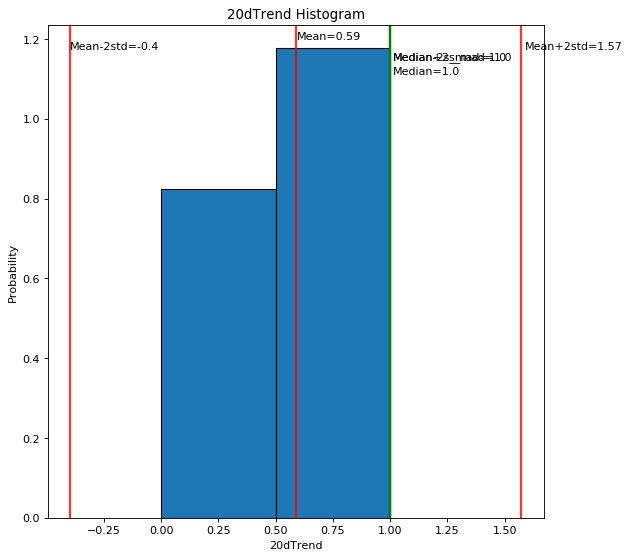

Column LongTrend is a numerical value
Number of unique features 2 
Number of bins = number of features {}:  2
n=7653, q25=1.00, q75=2.00, min=1.00, max=2.00, interval length=0.10. Number of intervals=2
Feature characteristics for LongTrend:
Min value =  1
Max value =  2
Mean =  1.33
Median = 1.0
Standard deviation = 0.4692
Skew = 0.7368
kurtosis = -1.4576


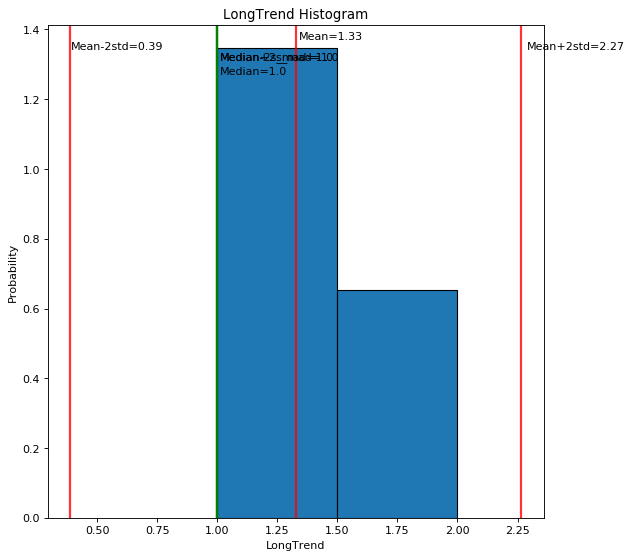

In [32]:
%%skip $skip_feature_analysis
save_graphs = False   #If set true, then all images are saved into the image save directory.

# Print graphs for all features
print_characteristics(outcomes_raw, save_graphs=save_graphs)

In [33]:
#Optional Visualize all numeric values as melted, i.e. visualize the features together

#melted = pd.melt(df, id_vars=[class_Name], value_name="MergedValues")
#melted['MergedValues'].describe()

#%matplotlib inline
#plt.figure(figsize=(12, 4))
#plt.hist(melted['MergedValues'], bins=list(range(0, 500)), log=True)
#plt.xlabel('Value')
#plt.ylabel('Count (log)')
#plt.title("Histogram of Features")
#plt.show()

In [34]:
#Visualize only the class to see if it is skewed
#vis.paintBarChartForCategorical(df[class_Name].value_counts().index, df[class_Name].value_counts())

## Prepare the Feature Columns

In [35]:
#=== Replace signs for missing values or other values with ===#
features = features_raw.copy()

#Custom replacements, replace only if there is something to replace, else it makes NAN of it
#value_replacements = {
#    'n': 0,
#    'y': 1,
#    'unknown': np.NAN
#}

#=== Replace all custom values and missing values with content from the value_replacement
for col in features.columns:
    #df_dig[col] = df[col].map(value_replacements)
    #df_dig[col] = df[col].replace('?', np.nan)
    
    #Everything to numeric
    features[col] = pd.to_numeric(features[col])
    #df_dig[col] = np.int64(df_dig[col])
    
display(features.head(5))

,NormKurs5,NormKurs20,NormKurs50,NormKurs100,NormKurs200,NumberRise5,NumberRise20,NumberRise50,NumberRise100,NumberRise200,...,month_year__9,month_year__10,month_year__11,month_year__12,week_month__1,week_month__2,week_month__3,week_month__4,week_month__5,week_month__6
id,,,,,,,,,,,,,,,,,,,,,
400,0.165017,0.387097,0.627146,0.861650,0.481655,0.6,0.60,0.64,0.63,0.570,...,0,0,0,0,0,0,1,0,0,0
401,0.280000,0.404570,0.622979,0.865595,0.483685,0.6,0.60,0.64,0.64,0.570,...,0,0,0,0,0,0,1,0,0,0
402,0.000000,0.265668,0.447686,0.825659,0.467135,0.6,0.55,0.62,0.64,0.565,...,0,0,0,0,0,0,1,0,0,0
403,0.000000,0.338262,0.435614,0.818681,0.465262,0.6,0.55,0.60,0.63,0.560,...,0,0,0,0,0,0,1,0,0,0
404,1.000000,0.576710,0.565392,0.857379,0.485402,0.6,0.60,0.60,0.63,0.560,...,0,0,0,0,0,0,0,1,0,0


In [36]:
#Create one-hot-encoding for certain classes and replace the original class
#onehotlabels = pd.get_dummies(df_dig.iloc[:,1])

#Add one-hot-encondig columns to the dataset
#for i, name in enumerate(onehotlabels.columns):
#    df_dig.insert(i+1, column='Cylinder' + str(name), value=onehotlabels.loc[:,name])

#Remove the original columns
#df_dig.drop(columns=['cylinders'], inplace=True)

## Prepare the Outcomes

In [37]:
# Replace classes with digital values
outcomes = outcomes_raw.copy()
outcomes = outcomes.astype(int)
print("Outcome types")
print(outcomes.dtypes)

Outcome types
1dTrend      int32
5dTrend      int32
20dTrend     int32
LongTrend    int32
dtype: object


### Binarize Multiclass Dataset

In [38]:
#If the binaryize setting is used, then binarize the class of the outcome.
if conf['binarize_labels']==True:
    binarized_outcome = (outcomes[conf['class_name']] == conf['class_number']).astype(np.int_)
    y = binarized_outcome.values.flatten()
    print("y was binarized. Classes before: {}. Classes after: {}".format(np.unique(outcomes[conf['class_name']]), np.unique(y)))
    
    #Redefine class labels
    class_labels = {
        0 : conf['binary_0_label'],
        1 : conf['binary_1_label']
    }
    
    print("Class labels redefined to: {}".format(class_labels))
else:
    y = outcomes[conf['class_name']].values.flatten()
    print("No binarization was made. Classes: {}".format(np.unique(y)))

y was binarized. Classes before: [1 2]. Classes after: [0 1]
Class labels redefined to: {0: 'Neg. Trend', 1: 'Pos. Trend'}


In [39]:
#y = outcomes[class_name].values.flatten()
#y_labels = class_labels
#class_labels_inverse = sup.inverse_dict(class_labels)

print("y shape: {}".format(y.shape))
print("y labels: {}".format(class_labels))
print("y unique classes: {}".format(np.unique(y, axis=0)))

y shape: (7653,)
y labels: {0: 'Neg. Trend', 1: 'Pos. Trend'}
y unique classes: [0 1]


## Determine Missing Data
Missing data is only visualized here as it is handled in the training algorithm in S40.

In [40]:
# Check if there are any nulls in the data
print("Missing data in the features: ", features.isnull().values.sum())
features[features.isna().any(axis=1)]

Missing data in the features:  0


,NormKurs5,NormKurs20,NormKurs50,NormKurs100,NormKurs200,NumberRise5,NumberRise20,NumberRise50,NumberRise100,NumberRise200,...,month_year__9,month_year__10,month_year__11,month_year__12,week_month__1,week_month__2,week_month__3,week_month__4,week_month__5,week_month__6
id,,,,,,,,,,,,,,,,,,,,,


Number of missing values per feature


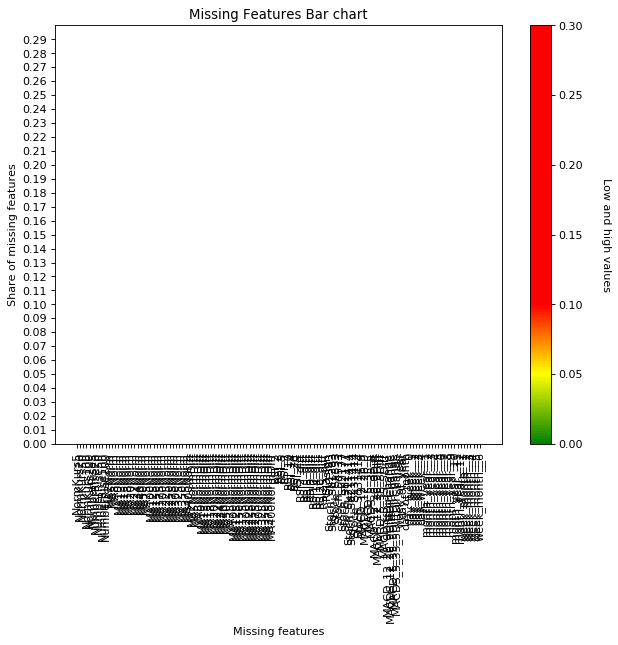

In [41]:
#Missing data part
print("Number of missing values per feature")
missingValueShare = []
for col in features.columns:
    #if is_string_dtype(df_dig[col]):
    missingValueShare.append(sum(features[col].isna())/numSamples)

#Print missing value graph
vis.paintBarChartForMissingValues(features.columns, missingValueShare)

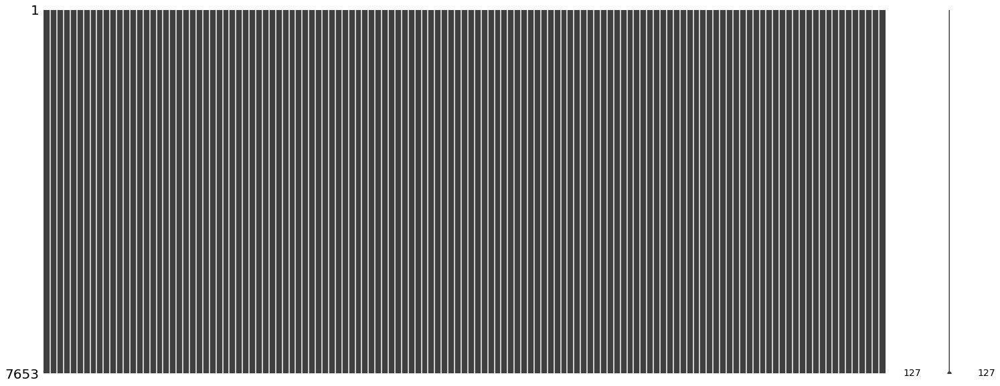

In [43]:
#Visualize missing data with missingno
import missingno as msno
%matplotlib inline
msno.matrix(features)

In [44]:
if features.isnull().values.sum()>0:
    msno.heatmap(features)

#### View Prepared Binary Features

We need some more plots for the binary data types.

In [45]:
#vis.plotBinaryValues(df_dig, df_dig.columns) #0:-1
#plt.savefig(image_save_directory + "/BinaryFeatures.png", dpi=70)

## Feature Visualization

### Auto Correlations of Time Dependent Variables

Source: https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/

#### Autoregression Intuition

Consider a time series that was generated by an autoregression (AR) process with a lag of k. We know that the ACF describes the autocorrelation between an observation and another observation at a prior time step that includes direct and indirect dependence information. This means we would expect the ACF for the AR(k) time series to be strong to a lag of k and the inertia of that relationship would carry on to subsequent lag values, trailing off at some point as the effect was weakened. We know that the PACF only describes the direct relationship between an observation and its lag. This would suggest that there would be no correlation for lag values beyond k. This is exactly the expectation of the ACF and PACF plots for an AR(k) process.

#### Moving Average Intuition

Consider a time series that was generated by a moving average (MA) process with a lag of k. Remember that the moving average process is an autoregression model of the time series of residual errors from prior predictions. Another way to think about the moving average model is that it corrects future forecasts based on errors made on recent forecasts. We would expect the ACF for the MA(k) process to show a strong correlation with recent values up to the lag of k, then a sharp decline to low or no correlation. By definition, this is how the process was generated. For the PACF, we would expect the plot to show a strong relationship to the lag and a trailing off of correlation from the lag onwards. Again, this is exactly the expectation of the ACF and PACF plots for an MA(k) process.

if the autocorrelation function has a very long tail, then it is no stationary process

Plot the total autocorrelation of the price. The dark blue values are the correlation of the price with the lag. The light blue cone is the confidence interval. If the correlation is > cone, the value is significant.


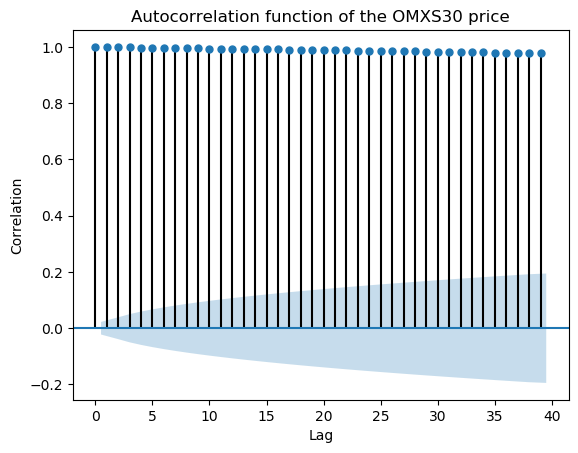

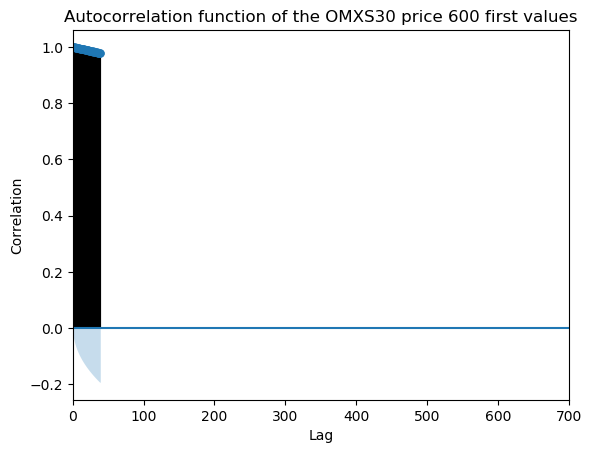

Ljung-Box statistics: p-value= [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
If p values > 0.05 then there are significant autocorrelations.


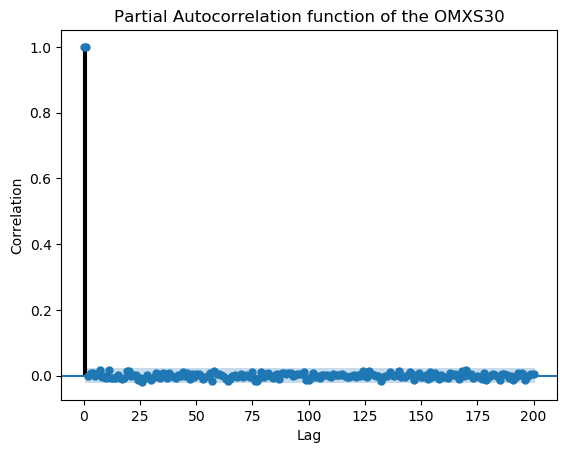

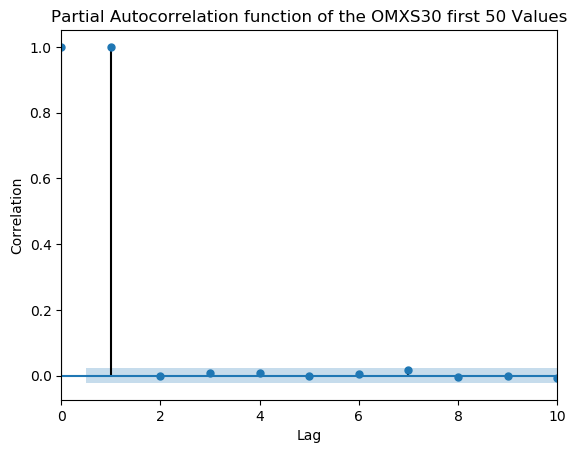

In [47]:
%%skip $skip_feature_analysis
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox

m.rc_file_defaults() #Reset sns

#Here, the time graph is selected
print("Plot the total autocorrelation of the price. The dark blue values are the correlation of the price with the lag. "+
      "The light blue cone is the confidence interval. If the correlation is > cone, the value is significant.")
plot_acf(np.log(source['Close']))
plt.title("Autocorrelation function of the OMXS30 price")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.show()

plot_acf(np.log(source['Close']))
plt.title("Autocorrelation function of the OMXS30 price 600 first values")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.xlim([0,700])
plt.show()

print("Ljung-Box statistics: p-value=", acorr_ljungbox(np.log(source['Close']), lags=None, boxpierce="Ljung-Box")[1])
print("If p values > 0.05 then there are significant autocorrelations.")

plot_pacf(np.log(source['Close']), lags=200)
plt.title("Partial Autocorrelation function of the OMXS30")
plt.xlabel("Lag")
plt.ylabel("Correlation")
#plt.xlim([0,700])
plt.show()

plot_pacf(np.log(source['Close']), lags=50)
plt.title("Partial Autocorrelation function of the OMXS30 first 50 Values")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.xlim([0,10])
plt.show()

Plot the total autocorrelation of the price. The dark blue values are the correlation of the price with the lag. The light blue cone is the confidence interval. If the correlation is > cone, the value is significant.


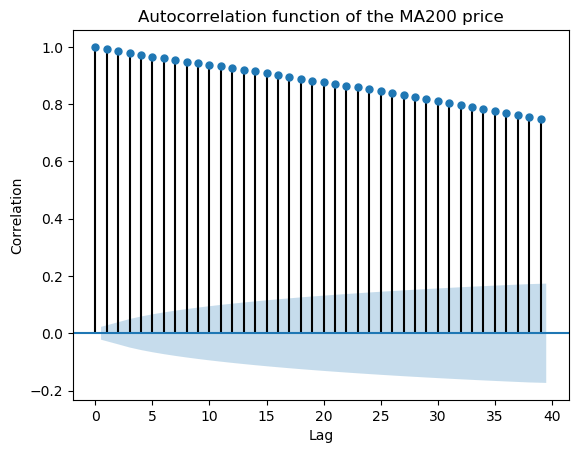

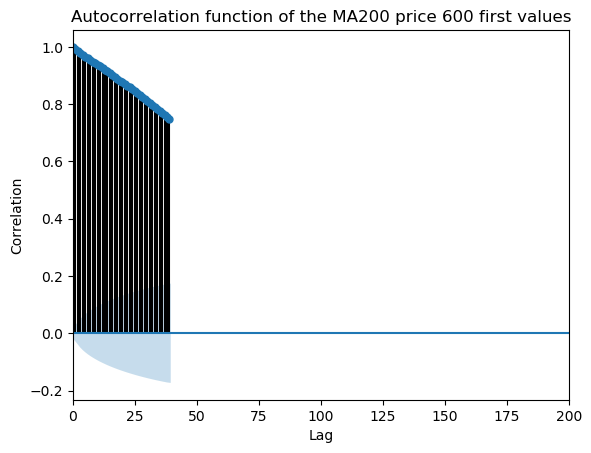

Ljung-Box statistics: p-value= [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
If p values > 0.05 then there are significant autocorrelations.


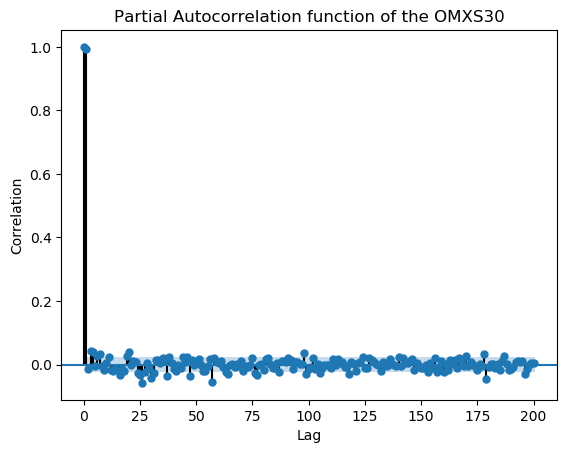

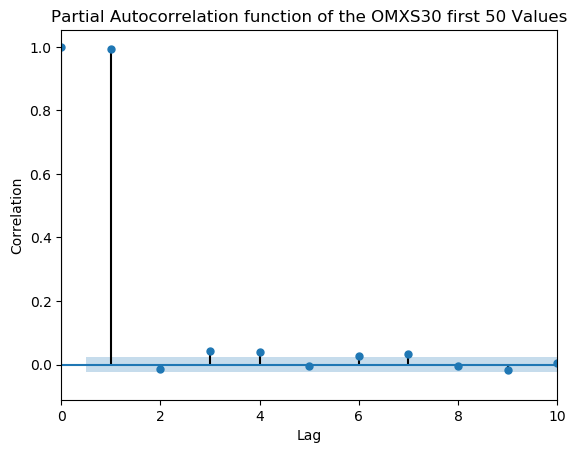

In [49]:
%%skip $skip_feature_analysis
#Here, the time graph is selected
print("Plot the total autocorrelation of the price. The dark blue values are the correlation of the price with the lag. "+
      "The light blue cone is the confidence interval. If the correlation is > cone, the value is significant.")
plot_acf(features.MA200Norm)
plt.title("Autocorrelation function of the MA200 price")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.show()

plot_acf(features.MA200Norm)
plt.title("Autocorrelation function of the MA200 price 600 first values")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.xlim([0,200])
plt.show()

print("Ljung-Box statistics: p-value=", acorr_ljungbox(features.MA200Norm, lags=None, boxpierce="Ljung-Box")[1])
print("If p values > 0.05 then there are significant autocorrelations.")

plot_pacf(features.MA200Norm, lags=200)
plt.title("Partial Autocorrelation function of the OMXS30")
plt.xlabel("Lag")
plt.ylabel("Correlation")
#plt.xlim([0,700])
plt.show()

plot_pacf(features.MA200Norm, lags=50)
plt.title("Partial Autocorrelation function of the OMXS30 first 50 Values")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.xlim([0,10])
plt.show()

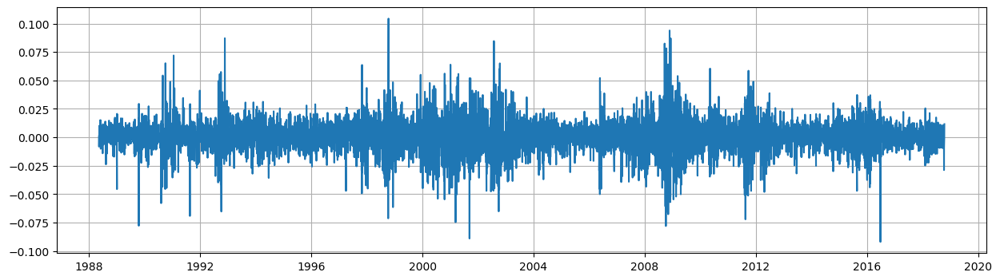

In [54]:
%%skip $skip_feature_analysis
#Plot difference between time values to see if the differences are stationary
diff = pd.DataFrame(data=np.divide(source['Close'] - source['Close'].shift(1), source['Close'])).set_index(source['Date'])
diff=diff.iloc[1:,:]
fig = plt.figure(figsize= (15, 4))
plt.plot(source['Date'].iloc[1:], diff)
plt.grid()

Plot the total autocorrelation of the price. The dark blue values are the correlation of the price with the lag. The light blue cone is the confidence interval. If the correlation is > cone, the value is significant.


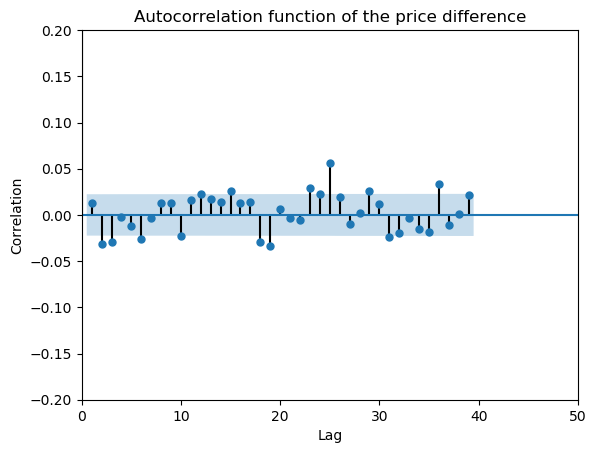

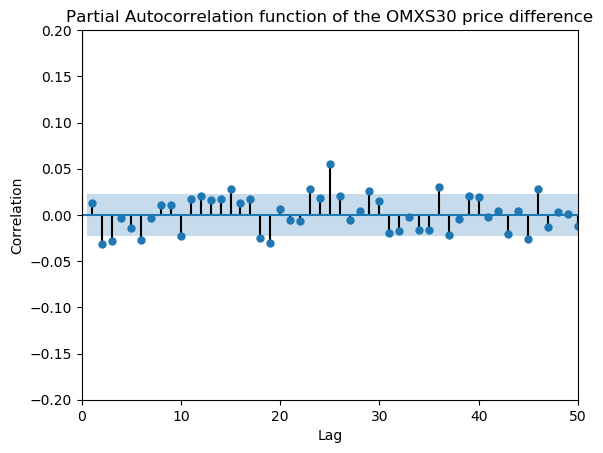

Ljung-Box statistics: p-value= [0.243 0.011 0.001 0.004 0.005 0.001 0.002 0.003 0.004 0.001 0.001 0.001
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.   ]
If p values > 0.05 then there are significant autocorrelations.


In [55]:
%%skip $skip_feature_analysis
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox

#Here, the time graph is selected
print("Plot the total autocorrelation of the price. The dark blue values are the correlation of the price with the lag. "+
      "The light blue cone is the confidence interval. If the correlation is > cone, the value is significant.")

plot_acf(diff)
plt.title("Autocorrelation function of the price difference")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.ylim([-0.2, 0.2])
plt.xlim([0,50])
plt.show()

plot_pacf(diff, lags=100)
plt.title("Partial Autocorrelation function of the OMXS30 price difference")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.xlim([0,50])
plt.ylim([-0.2, 0.2])
plt.show()

print("Ljung-Box statistics: p-value=", acorr_ljungbox(diff, lags=None, boxpierce="Ljung-Box")[1])
print("If p values > 0.05 then there are significant autocorrelations.")

# Feature Visualization
Here, feature selection and visulization of datasets is performed
Methods
- Feature visualization through t-SNE
- Feature visualization and analysis through PCA

### Standardize Data for Feature Selection and Visualization
Z-Normalize the data around zero and divided by standard deviation. Fit the normalizer on the training data and transform the training and the test data. The reason is that the scaler only must depend on the training data, in order to prevent leakage of information from the test data.

In [56]:
from sklearn import preprocessing

#=== Select the best type of scaler ===#
scaler = preprocessing.StandardScaler() #Because normal distribution. Don't use minmax scaler for PCA or unsupervised learning
# as the axis shall be centered and not shifted.


scaler.fit(features)
#Use this scaler also for the test data at the end
X_scaled = pd.DataFrame(data=scaler.transform(features), index = features.index, columns=features.columns)
print("Unscaled values")
display(features.iloc[0:2,:])
print("Scaled values")
display(X_scaled.iloc[0:2,:])

scaler.fit(y.reshape(-1, 1))
y_scaled = pd.DataFrame(data=scaler.transform(y.reshape(-1, 1)), index = features.index, columns=[conf['class_name']])
print("Unscaled values")
display(y[0:10])
print("Scaled values")
display(y_scaled.iloc[0:10,:])

Unscaled values


C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\ipykernel_launcher.py:10: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  # Remove the CWD from sys.path while we load stuff.


,NormKurs5,NormKurs20,NormKurs50,NormKurs100,NormKurs200,NumberRise5,NumberRise20,NumberRise50,NumberRise100,NumberRise200,...,month_year__9,month_year__10,month_year__11,month_year__12,week_month__1,week_month__2,week_month__3,week_month__4,week_month__5,week_month__6
id,,,,,,,,,,,,,,,,,,,,,
400,0.165017,0.387097,0.627146,0.861650,0.481655,0.6,0.6,0.64,0.63,0.57,...,0,0,0,0,0,0,1,0,0,0
401,0.280000,0.404570,0.622979,0.865595,0.483685,0.6,0.6,0.64,0.64,0.57,...,0,0,0,0,0,0,1,0,0,0


Scaled values


,NormKurs5,NormKurs20,NormKurs50,NormKurs100,NormKurs200,NumberRise5,NumberRise20,NumberRise50,NumberRise100,NumberRise200,...,month_year__9,month_year__10,month_year__11,month_year__12,week_month__1,week_month__2,week_month__3,week_month__4,week_month__5,week_month__6
id,,,,,,,,,,,,,,,,,,,,,
400,-0.922128,-0.567255,0.009929,0.661929,-0.570328,0.330882,0.629472,1.460282,1.763698,0.960768,...,-0.307977,-0.311019,-0.30312,-0.28636,-0.323986,-0.549118,1.803893,-0.544279,-0.494563,-0.115646
401,-0.646824,-0.518358,-0.002529,0.674025,-0.563928,0.330882,0.629472,1.460282,1.932966,0.960768,...,-0.307977,-0.311019,-0.30312,-0.28636,-0.323986,-0.549118,1.803893,-0.544279,-0.494563,-0.115646


Unscaled values


C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

Scaled values


,LongTrend
id,
400,0.697358
401,0.697358
402,0.697358
403,0.697358
404,0.697358
405,0.697358
406,0.697358
407,0.697358
408,0.697358


### Feature and Outcomes Correlation Matrix

In [57]:
total_values = X_scaled.join(y_scaled)
print("Merged features and outcomes to use in correlation matrix")

Merged features and outcomes to use in correlation matrix


In [58]:
#Select column values to use in the correlation plot
feature_plot=list(range(0,10,1))
#Select outcomes to show
feature_plot.extend([-4, -3, -2, -1])

print(feature_plot)
print(total_values.columns[feature_plot])

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -4, -3, -2, -1]
Index(['NormKurs5', 'NormKurs20', 'NormKurs50', 'NormKurs100', 'NormKurs200',
       'NumberRise5', 'NumberRise20', 'NumberRise50', 'NumberRise100',
       'NumberRise200', 'week_month__4', 'week_month__5', 'week_month__6',
       'LongTrend'],
      dtype='object')


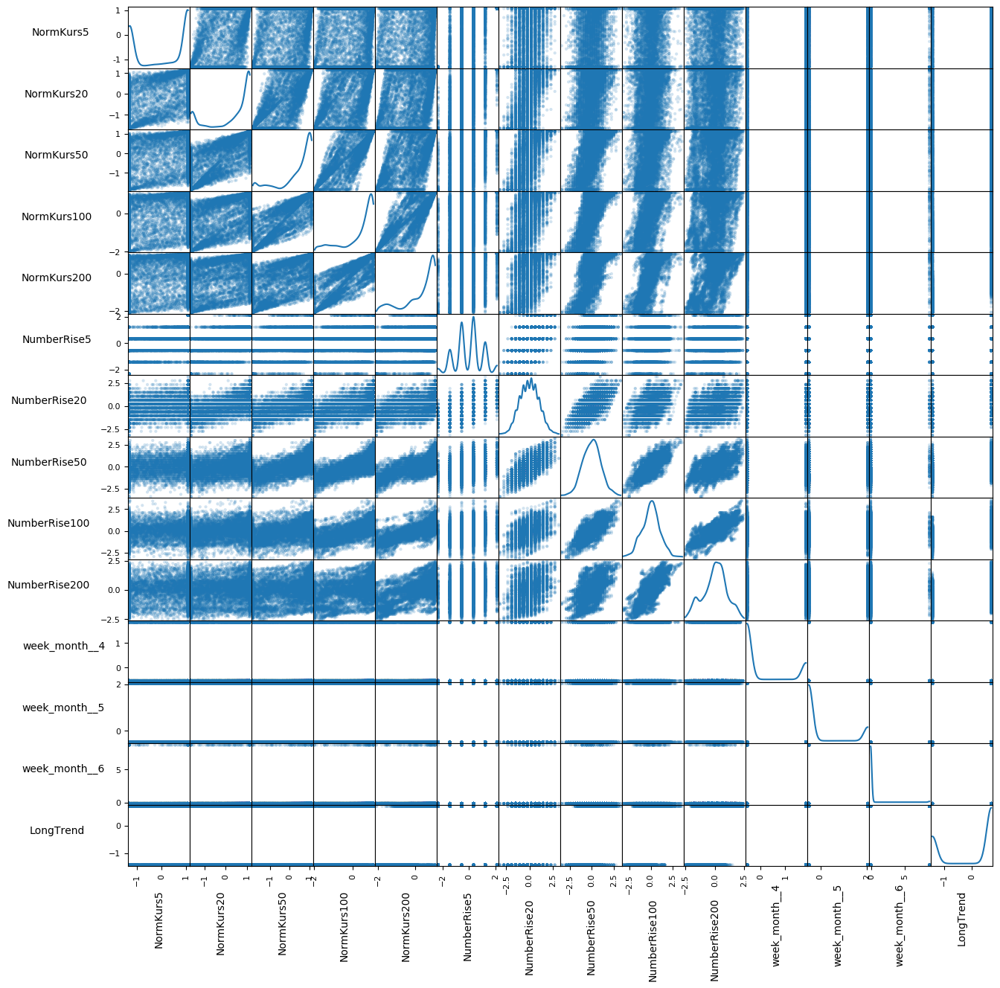

In [59]:
%%skip $skip_feature_analysis
#http://benalexkeen.com/correlation-in-python/
#https://stackoverflow.com/questions/26975089/making-the-labels-of-the-scatterplot-vertical-and-horizontal-in-pandas
from matplotlib.artist import setp

m.rc_file_defaults() #Reset sns

axs = pd.plotting.scatter_matrix(total_values.iloc[:,feature_plot], figsize=(15, 15), alpha=0.2, diagonal='kde')
n = len(features.iloc[:,feature_plot].columns)
for i in range(n):
    for j in range(n):
        # to get the axis of subplots
        ax = axs[i, j]
        # to make x axis name vertical  
        ax.xaxis.label.set_rotation(90)
        # to make y axis name horizontal 
        ax.yaxis.label.set_rotation(0)
        # to make sure y axis names are outside the plot area
        ax.yaxis.labelpad = 50
#plt.yticks(rotation=90)
plt.show()

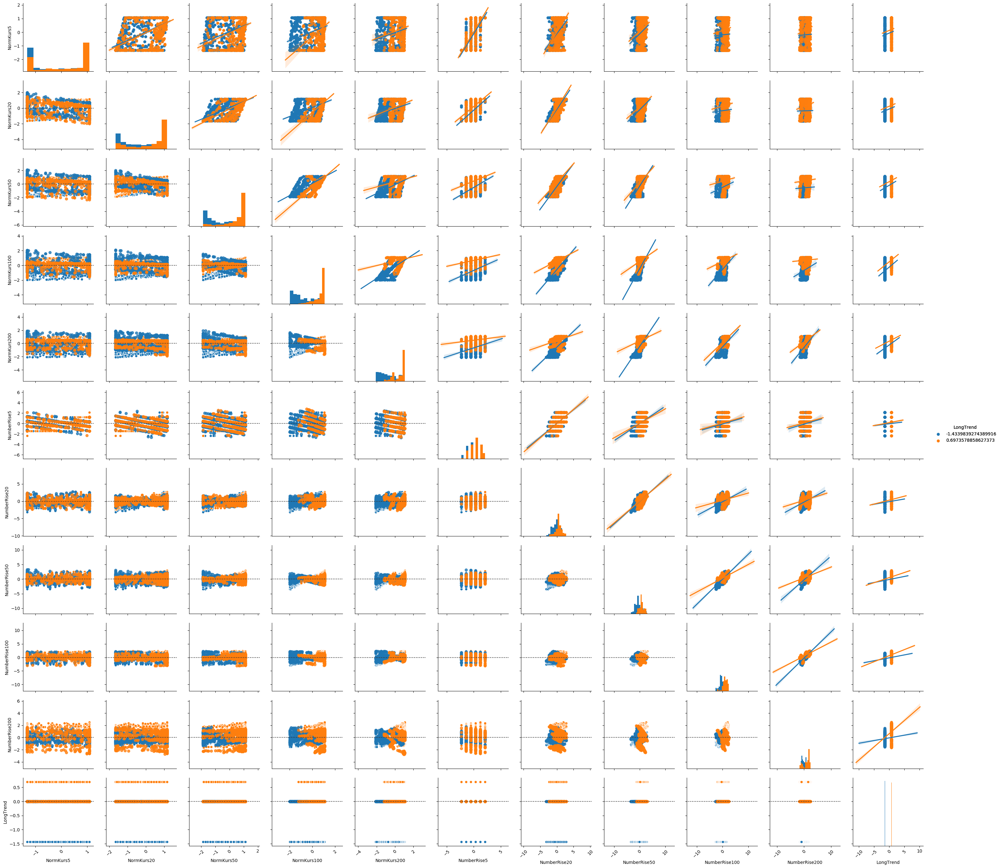

In [60]:
%%skip $skip_feature_analysis
import seaborn as sns

# https://blog.insightdatascience.com/data-visualization-in-python-advanced-functionality-in-seaborn-20d217f1a9a6

feature_plot=list(range(0,10,1))
feature_plot.extend([-1])

g = sns.pairplot(total_values.iloc[0:1000,feature_plot], hue=conf['class_name'], diag_kind="hist")
#total_values.columns[-1]
g.map_upper(sns.regplot) 
g.map_lower(sns.residplot) 
g.map_diag(plt.hist) 
for ax in g.axes.flat: 
    plt.setp(ax.get_xticklabels(), rotation=45) 
g.add_legend() 
g.set(alpha=0.5)

plt.show()

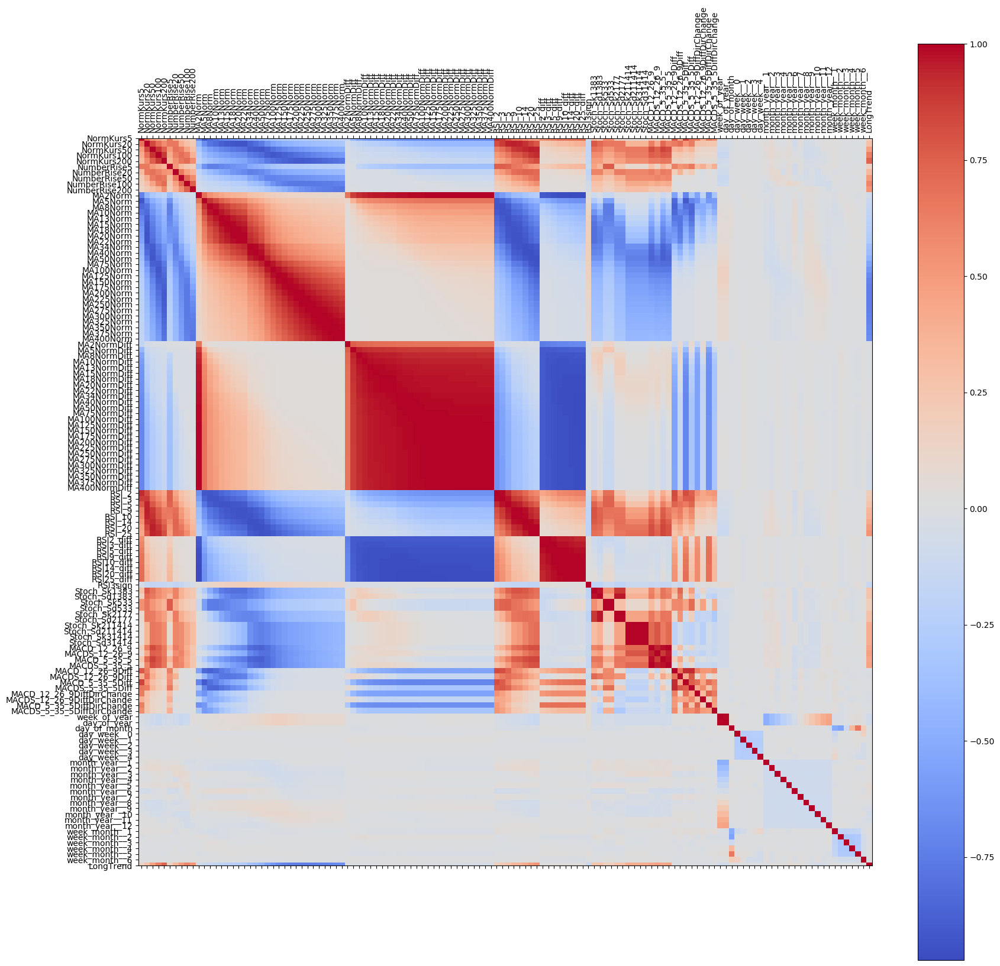

In [61]:
%%skip $skip_feature_analysis
#http://benalexkeen.com/correlation-in-python/
matfig = plt.figure(figsize=(20, 20))
plt.matshow(total_values.corr(method='spearman'), fignum=1, cmap=plt.get_cmap('coolwarm')) #Use spearman correlation instead of pearson to have a robust correlation
plt.xticks(range(len(total_values.columns)), total_values.columns)
plt.yticks(range(len(total_values.columns)), total_values.columns)
plt.xticks(rotation=90)
plt.colorbar()
plt.show()

In [62]:
%%skip $skip_feature_analysis
subx = X_scaled.iloc[1000:2000, 0:4]
suby = y_scaled.iloc[1000:2000]

display(subx)
display(suby)

type(suby)
subx.corrwith(suby[conf['class_name']], drop=True)

,NormKurs5,NormKurs20,NormKurs50,NormKurs100
id,,,,
1400,1.077072,1.124166,0.337419,0.640711
1401,1.077072,1.147922,0.503869,0.761092
1402,1.077072,1.147922,0.924770,0.981602
1403,1.077072,1.147922,1.070796,1.058105
1404,0.973813,1.101037,1.031069,1.040105
...,...,...,...,...
2395,-0.185855,-1.351932,-0.124291,0.382771
2396,1.077072,-0.636696,0.232997,0.584039
2397,-0.298757,-1.171387,-0.034102,0.433577


,LongTrend
id,
1400,-1.433984
1401,-1.433984
1402,-1.433984
1403,-1.433984
1404,-1.433984
...,...
2395,0.697358
2396,0.697358
2397,0.697358


NormKurs5        0.139529
NormKurs20       0.285745
NormKurs50       0.489858
NormKurs100      0.654163
NormKurs200      0.797477
                   ...   
week_month__2   -0.003227
week_month__3   -0.004848
week_month__4   -0.000492
week_month__5   -0.004838
week_month__6    0.004994
Length: 127, dtype: float64

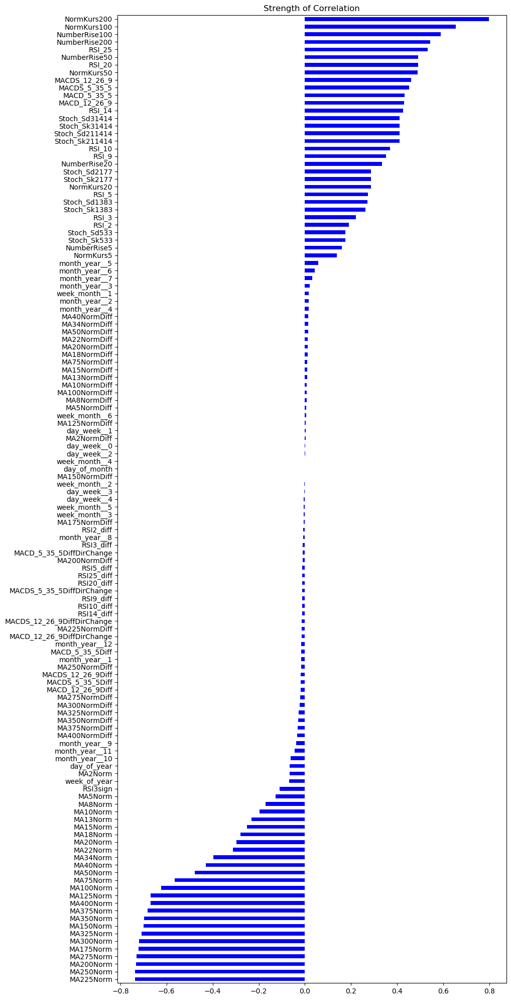

In [63]:
#import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import display

from scipy.cluster import hierarchy
from scipy.spatial import distance

m.rc_file_defaults() #Reset sns

corr = X_scaled.corrwith(y_scaled[conf['class_name']], axis = 0)
corr.sort_values().plot.barh(color = 'blue',title = 'Strength of Correlation', figsize=(10,25))
display(corr)

C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


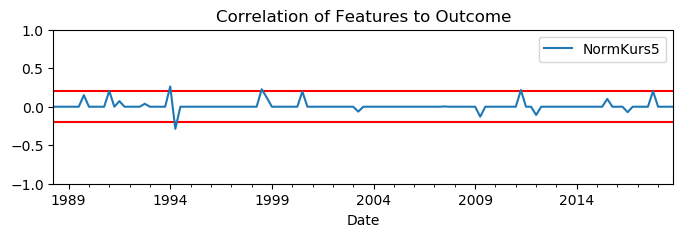

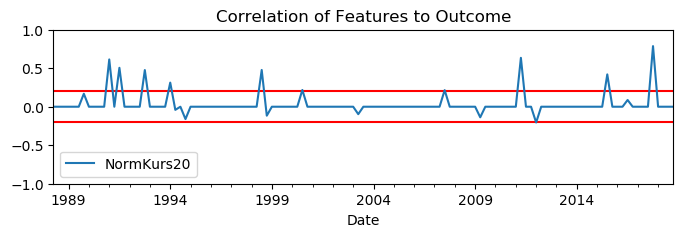

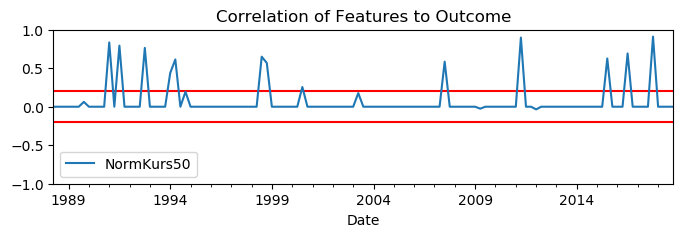

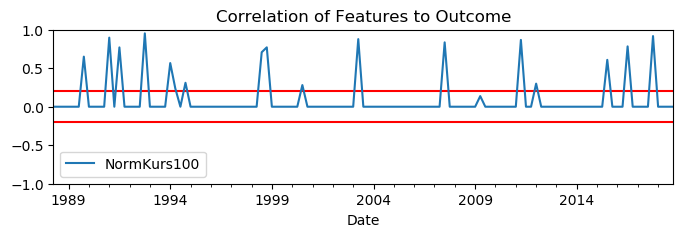

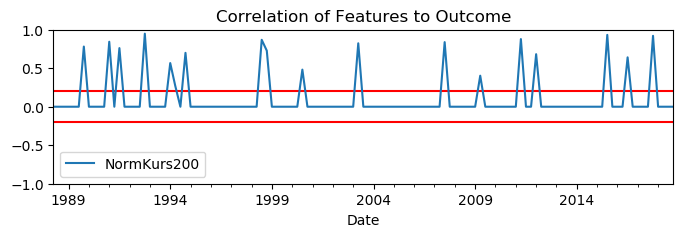

...

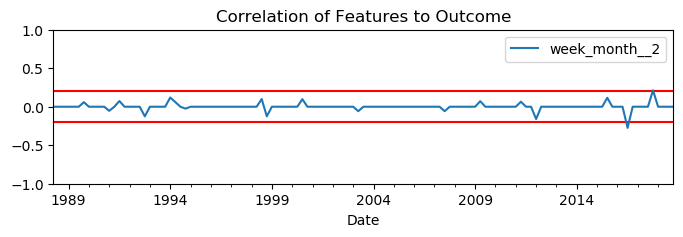

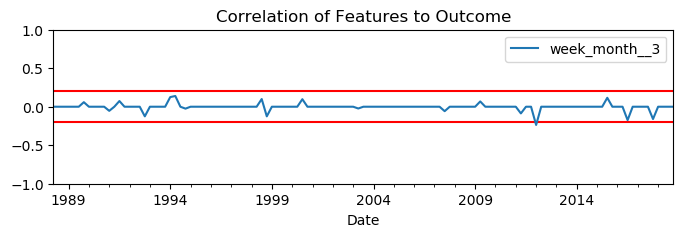

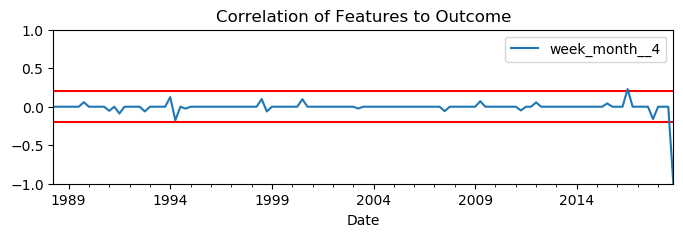

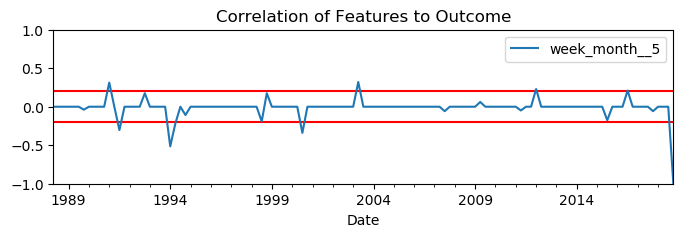

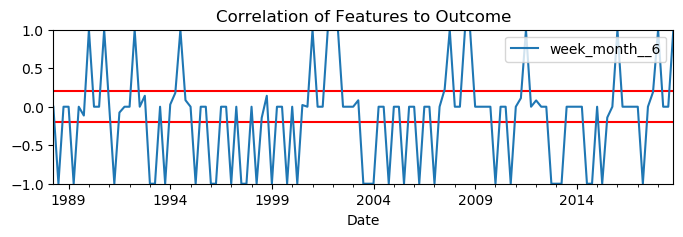

In [65]:
%%skip $skip_feature_analysis

################
## VERBESSERUNG
################

#Only for time series continuous correlation
#Check correlations for the following attributes
for col in X_scaled.columns:
    #cols = ['MA100Norm', 'RSI20']
    #col_index = [X_scaled.columns.get_loc(c) for c in cols if c in X_scaled]
    col_index = [X_scaled.columns.get_loc(col)]

    tmp = X_scaled.iloc[:,col_index].join(source).join(y_scaled).reset_index().set_index('Date').drop(columns=['id', 'Open', 'High', 'Low', 'Close'])
    #display(tmp)
    tmp.dropna().resample('Q').apply(lambda x: x.corr()).iloc[:,-1].unstack().iloc[:,:-1].plot(title='Correlation of Features to Outcome', figsize=(8,2))
    plt.ylim(-1, 1)
    plt.hlines([-0.2, 0.2], xmin=tmp.index[0], xmax=tmp.index[-1], colors='r')

In [66]:
#tmp = X_scaled.iloc[:,[0]].join(df_timegraph).join(y_scaled).reset_index().set_index('Time').drop(columns=['id', 'High', 'Low', 'Close'])
#tmp
#tmp.dropna().resample('M').apply(lambda x: x.corr()).iloc[:,-1].unstack().iloc[:,:-1]
#fig = plt.Figure()
#plt.scatter(tmp.iloc[:,1], tmp.iloc[:,0])

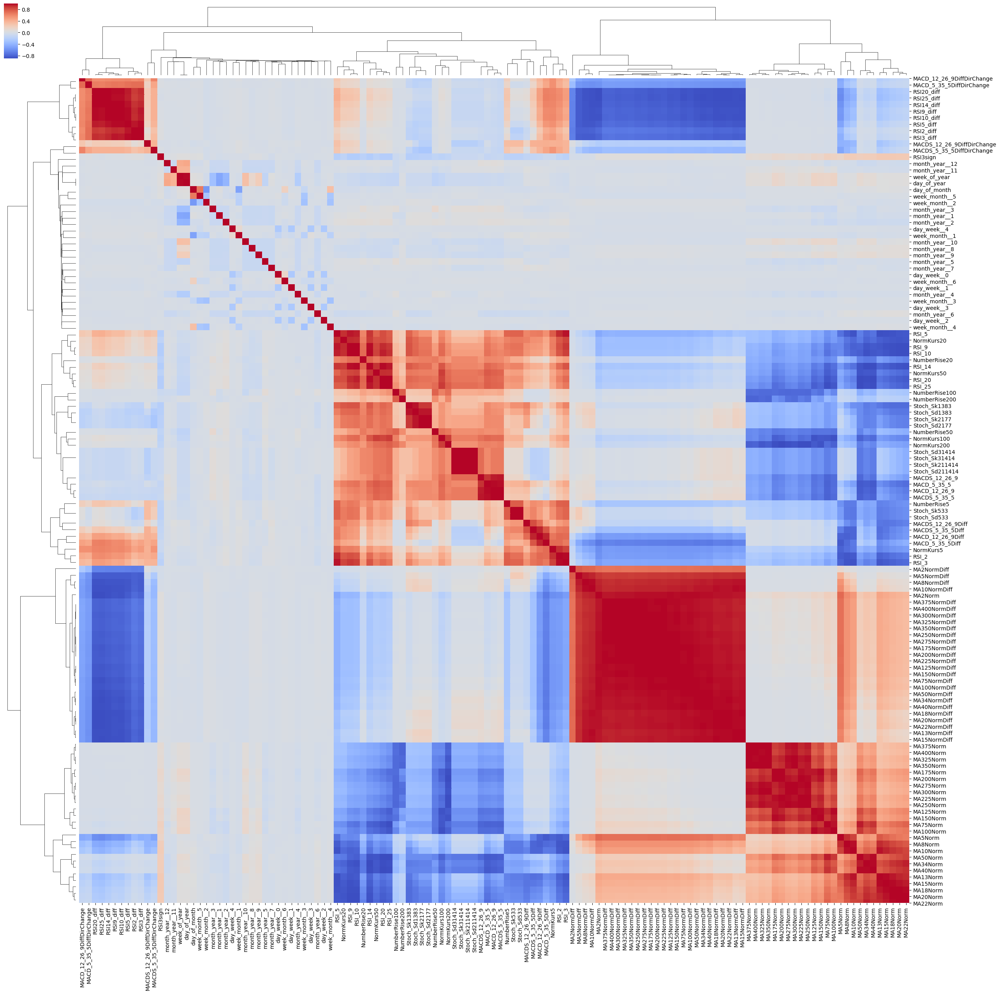

In [67]:
%%skip $skip_feature_analysis
corr_matrix = X_scaled.corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage, row_cluster=True,col_cluster=True,figsize=(30,30),cmap=plt.get_cmap('coolwarm'))
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

### Feature visualization with Parallel Coordinates

In [68]:
%%skip $skip_feature_analysis
#Select a random subset to visualize
import random

total_values = features.join(outcomes)
print("Merged features and outcomes to use in correlation matrix")

#Reduce the training set with the number of samples randomly chosen
X_train_index_subset = sup.get_data_subset_index(1000, features)

#Select column values to use in the correlation plot
feature_plot=list(range(0,10,1))
#cols = ['MA2Norm', 'MA50Norm', 'MA200Norm', 'MA400Norm', 'MA200NormDiff', 'MA400NormDiff']
cols = total_values.columns[feature_plot]
print(feature_plot)
print(cols)

comparison_name = conf['class_name']
print("Class name: ", comparison_name)

df_fv = total_values.iloc[X_train_index_subset, :]

Merged features and outcomes to use in correlation matrix
Cutting the data to  1000
Created a training subset
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Index(['NormKurs5', 'NormKurs20', 'NormKurs50', 'NormKurs100', 'NormKurs200',
       'NumberRise5', 'NumberRise20', 'NumberRise50', 'NumberRise100',
       'NumberRise200'],
      dtype='object')
Class name:  LongTrend


In [69]:
%%skip $skip_feature_analysis
# Use parallel coordinates to visualize the classes and all features for plotting
#https://plot.ly/python/parallel-coordinates-plot/
#http://benalexkeen.com/parallel-coordinates-in-matplotlib/
from matplotlib import ticker

def plotParallelCoordinates(df, cols, colours, comparison_name):
    x = [i for i, _ in enumerate(cols)]

    # create dict of categories: colours
    colours = {df[comparison_name].astype('category').cat.categories[i]: colours[i] 
               for i, _ in enumerate(df[comparison_name].astype('category').cat.categories)}

    # Create (X-1) sublots along x axis
    fig, axes = plt.subplots(1, len(x)-1, sharey=False, figsize=(15,5))

    # Get min, max and range for each column
    # Normalize the data for each column
    min_max_range = {}
    for col in cols:
        min_max_range[col] = [df[col].min(), df[col].max(), np.ptp(df[col])]
        df[col] = np.true_divide(df[col] - df[col].min(), np.ptp(df[col]))

    # Plot each row
    for i, ax in enumerate(axes):
        for idx in df.index:
            mpg_category = df.loc[idx, comparison_name]
            ax.plot(x, df.loc[idx, cols], colours[mpg_category])
        ax.set_xlim([x[i], x[i+1]])
    
    # Set the tick positions and labels on y axis for each plot
    # Tick positions based on normalised data
    # Tick labels are based on original data
    def set_ticks_for_axis(dim, ax, ticks):
        min_val, max_val, val_range = min_max_range[cols[dim]]
        step = val_range / float(ticks-1)
        tick_labels = [round(min_val + step * i, 2) for i in range(ticks)]
        norm_min = df[cols[dim]].min()
        norm_range = np.ptp(df[cols[dim]])
        norm_step = norm_range / float(ticks-1)
        ticks = [round(norm_min + norm_step * i, 2) for i in range(ticks)]
        ax.yaxis.set_ticks(ticks)
        ax.set_yticklabels(tick_labels)

    for dim, ax in enumerate(axes):
        ax.xaxis.set_major_locator(ticker.FixedLocator([dim]))
        set_ticks_for_axis(dim, ax, ticks=6)
        ax.set_xticklabels([cols[dim]])
    

    # Move the final axis' ticks to the right-hand side
    ax = plt.twinx(axes[-1])
    dim = len(axes)
    ax.xaxis.set_major_locator(ticker.FixedLocator([x[-2], x[-1]]))
    set_ticks_for_axis(dim, ax, ticks=6)
    ax.set_xticklabels([cols[-2], cols[-1]])

    # Remove space between subplots
    plt.subplots_adjust(wspace=0)

    # Add legend to plot
    plt.legend(
        [plt.Line2D((0,1),(0,0), color=colours[cat]) for cat in df[comparison_name].astype('category').cat.categories],
        df[comparison_name].astype('category').cat.categories,
        bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0.)

    plt.title("Values of car attributes by LongTrend category")

    plt.show()

C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\numpy\core\fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


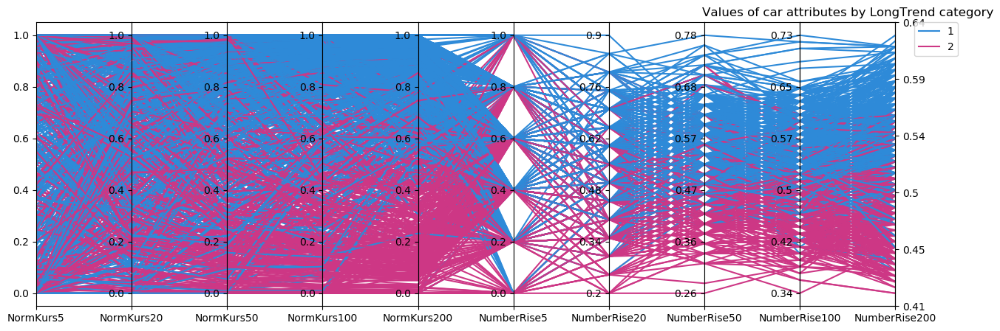

In [70]:
%%skip $skip_feature_analysis
m.rc_file_defaults() #Reset sns

colors = ['#2e8ad8', '#cd3785', '#c64c00', '#889a00']
plotParallelCoordinates(df_fv, cols, colors, comparison_name)

### Visualize Data with t-SNE

In [71]:
%%skip $skip_feature_analysis
#Select a random subset to visualize
import random

#Reduce the training set with the number of samples randomly chosen
X_train_index_subset = sup.get_data_subset_index(1000, X_scaled)

Cutting the data to  1000
Created a training subset


In [72]:
%%skip $skip_feature_analysis
from sklearn.manifold import TSNE
#%matplotlib notebook
#%matplotlib inline

np.random.seed(0)
#X_embedded = TSNE(n_components=2, perplexity=5.0, early_exaggeration=12.0, n_iter=5000, 
#                  n_iter_without_progress=1000, learning_rate=10).fit_transform(embedded)
X_embedded = TSNE(n_components=2, perplexity=10.0, early_exaggeration=100.0, n_iter=5000, 
                  n_iter_without_progress=1000, learning_rate=10).fit_transform(X_scaled.iloc[X_train_index_subset,:])

#### Plot t-SNE with best parameters

In [73]:
%matplotlib inline
m.rc_file_defaults() #Reset sns

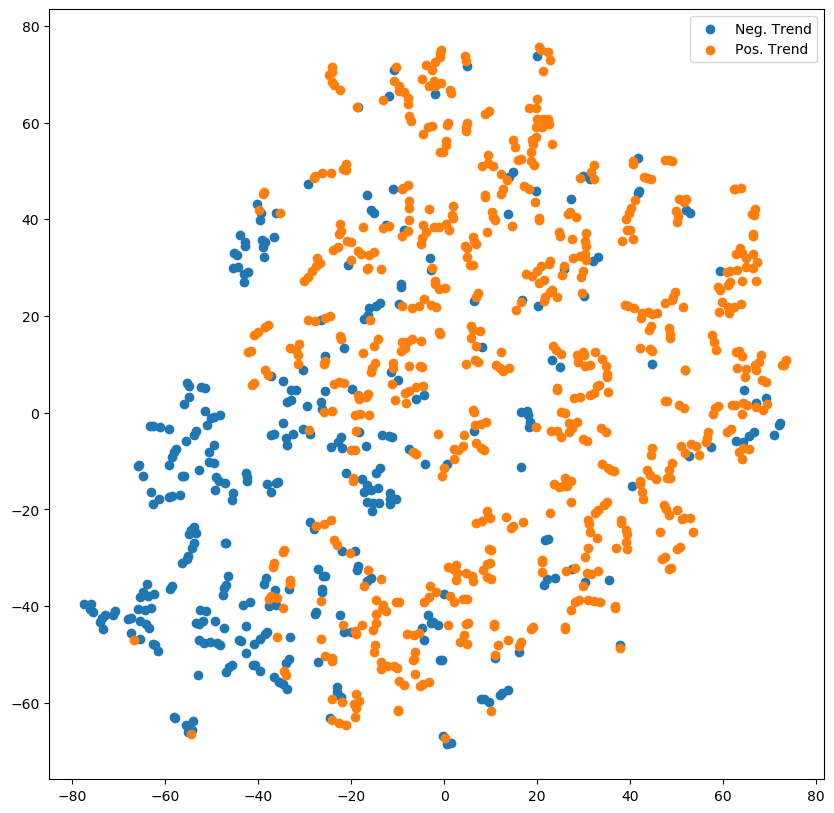

In [74]:
%%skip $skip_feature_analysis
#Plot with texts added to the graphs

#from adjustText import adjust_text
targets = np.array(y[X_train_index_subset]).flatten()

plt.figure(figsize=(10,10))
texts = []
for i, t in enumerate(set(targets)):
    idx = targets == t
    #for x, y in zip(X_embedded[idx, 0], X_embedded[idx, 1]):
        #texts.append(plt.text(x, y, t))
    plt.scatter(X_embedded[idx, 0], X_embedded[idx, 1], label=class_labels[t])   

#adjust_text(texts, force_points=0.2, force_text=0.2, expand_points=(1,1), expand_text=(1,1), arrowprops=dict(arrowstyle="-", color='black', lw=0.5)) 

plt.legend(bbox_to_anchor=(1, 1));

#### t-SNE Parameter Grid Search

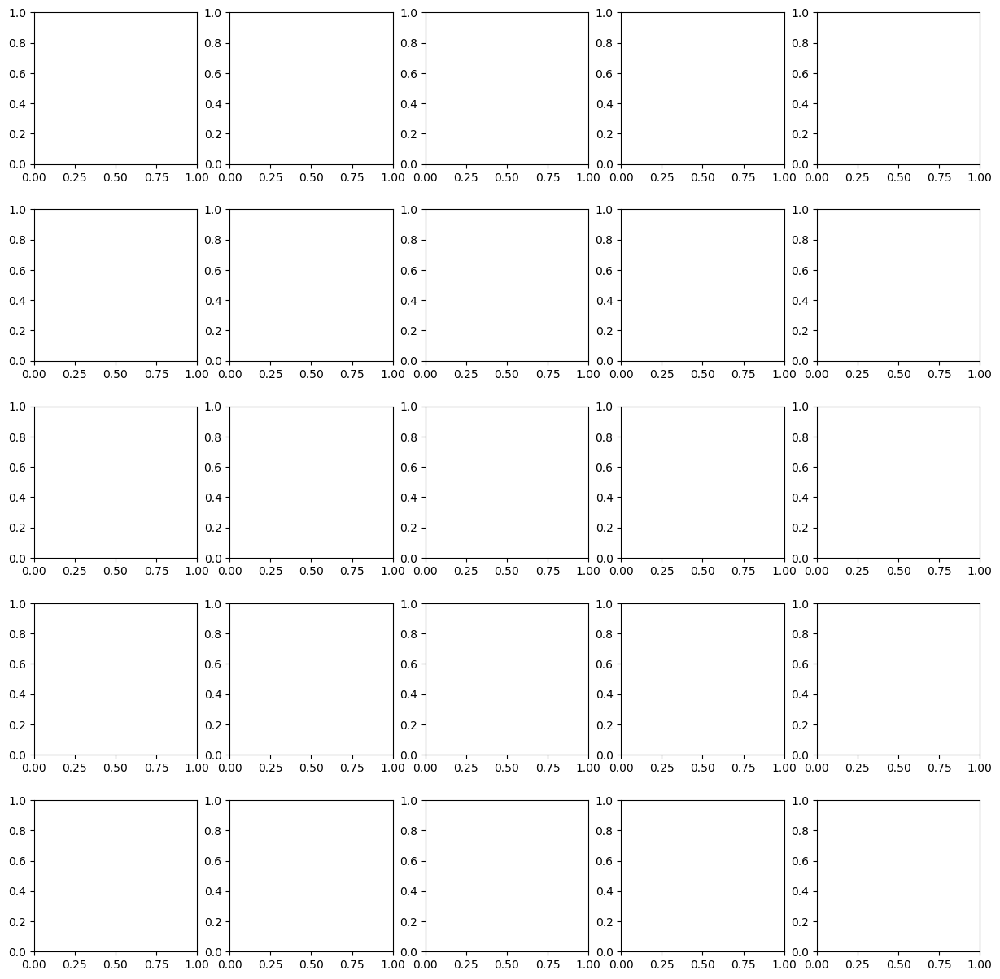

In [75]:
%%skip $skip_feature_analysis
from IPython.display import clear_output

#Optimize t-sne plot
tne_gridsearch = False

#Create a TSNE grid search with two variables
perplex = [5, 10, 30, 50, 100]
exaggregation = [5, 12, 20, 50, 100]
#learning_rate = [10, 50, 200]

fig, axarr = plt.subplots(len(perplex), len(exaggregation), figsize=(15,15))

if tne_gridsearch == True:
    #for m,l in enumerate(learning_rate):
    for k,p in enumerate(perplex):
        #print("i {}, p {}".format(i, p))
        for j,e in enumerate(exaggregation):
            #print("j {}, e {}".format(j, e))
            X_embedded = TSNE(n_components=2, perplexity=p, early_exaggeration=e, n_iter=5000, 
                              n_iter_without_progress=1000, learning_rate=10).fit_transform(X_scaled.iloc[X_train_index_subset,:])

            for i, t in enumerate(set(targets)):
                idx = targets == t
                axarr[k,j].scatter(X_embedded[idx, 0], X_embedded[idx, 1], label=class_labels[t])

            axarr[k,j].set_title("p={}, e={}".format(p, e))
        
            clear_output(wait=True)
            print('perplex paramater={}/{}, exaggregation parameterj={}/{}'.format(k, len(perplex), j, len(exaggregation)))
        
fig.subplots_adjust(hspace=0.3)

### UMAP Cluster Analysis
Use a supervised/unsupervised analysis to make the clusters

In [76]:
%%skip $skip_feature_analysis
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='white', context='poster')

#import umap
import umap.umap_ as umap  #Work around from https://github.com/lmcinnes/umap/issues/24

#%time #Time of the whole cell
embeddingUnsupervised = umap.UMAP(n_neighbors=5).fit_transform(X_scaled)
#%time #Time of the whole cell
embeddingSupervised = umap.UMAP(n_neighbors=5).fit_transform(X_scaled, y=y)

C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\.conda\envs\env_ml\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\.conda\envs\env_ml\lib\site

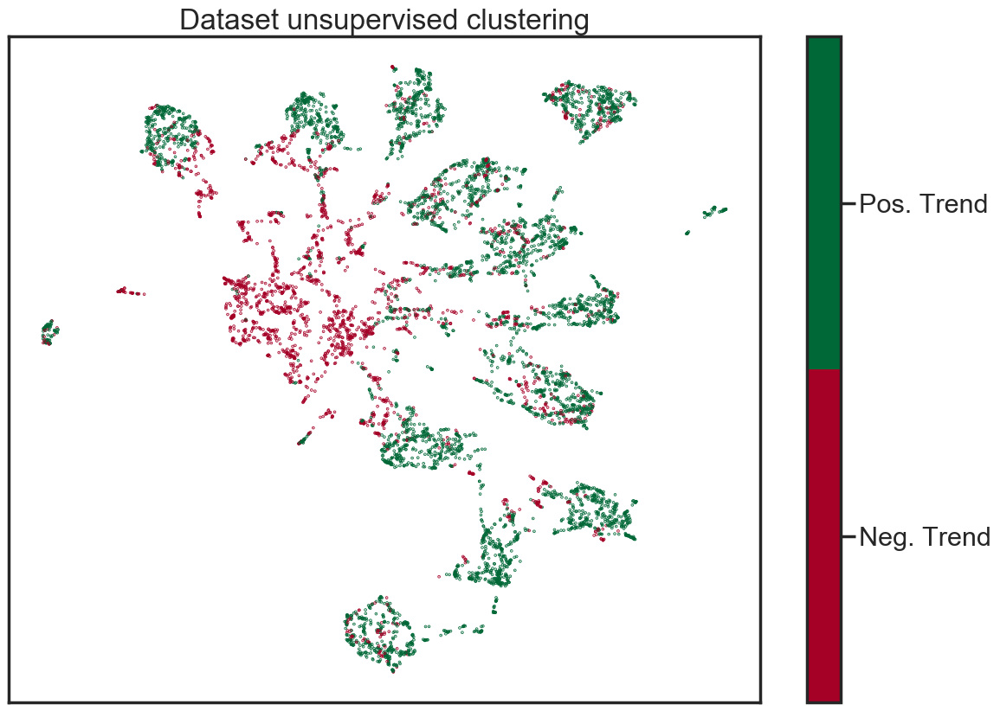

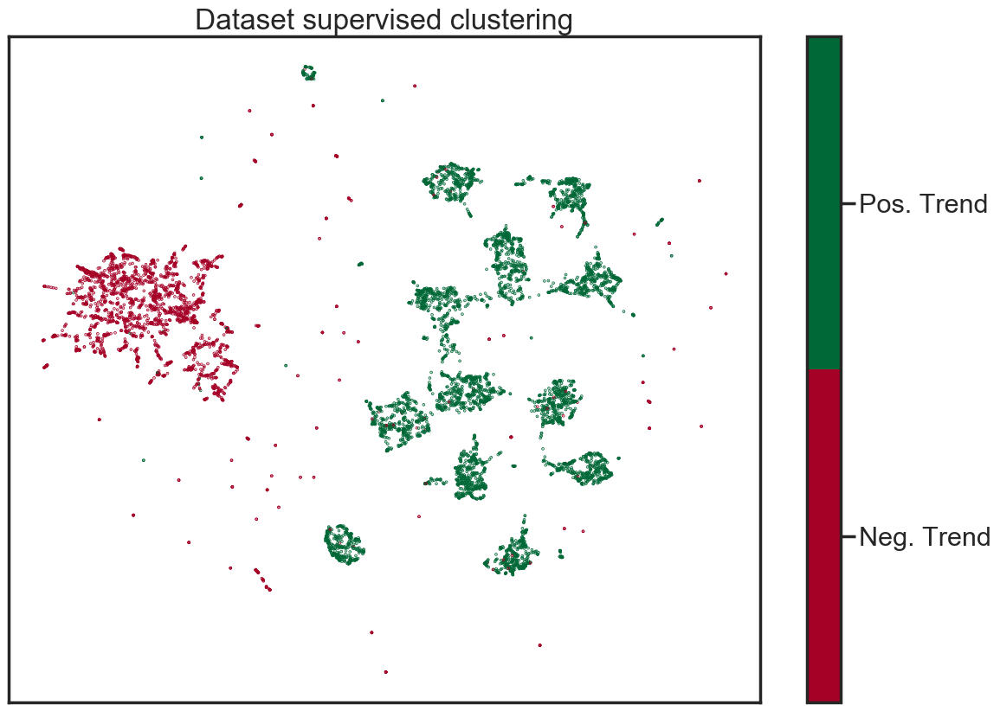

In [77]:
%%skip $skip_feature_analysis
vis.plotUmap(embeddingUnsupervised, y, list(class_labels.values()), 'Dataset unsupervised clustering', cmapString='RdYlGn')
vis.plotUmap(embeddingSupervised, y, list(class_labels.values()), 'Dataset supervised clustering')

### PCA Analysis

C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in log


95% variance covered with the 30 first components. Values=[0.32  0.55  0.628 0.668 0.693 0.714 0.733 0.75  0.763 0.774 0.785 0.795
 0.805 0.815 0.825 0.834 0.843 0.852 0.861 0.869 0.878 0.887 0.895 0.904
 0.912 0.92  0.928 0.936 0.943 0.95 ]


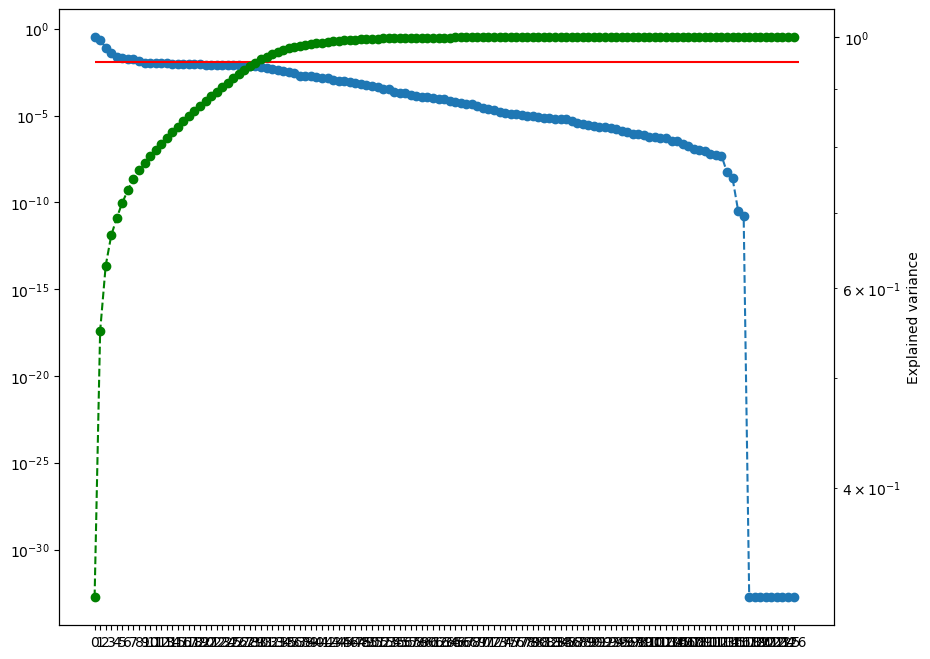

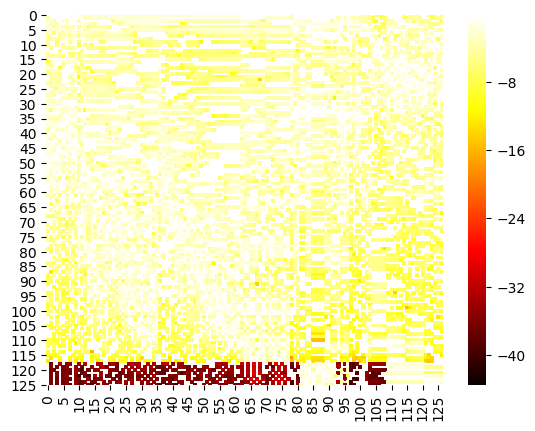

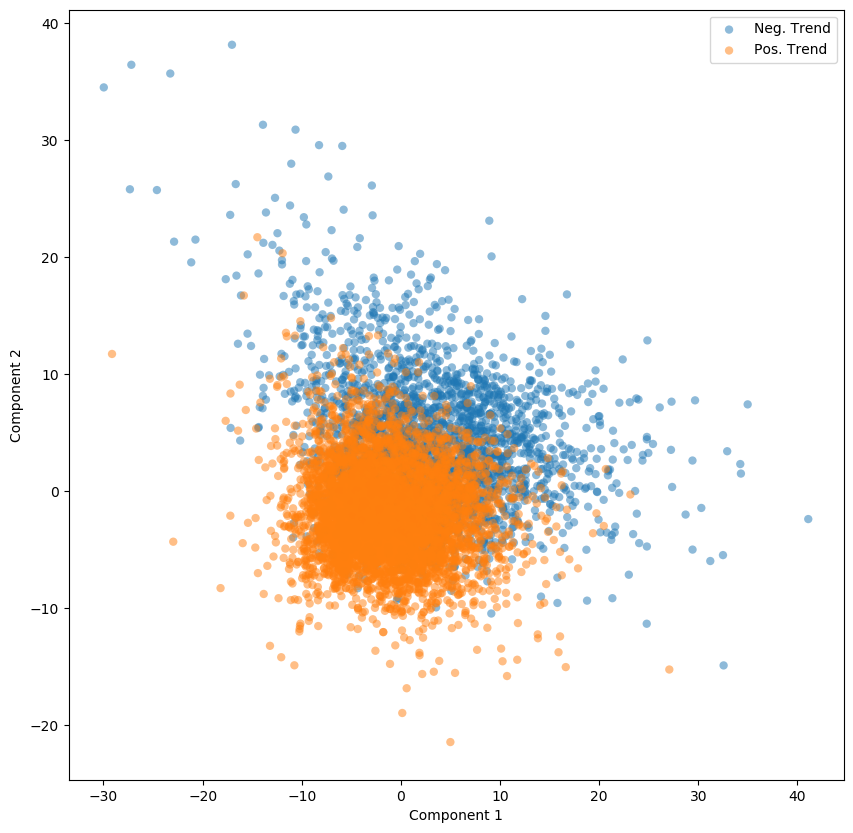

In [78]:
%%skip $skip_feature_analysis
import sklearn.datasets as ds
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

m.rc_file_defaults() #Reset sns

pca_trafo = PCA().fit(X_scaled);
pca_values = pca_trafo.transform(X_scaled)
#from adjustText import adjust_text
targets = np.array(y).flatten()

fig, ax1 = plt.subplots(figsize=(10, 8))
plt.semilogy(pca_trafo.explained_variance_ratio_, '--o');
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
plt.semilogy(pca_trafo.explained_variance_ratio_.cumsum(), '--o', color='green');
plt.xlabel("Principal Component")
plt.ylabel("Explained variance")
plt.xticks(np.arange(0, len(pca_trafo.explained_variance_ratio_)))
plt.hlines(0.95, 0, len(pca_trafo.explained_variance_ratio_.cumsum()), colors='red', linestyles='solid', label='95% variance covered')

fig = plt.figure()
sns.heatmap(np.log(pca_trafo.inverse_transform(np.eye(X_scaled.shape[1]))), cmap="hot", cbar=True)

necessary_components = pca_trafo.explained_variance_ratio_.cumsum()[pca_trafo.explained_variance_ratio_.cumsum()<0.95]
print("95% variance covered with the {} first components. Values={}". format(len(necessary_components), necessary_components))

plt.figure(figsize=(10,10))
#plt.scatter(pca_values[:,0], pca_values[:,1], c=targets, edgecolor='none', label=class_labels.values(), alpha=0.5)
for i, t in enumerate(set(targets)):
    idx = targets == t
    plt.scatter(pca_values[idx, 0], pca_values[idx, 1], label=class_labels[t], edgecolor='none', alpha=0.5)  

plt.legend(labels=class_labels.values(), bbox_to_anchor=(1, 1));
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

## Feature Selection

In [79]:
#Data has already been scaled

In [80]:
#Select a random subset to visualize
import random

#Reduce the training set with the number of samples randomly chosen
X_train_index_subset = sup.get_data_subset_index(1000, X_scaled)

relevantFeatureList = []
selected_feature_list = pd.DataFrame()

Cutting the data to  1000
Created a training subset


In [81]:
#Predict with logistic regression
from sklearn.linear_model import LogisticRegression

def predict_features_simple(X, y):
    clf = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial').fit(X, y)
    return clf.score(X, y)

### Lasso Feature Selection

Best alpha using built-in LassoCV: 0.006098
Best score using built-in LassoCV: 0.666571
Lasso picked 18 variables and eliminated the other 109 variables
['MA150Norm', 'NumberRise50', 'NormKurs20', 'NumberRise20', 'MACD_12_26_9Diff', 'MACDS_12_26_9Diff', 'RSI_14', 'NumberRise5', 'month_year__10', 'RSI3sign', 'MACD_5_35_5', 'month_year__9', 'month_year__1', 'month_year__6', 'month_year__7', 'month_year__5', 'NumberRise200', 'NormKurs200']


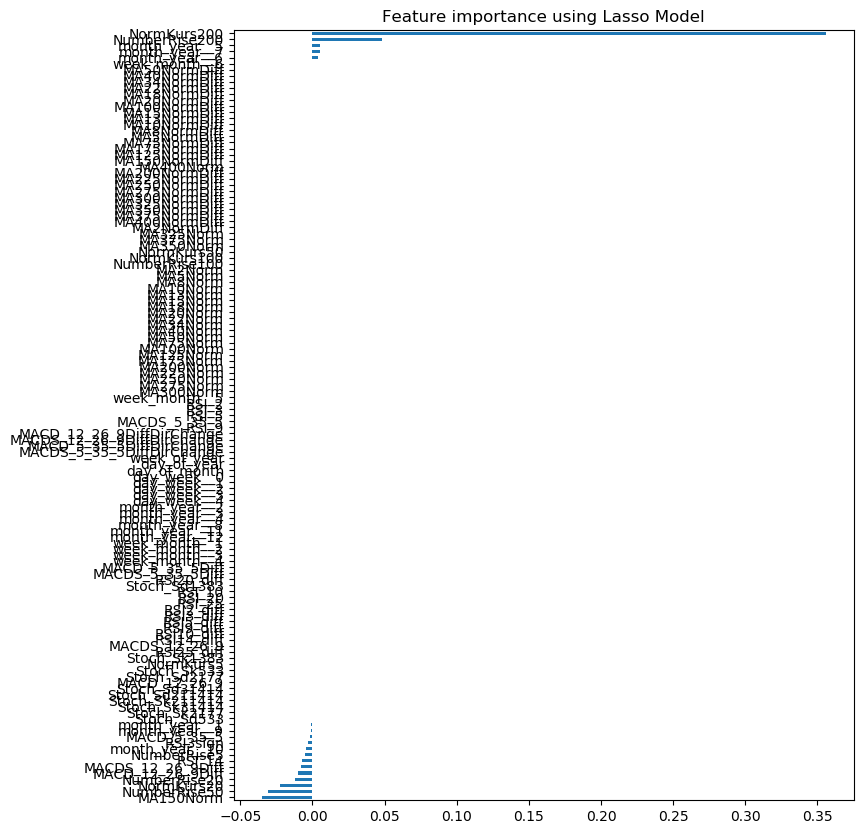

Prediction of training data with logistic regression: 0.92


In [82]:
%%skip $skip_feature_selection
#%matplotlib inline
from sklearn.linear_model import LassoCV

m.rc_file_defaults() #Reset sns

def execute_lasso_feature_selection(X_scaled, y):
    reg = LassoCV(cv=10, max_iter = 100000)
    reg.fit(X_scaled, y)
    coef = pd.Series(reg.coef_, index = X_scaled.columns)
    print("Best alpha using built-in LassoCV: %f" %reg.alpha_)
    print("Best score using built-in LassoCV: %f" %reg.score(X_scaled,y))
    print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
    imp_coef = coef.sort_values()
    coefList = list(imp_coef[imp_coef!=0].index)
    print(coefList)

    #plt.figure()
    m.rcParams['figure.figsize'] = (8.0, 10.0)
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using Lasso Model")
    plt.show()
    
    return coefList
    
#if do_feature_analysis==True:
coefList = execute_lasso_feature_selection(X_scaled, y)
selected_feature_list = selected_feature_list.append(pd.Series(name='Lasso', data=coefList))
relevantFeatureList.extend(coefList)

print("Prediction of training data with logistic regression: {0:.2f}".format(predict_features_simple(X_scaled[coefList], y)))

### Tree based feature selection

[0.001 0.003 0.019 0.043 0.09  0.002 0.004 0.017 0.031 0.018 0.001 0.001
 0.002 0.002 0.002 0.002 0.003 0.006 0.004 0.005 0.007 0.01  0.012 0.023
 0.023 0.039 0.032 0.063 0.048 0.035 0.029 0.041 0.03  0.044 0.034 0.043
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.002 0.002 0.002 0.003 0.003 0.004 0.011 0.009 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.004 0.004 0.002 0.002 0.006
 0.005 0.01  0.007 0.007 0.006 0.008 0.008 0.005 0.01  0.002 0.004 0.002
 0.003 0.001 0.002 0.001 0.001 0.006 0.007 0.002 0.    0.001 0.    0.
 0.    0.002 0.002 0.002 0.002 0.004 0.004 0.004 0.007 0.004 0.003 0.002
 0.002 0.001 0.001 0.002 0.001 0.002 0.   ]
Best score: 1.000000
Tree search picked 22 variables and eliminated the other 105 variables
['Stoch_Sk211414', 'RSI_20', 'MA75Norm', 'NumberRise50', 'NumberRise200', 'NormKurs50', 'MA125Norm', 'MA100Norm', 'MA275Norm', 'MA325Norm

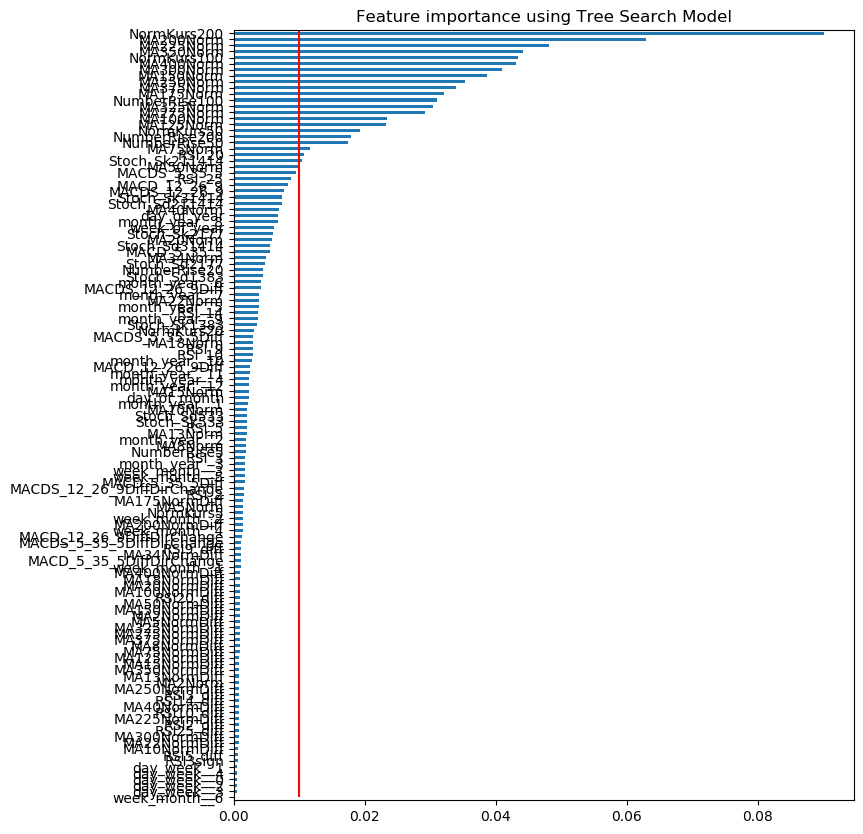

Prediction of training data with logistic regression: 0.92


C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


In [83]:
%%skip $skip_feature_selection
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel

def execute_treebased_feature_selection(X_scaled, y):
    clf = ExtraTreesClassifier(n_estimators=50)
    clf = clf.fit(X_scaled, y)
    print(clf.feature_importances_)
    print("Best score: %f" %clf.score(X_scaled, y))
    model = SelectFromModel(clf, prefit=True)
    X_new = model.transform(X_scaled)
    X_new.shape

    threshold = 0.010
    tree_coef = pd.Series(clf.feature_importances_, index = X_scaled.columns)

    print("Tree search picked " + str(sum(tree_coef >= threshold)) + " variables and eliminated the other " +  str(sum(tree_coef < threshold)) + " variables")
    imp_treecoef = tree_coef.sort_values()
    treecoefList = list(imp_treecoef[imp_treecoef>threshold].index)
    print(treecoefList)

    plt.figure()
    m.rcParams['figure.figsize'] = (8.0, 10.0)
    imp_treecoef.plot(kind = "barh")
    plt.title("Feature importance using Tree Search Model")
    plt.vlines(threshold, 0, len(X_scaled.columns), color='red')
    plt.show()
    
    return treecoefList

#if do_feature_analysis==True:
treecoefList = execute_treebased_feature_selection(X_scaled, y)
selected_feature_list = selected_feature_list.append(pd.Series(name='Tree', data=treecoefList))
relevantFeatureList.extend(treecoefList)

print("Prediction of training data with logistic regression: {0:.2f}".format(predict_features_simple(X_scaled[treecoefList], y)))

### Backward Elimination

In [84]:
%%skip $skip_feature_selection
#Backward Elimination - Wrapper method
import statsmodels.api as sm

def execute_backwardelimination_feature_selection(X_scaled, y):
    cols = list(X_scaled.columns)
    pmax = 1
    while (len(cols)>0):
        p= []
        X_1 = X_scaled[cols]
        X_1 = sm.add_constant(X_1)
        model = sm.OLS(y,X_1).fit()
        p = pd.Series(model.pvalues.values[1:],index = cols)      
        pmax = max(p)
        feature_with_p_max = p.idxmax()
        if(pmax>0.05):
            cols.remove(feature_with_p_max)
        else:
            break
    selected_features_BE = cols

    print(selected_features_BE)
    print("\nNumber of features={}. Original number of features={}\n".format(len(selected_features_BE), len(X_scaled.columns)))
    [print("column {} removed".format(x)) for x in X_scaled.columns if x not in selected_features_BE]
    print("Finished")
    
    return selected_features_BE

#if do_feature_analysis==True:
selected_features_BE = execute_backwardelimination_feature_selection(X_scaled, y)
relevantFeatureList.extend(selected_features_BE)
selected_feature_list = selected_feature_list.append(pd.Series(name='Backward_Elimination', data=selected_features_BE))

print("Prediction of training data with logistic regression: {0:.2f}".format(predict_features_simple(X_scaled[selected_features_BE], y)))

C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\numpy\core\fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


['NormKurs20', 'NormKurs50', 'NormKurs100', 'NormKurs200', 'NumberRise5', 'NumberRise50', 'NumberRise100', 'NumberRise200', 'MA5Norm', 'MA34Norm', 'MA100Norm', 'MA125Norm', 'MA175Norm', 'MA200Norm', 'MA225Norm', 'MA250Norm', 'MA300Norm', 'MA325Norm', 'MA375Norm', 'MA400Norm', 'MA13NormDiff', 'MA34NormDiff', 'MA50NormDiff', 'MA75NormDiff', 'MA150NormDiff', 'MA200NormDiff', 'MA225NormDiff', 'MA325NormDiff', 'MA375NormDiff', 'MA400NormDiff', 'RSI_3', 'RSI_5', 'RSI_9', 'RSI_10', 'RSI_14', 'RSI3sign', 'Stoch_Sd1383', 'Stoch_Sk2177', 'Stoch_Sd2177', 'Stoch_Sk211414', 'Stoch_Sd211414', 'Stoch_Sk31414', 'Stoch_Sd31414', 'MACDS_12_26_9', 'MACD_5_35_5', 'MACD_12_26_9Diff', 'MACD_5_35_5Diff', 'MACDS_5_35_5Diff', 'day_of_year', 'day_of_month', 'month_year__1', 'month_year__2', 'month_year__3', 'month_year__4', 'month_year__5', 'month_year__6', 'month_year__7', 'month_year__8', 'month_year__9', 'month_year__10', 'month_year__11', 'month_year__12']

Number of features=62. Original number of features

C:\Users\wendt.ICT\.conda\envs\env_ml\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


### Recursive Elimination with Logistic Regression

In [85]:
%%skip $skip_feature_selection
#Recursive Elimination - Wrapper method, Feature ranking with recursive feature elimination
from sklearn.linear_model import LogisticRegressionCV
from sklearn.feature_selection import RFE

def execute_recursive_elimination_feature_selection(X_scaled, y):
    model = LogisticRegressionCV(solver='liblinear', cv=3)
    print("Start Recursive Elimination. Fit model with {} examples.".format(X_scaled.shape[0]))
    #Initializing RFE model, 3 features selected
    rfe = RFE(model, 1) #It has to be one to get a unique index
    #Transforming data using RFE
    X_rfe = rfe.fit_transform(X_scaled,y)
    #Fitting the data to model
    model.fit(X_rfe,y)

    print("Best accuracy score using built-in Logistic Regression: ", model.score(X_rfe, y))
    print("Ranking")
    rfe_coef = pd.Series(X_scaled.columns, index = rfe.ranking_-1).sort_index()
    print(rfe_coef)
    print("Select columns")

    
    print(X_scaled.columns[rfe.support_].values)
    
    return X_scaled.columns[rfe.support_].values, rfe_coef

#if do_feature_analysis==True:
relevant_features, rfe_coef = execute_recursive_elimination_feature_selection(X_scaled.iloc[X_train_index_subset], y[X_train_index_subset])
relevantFeatureList.extend(relevant_features)

step_size = np.round(len(X_scaled.columns)/4,0).astype("int")
for i in range(step_size, len(X_scaled.columns), step_size):
    selected_feature_list = selected_feature_list.append(pd.Series(name='RecursiveTop' + str(i), data=rfe_coef.loc[0:i-1]))
    print('Created RecursiveTop{}'.format(str(i)))

Start Recursive Elimination. Fit model with 1000 examples.
Best accuracy score using built-in Logistic Regression:  0.876
Ranking
0          MA325Norm
1          MA400Norm
2          MA175Norm
3      NumberRise200
4          MA125Norm
           ...      
122    MA300NormDiff
123      MA8NormDiff
124    MA275NormDiff
125     Stoch_Sk1383
126     MACDS_5_35_5
Length: 127, dtype: object
Select columns
['MA325Norm']
Created RecursiveTop32
Created RecursiveTop64
Created RecursiveTop96


In [86]:
#rfe_coef.loc[0:10].values

### Weighted values

In [87]:
#Weights
values, counts = np.unique(relevantFeatureList, return_counts=True)
s = pd.Series(index=values, data=counts).sort_values(ascending=False)
print(s)

NormKurs200          3
NumberRise50         3
NumberRise200        3
MA325Norm            3
MACD_12_26_9Diff     2
                    ..
MACDS_12_26_9Diff    1
MACDS_12_26_9        1
MA75NormDiff         1
MA75Norm             1
MA50NormDiff         1
Length: 69, dtype: int64


### Add Manually Selected Subset

In [88]:
#print subset
newval = [x for x, c in zip(values, counts) if c>1]
subsetColumns = newval#X.columns[rfe.support_].values #list(values)
display(subsetColumns)
selected_feature_list = selected_feature_list.append(pd.Series(name='Manual', data=subsetColumns))

['MA100Norm',
 'MA125Norm',
 'MA150Norm',
 'MA175Norm',
 'MA200Norm',
 'MA225Norm',
 'MA250Norm',
 'MA300Norm',
 'MA325Norm',
 'MA375Norm',
 'MA400Norm',
 'MACD_12_26_9Diff',
 'MACD_5_35_5',
 'NormKurs100',
 'NormKurs20',
 'NormKurs200',
 'NormKurs50',
 'NumberRise100',
 'NumberRise200',
 'NumberRise5',
 'NumberRise50',
 'RSI3sign',
 'RSI_14',
 'Stoch_Sk211414',
 'month_year__1',
 'month_year__10',
 'month_year__5',
 'month_year__6',
 'month_year__7',
 'month_year__9']

### Add all columns

In [89]:
selected_feature_list = selected_feature_list.append(pd.Series(name='All', data=X_scaled.columns))

In [90]:
#subsetColumns = X.columns[rfe.support_].values
#X_subset = X_raw[subsetColumns]
#display(X_subset.head(5))
selected_feature_list.transpose()

,Lasso,Tree,Backward_Elimination,RecursiveTop32,RecursiveTop64,RecursiveTop96,Manual,All
0,MA150Norm,Stoch_Sk211414,NormKurs20,MA325Norm,MA325Norm,MA325Norm,MA100Norm,NormKurs5
1,NumberRise50,RSI_20,NormKurs50,MA400Norm,MA400Norm,MA400Norm,MA125Norm,NormKurs20
2,NormKurs20,MA75Norm,NormKurs100,MA175Norm,MA175Norm,MA175Norm,MA150Norm,NormKurs50
3,NumberRise20,NumberRise50,NormKurs200,NumberRise200,NumberRise200,NumberRise200,MA175Norm,NormKurs100
4,MACD_12_26_9Diff,NumberRise200,NumberRise5,MA125Norm,MA125Norm,MA125Norm,MA200Norm,NormKurs200
...,...,...,...,...,...,...,...,...
122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week_month__2
123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week_month__3
124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week_month__4
125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week_month__5


## Save Subset

In [91]:
import csv

#=== Save features to a csv file ===#
print("Features shape {}".format(features.shape))
features.to_csv(model_features_filename, sep=';', index=True)
#np.savetxt(filenameprefix + "_X.csv", X, delimiter=";", fmt='%s')
print("Saved features to " + model_features_filename)

#=== Save the selected outcome to a csv file ===#
print("outcome shape {}".format(y.shape))
y_true = pd.DataFrame(y, columns=[conf['class_name']], index=outcomes.index)
y_true.to_csv(model_outcomes_filename, sep=';', index=True, header=True)
print("Saved features to " + model_outcomes_filename)

#=== Save new y labels to a csv file ===#
print("Class labels length {}".format(len(class_labels)))
with open(model_labels_filename, 'w') as f:
    for key in class_labels.keys():
        f.write("%s;%s\n"%(class_labels[key], key))  #Classes are saved inverse to the labelling in the file, i.e. first value, then key
print("Saved class names and id to " + model_labels_filename)

#=== Save x subset column names to a csv file as a list ===#
selected_feature_list.transpose().to_csv(selected_feature_columns_filename, sep=';', index=False, header=True)
print("Saved selected feature columns to " + selected_feature_columns_filename)

print("=== Data for {} prepared to be trained ===". format(conf['dataset_name']))

Features shape (7653, 127)
Saved features to 02_Training_Data/omxs30_train_LongTrend_features_for_model.csv
outcome shape (7653,)
Saved features to 02_Training_Data/omxs30_train_LongTrend_outcomes_for_model.csv
Class labels length 2
Saved class names and id to 02_Training_Data/omxs30_train_LongTrend_labels_for_model.csv
Saved selected feature columns to 02_Training_Data/omxs30_train_LongTrend_selected_feature_columns.csv
=== Data for omxs30_train prepared to be trained ===


## Debug and Experiment

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.linear_model import SGDClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV


# Define a pipeline to search for the best combination of PCA truncation
# and classifier regularization.
logistic = SGDClassifier(loss='log', penalty='l2', early_stopping=True,
                         max_iter=10000, tol=1e-5, random_state=0)
pca = PCA()
pipe = Pipeline(steps=[('pca', pca), ('logistic', logistic)])

digits = datasets.load_digits()
X_digits = digits.data
y_digits = digits.target

# Parameters of pipelines can be set using ‘__’ separated parameter names:
param_grid = {
    'pca__n_components': [5, 20, 30, 40, 50, 64],
    'logistic__alpha': np.logspace(-4, 4, 5),
}
search = GridSearchCV(pipe, param_grid, iid=False, cv=5)
search.fit(X_digits, y_digits)
print("Best parameter (CV score=%0.3f):" % search.best_score_)
print(search.best_params_)

# Plot the PCA spectrum
pca.fit(X_digits)

fig, (ax0, ax1) = plt.subplots(nrows=2, sharex=True, figsize=(6, 6))
ax0.plot(pca.explained_variance_ratio_, linewidth=2)
ax0.set_ylabel('PCA explained variance')

ax0.axvline(search.best_estimator_.named_steps['pca'].n_components,
            linestyle=':', label='n_components chosen')

from tqdm import tqdm
import time
%matplotlib inline

pbar = tqdm(total=100)
for i in range(10):
    time.sleep(0.1)
    pbar.update(10)
pbar.close()

from statsmodels import robust

a = np.matrix( [
    [ 80, 76, 77, 78, 79, 81, 76, 77, 79, 84, 75, 79, 76, 78 ],
    [ 66, 69, 76, 72, 79, 77, 74, 77, 71, 79, 74, 66, 67, 73 ]
    ], dtype=float )
robust.mad(a, axis=1)

from pandas.plotting import autocorrelation_plot

autocorrelation_plot(df_timegraph['Close'])
plt.show()